# In the name of God
### HW6
### Deep Q-Learning



**Name:** Danial Ataie

**Std. No.:** 99100455


### Deep Q-Learning (DQN)

Deep Q-Learning is a popular algorithm in reinforcement learning that combines the ideas of Q-learning, a traditional reinforcement learning method, with deep neural networks. The goal is to train an agent to make decisions by estimating the optimal action-value function Q, which represents the expected cumulative future rewards for taking a particular action in a given state.

Key components of DQN:

- **Experience Replay:** To break the temporal correlation in sequential data and improve sample efficiency, we use an experience replay buffer to store and sample past experiences.
- **Target Networks:** The use of two separate networks, the main network and a target network, helps stabilize training by decoupling the update targets from the online network's constantly changing values.

### The Lunar Lander Problem

The task is to control a lunar lander and guide it to land safely on the moon's surface. The agent needs to learn a policy that takes into account the lunar lander's state (position, velocity, angle, angular velocity, etc.) and chooses appropriate actions (thrust left, thrust right, thrust up, or do nothing) to achieve a safe landing.

### Overview

- **Environment:** LunarLander-v2 from OpenAI Gym.
- **Objective:** Train an agent to learn a policy for landing the lunar lander safely.
- **Techniques:** Deep Q-Learning, Experience Replay, Target Networks.

### Instructions

1. Follow the instructions and comments in the code cells to implement and understand each component.
2. Replace the `#####TO DO#####` placeholders with your code.
3. Experiment with hyperparameters and observe how they affect the training process.
4. Run the notebook to train the agent and play the game with the trained model.
5. Answer any provided questions or tasks to reinforce your understanding.

### Prerequisites

Make sure you have the following libraries installed:


In [1]:
!pip install --upgrade setuptools wheel

In [2]:
!pip install swig
!pip install gym[box2d]
!pip install imageio[ffmpeg]

# Imports

In [3]:
import numpy as np
import gym
import time
import torch
import torch.nn as nn
import torch.optim as optim
import os
import collections
import matplotlib.pyplot as plt
import collections
import pandas as pd

env = gym.make('LunarLander-v2')

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


In [4]:
class DQN(nn.Module):
    def __init__(self, in_features, n_actions):
        """
        Initialize the Deep Q-Network (DQN).

        Parameters:
        - in_features (int): Number of input features (dimension of the state).
        - n_actions (int): Number of possible actions in the environment.
        """
        super(DQN, self).__init__()

        # Implement the neural network architecture
        self.fc_layers = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, n_actions)
        )


    def forward(self, x):
        """
        Define the forward pass of the neural network.

        Parameters:
        - x (torch.Tensor): Input tensor representing the state.

        Returns:
        - torch.Tensor: Output tensor representing Q-values for each action.
        """
        return self.fc_layers(x)

In [10]:
import random

class ExperienceBuffer():
    def __init__(self, capacity):
        """
        Initialize the Experience Replay Buffer.

        Parameters:
        - capacity (int): Maximum capacity of the buffer.
        """
        self.exp_buffer = collections.deque(maxlen=capacity)

    def append(self, exp):
        """
        Append a new experience to the buffer.

        Parameters:
        - exp (tuple): Tuple representing a single experience (state, action, reward, done, next_state).
        """
        self.exp_buffer.append(exp)

    def __len__(self):
        """
        Get the current size of the buffer.

        Returns:
        - int: Number of experiences currently stored in the buffer.
        """
        return len(self.exp_buffer)

    def clear(self):
        """Clear all experiences from the buffer."""
        self.exp_buffer.clear()

    def sample(self, batch_size):
        """
        Sample a batch of experiences from the buffer.

        Parameters:
        - batch_size (int): Size of the batch to be sampled.

        Returns:
        - tuple: Batch of experiences (states, actions, rewards, dones, next_states).
        """
        # Implement the sampling logic
        batch = random.sample(self.exp_buffer, batch_size)
        states, actions, rewards, dones, next_states = zip(*batch)

        # Convert to NumPy arrays with appropriate data types
        states = np.array(states, dtype=np.float32)
        actions = np.array(actions, dtype=np.int64)
        rewards = np.array(rewards, dtype=np.float32)
        dones = np.array(dones, dtype=bool)
        next_states = np.array(next_states, dtype=np.float32)

        return states, actions, rewards, dones, next_states

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [11]:
class Agent():
    def __init__(self, env, buffer):
        """
        Initialize the agent.

        Parameters:
        - env: The environment the agent interacts with.
        - buffer: Experience replay buffer to store agent experiences.
        """
        self.env = env
        self.buffer = buffer
        self._reset()

    def _reset(self):
        """
        Reset the agent's state and total rewards to the initial state.
        """
        self.state = env.reset()
        self.total_rewards = 0.0

    def step(self, net, eps, device="cpu"):
        """
        Take a step in the environment using the provided neural network with epsilon-greedy strategy.

        Parameters:
        - net: The neural network representing the agent's policy.
        - eps (float): Epsilon value for epsilon-greedy exploration.
        - device (str): Device for neural network computations.

        Returns:
        - done_reward: Total rewards obtained in the episode if it is finished, otherwise None.
        """
        done_reward = None

        # Convert state to tensor
        state_tensor = torch.tensor([self.state], device=device, dtype=torch.float32)

        # Epsilon-greedy strategy
        if np.random.random() < eps:
            # Exploration
            action = self.env.action_space.sample()
        else:
            # Exploitation
            net.eval()
            with torch.no_grad():
                q_values = net(state_tensor)
            action = torch.argmax(q_values).item()

        # Take the action in the environment
        next_state, reward, done, _ = self.env.step(action)

        # Store the experience in replay buffer
        exp = (self.state, action, reward, done, next_state)
        self.buffer.append(exp)

        # Update total rewards and state
        self.total_rewards += reward
        self.state = next_state

        # Check if the episode is done
        if done:
            done_reward = self.total_rewards
            self._reset()

        return done_reward

In [12]:
# Hyperparameters
GAMMA = 0.99  # Discount factor for future rewards
EPSILON_START = 1.0  # Initial exploration probability (epsilon-greedy)
EPSILON_FINAL = 0.01  # Final exploration probability (epsilon-greedy)
EPSILON_DECAY_OBS = 10**5  # Number of observations for epsilon decay
BATCH_SIZE = 32  # Size of the experience replay batch
MEAN_GOAL_REWARD = 250  # Mean reward goal for solving the environment
REPLAY_BUFFER_SIZE = 10000  # Maximum capacity of the experience replay buffer
REPLAY_MIN_SIZE = 10000  # Minimum size of the experience replay buffer before training begins
LEARNING_RATE = 1e-4  # Learning rate for the neural network optimizer
SYNC_TARGET_OBS = 1000  # Number of observations before synchronizing target and online networks

In [13]:
import torch
import torch.nn.functional as F

def cal_loss(batch, net, tgt_net, device='cpu'):
    """
    Calculate the loss for Deep Q-Learning.

    Parameters:
    - batch (tuple): Batch of experiences (states, actions, rewards, dones, next_states).
    - net: The neural network representing the online Q-network.
    - tgt_net: The neural network representing the target Q-network.
    - device (str): Device for neural network computations (default is "cpu").

    Returns:
    - torch.Tensor: Loss value calculated using Mean Squared Error (MSE) loss.
    """

    states, actions, rewards, dones, next_states = batch
    states_v = torch.tensor(states).to(device)
    actions_v = torch.tensor(actions).to(device)
    rewards_v = torch.tensor(rewards).to(device)
    dones_v = torch.BoolTensor(dones).to(device)
    next_states_v = torch.tensor(next_states).to(device)

    # Calculate Q-values for the current states and selected actions
    state_action_values = net(states_v).gather(1, actions_v.unsqueeze(-1)).squeeze(-1)

    # Calculate the maximum Q-value for the next states using the target network
    next_state_values = tgt_net(next_states_v).max(1)[0]

    # Zero out Q-values for terminal states
    next_state_values[dones_v] = 0.0

    # Detach Q-values for the next states to avoid gradient flow
    next_state_values = next_state_values.detach()

    # Calculate the expected return for the current states
    expected_state_action_values = rewards_v + GAMMA * next_state_values

    # Implement the Mean Squared Error (MSE) loss calculation
    loss = F.mse_loss(state_action_values, expected_state_action_values)

    return loss

# Learning Curves
 Plot learning curves showing key metrics (e.g., total rewards, loss) over the course of training. Analyze the trends and identify key points in the learning process.

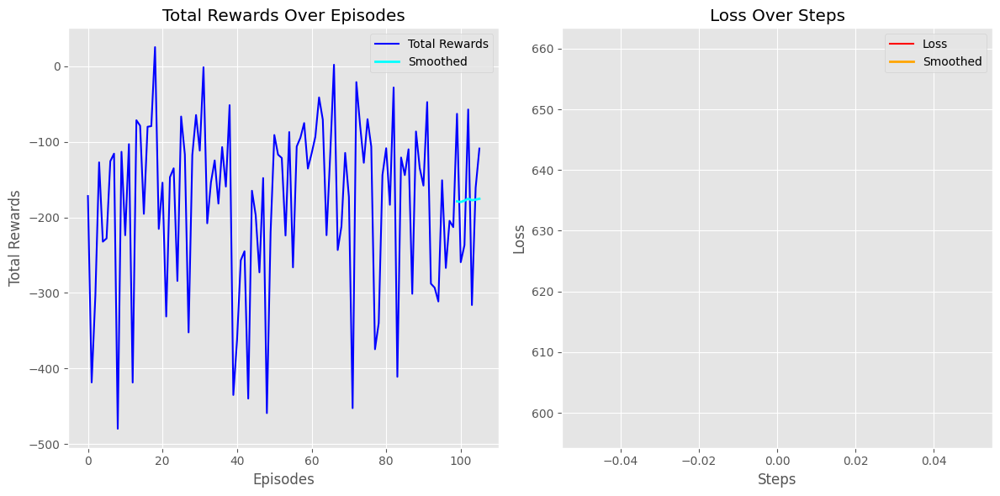


Mean Reward: -175.27013149129925


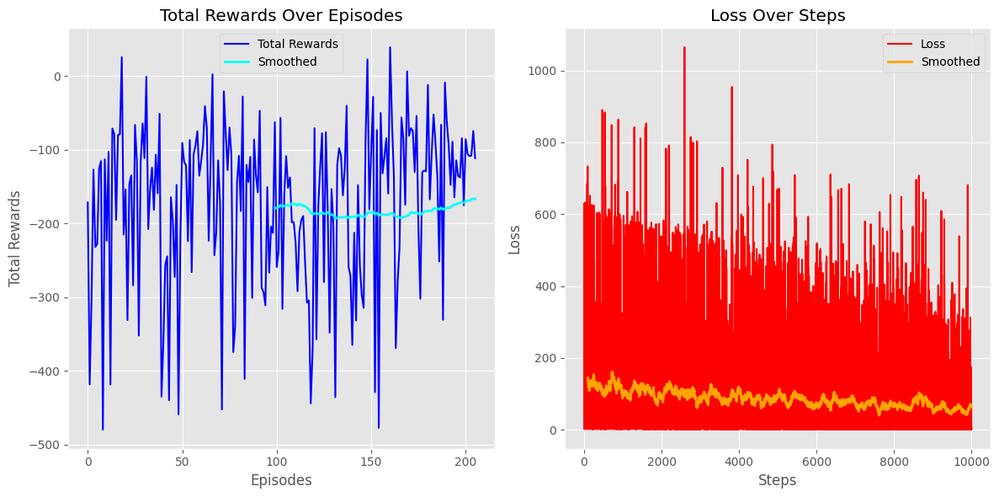


Mean Reward: -166.5628400715529
GAME : 20696, TIME ECLAPSED : 0.5031661987304688, EPSILON : 0.79304, MEAN_REWARD : -159.3613360284573
Reward -160.58919212591144 -> -159.3613360284573 Model Saved
GAME : 21411, TIME ECLAPSED : 0.3267645835876465, EPSILON : 0.78589, MEAN_REWARD : -146.94857378827345
Reward -147.94348341730907 -> -146.94857378827345 Model Saved
GAME : 22397, TIME ECLAPSED : 0.19533205032348633, EPSILON : 0.77603, MEAN_REWARD : -135.69772503882376
Reward -136.16365793647975 -> -135.69772503882376 Model Saved
GAME : 23922, TIME ECLAPSED : 0.3477163314819336, EPSILON : 0.76078, MEAN_REWARD : -123.18739347144779
Reward -124.14188950794733 -> -123.18739347144779 Model Saved
GAME : 25191, TIME ECLAPSED : 0.3340413570404053, EPSILON : 0.7480899999999999, MEAN_REWARD : -111.85646436918856
Reward -112.03356430351589 -> -111.85646436918856 Model Saved
GAME : 29908, TIME ECLAPSED : 0.37978124618530273, EPSILON : 0.70092, MEAN_REWARD : -100.799713373292
Reward -101.46612048762447 -> 

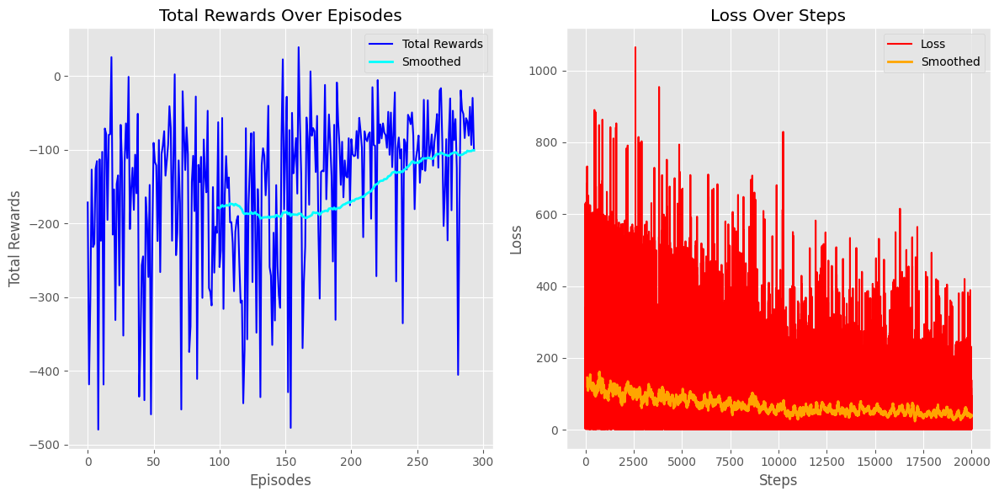


Mean Reward: -100.91300458182592
GAME : 31933, TIME ECLAPSED : 0.21430253982543945, EPSILON : 0.68067, MEAN_REWARD : -90.77643917006252
Reward -90.99277569412502 -> -90.77643917006252 Model Saved
GAME : 35233, TIME ECLAPSED : 0.28071069717407227, EPSILON : 0.64767, MEAN_REWARD : -80.38841837402217
Reward -80.74983771838792 -> -80.38841837402217 Model Saved
GAME : 37779, TIME ECLAPSED : 0.4680209159851074, EPSILON : 0.6222099999999999, MEAN_REWARD : -69.52677997805165
Reward -69.87038677340055 -> -69.52677997805165 Model Saved


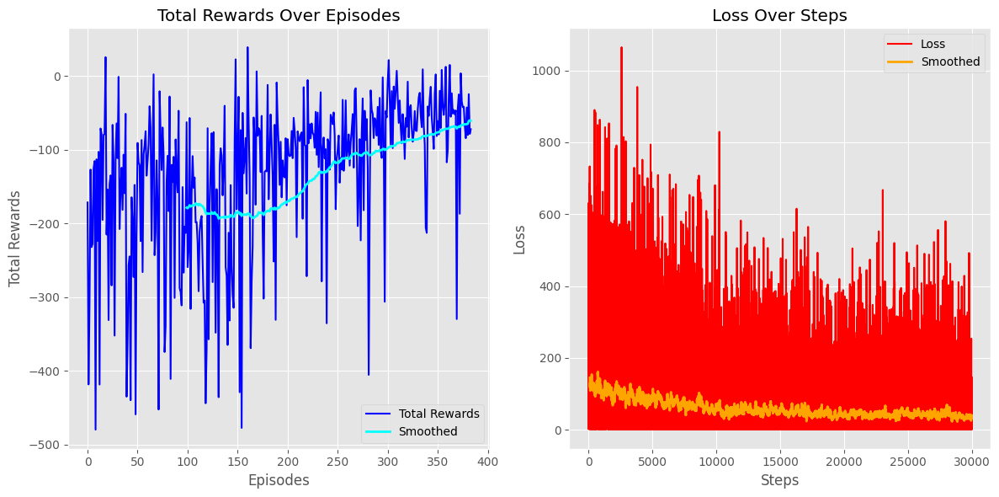


Mean Reward: -60.73240337483713
GAME : 40267, TIME ECLAPSED : 0.22314214706420898, EPSILON : 0.59733, MEAN_REWARD : -59.42701987615448
Reward -59.538281148011485 -> -59.42701987615448 Model Saved
GAME : 49695, TIME ECLAPSED : 0.38608717918395996, EPSILON : 0.50305, MEAN_REWARD : -49.16689091819103
Reward -49.290462889944784 -> -49.16689091819103 Model Saved


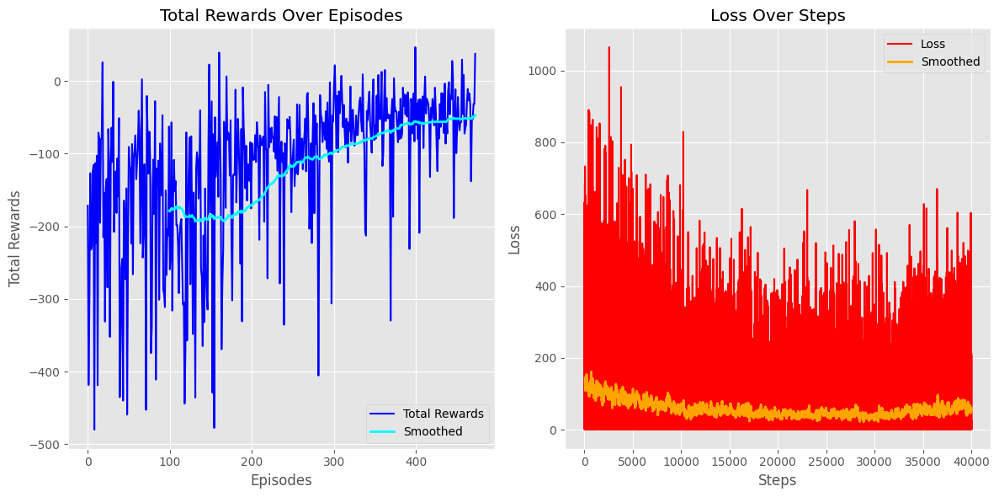


Mean Reward: -46.99152281441925


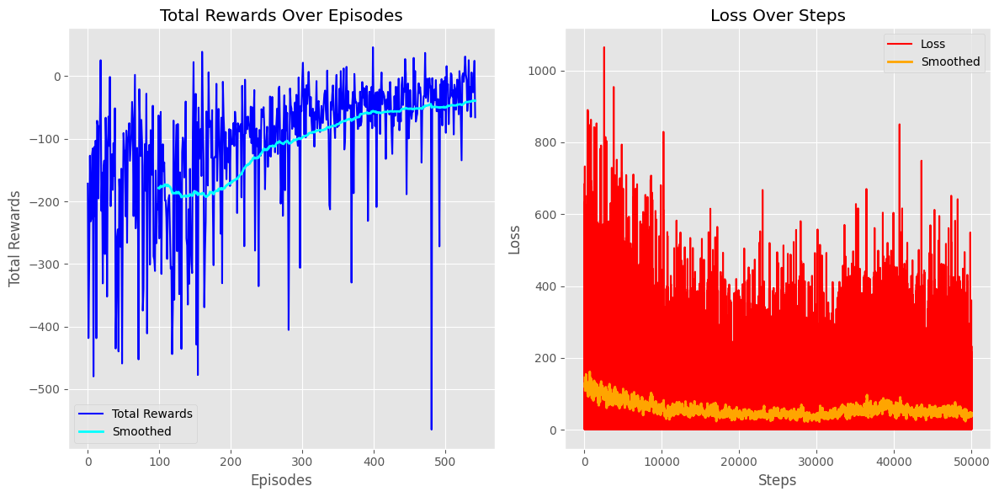


Mean Reward: -39.22664865156693
GAME : 60734, TIME ECLAPSED : 4.734955310821533, EPSILON : 0.39266, MEAN_REWARD : -38.449121007420324
Reward -38.77063543189843 -> -38.449121007420324 Model Saved


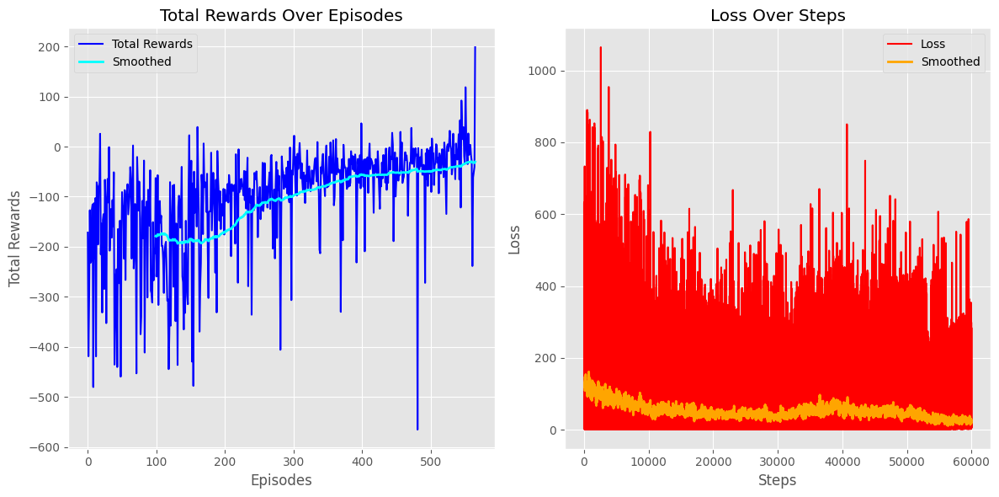


Mean Reward: -30.425109950912006
GAME : 70859, TIME ECLAPSED : 0.48934292793273926, EPSILON : 0.29140999999999995, MEAN_REWARD : -27.476105482599532
Reward -27.97869019007663 -> -27.476105482599532 Model Saved
GAME : 78630, TIME ECLAPSED : 4.134950399398804, EPSILON : 0.2137, MEAN_REWARD : -14.439723703723036
Reward -15.514974808126526 -> -14.439723703723036 Model Saved


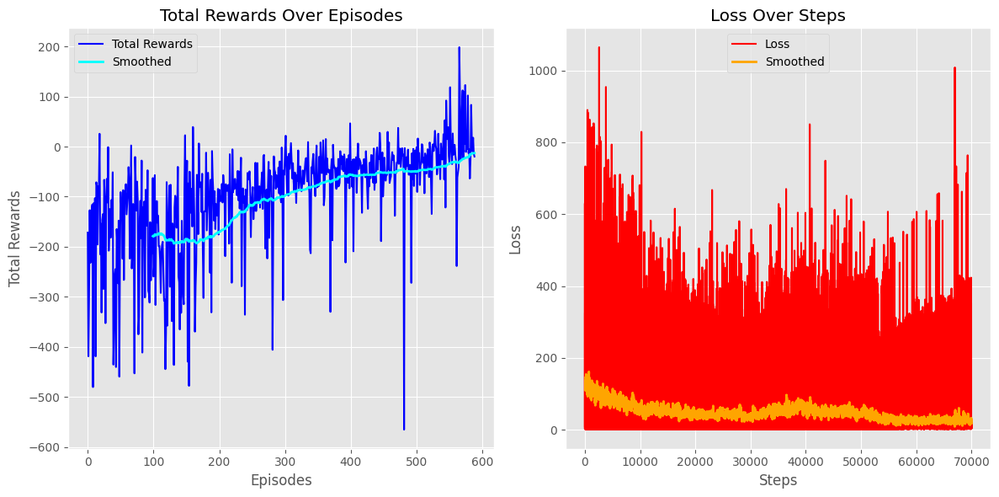


Mean Reward: -12.922834705910141
GAME : 86779, TIME ECLAPSED : 1.4520418643951416, EPSILON : 0.13221000000000005, MEAN_REWARD : -4.634474196348477
Reward -5.328776767719448 -> -4.634474196348477 Model Saved


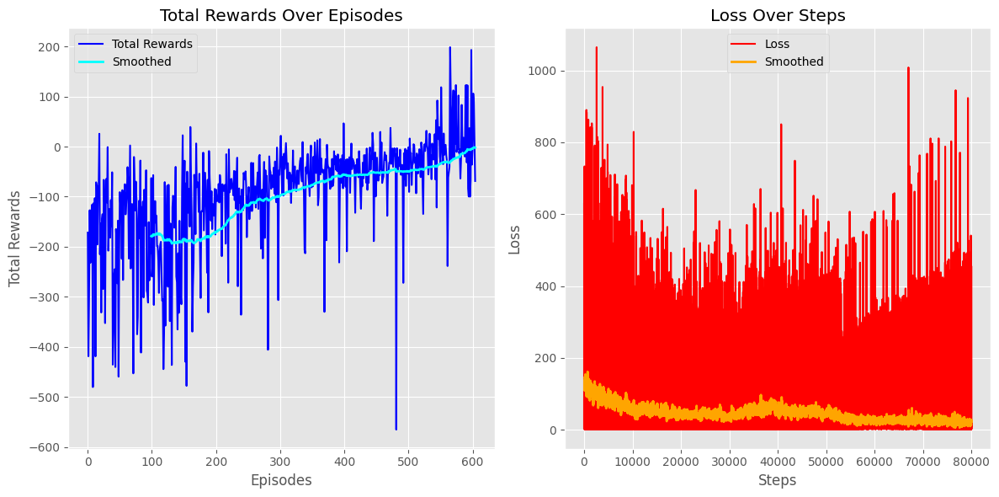


Mean Reward: -2.0944810511886147


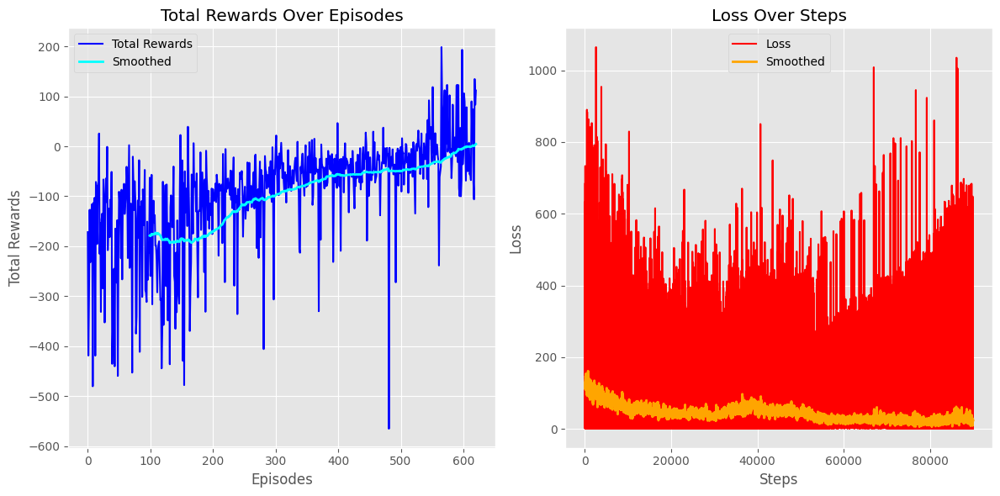


Mean Reward: 4.336500416616087
GAME : 101041, TIME ECLAPSED : 1.1052742004394531, EPSILON : 0.01, MEAN_REWARD : 6.1365086408403355
Reward 5.656746555497173 -> 6.1365086408403355 Model Saved
GAME : 108993, TIME ECLAPSED : 0.9591360092163086, EPSILON : 0.01, MEAN_REWARD : 16.55221769521409
Reward 16.477922418355003 -> 16.55221769521409 Model Saved


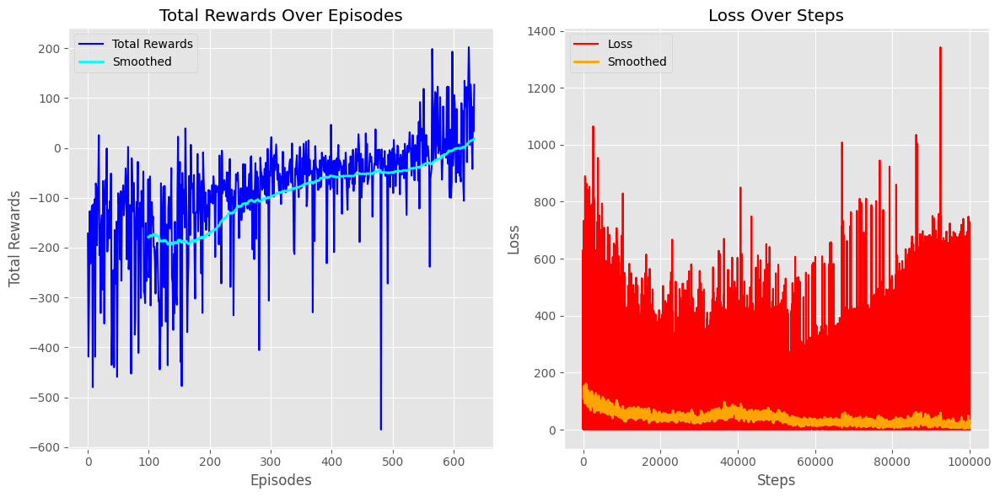


Mean Reward: 18.23904028890057
GAME : 117484, TIME ECLAPSED : 3.8589980602264404, EPSILON : 0.01, MEAN_REWARD : 28.24703585653846
Reward 27.144733067017775 -> 28.24703585653846 Model Saved


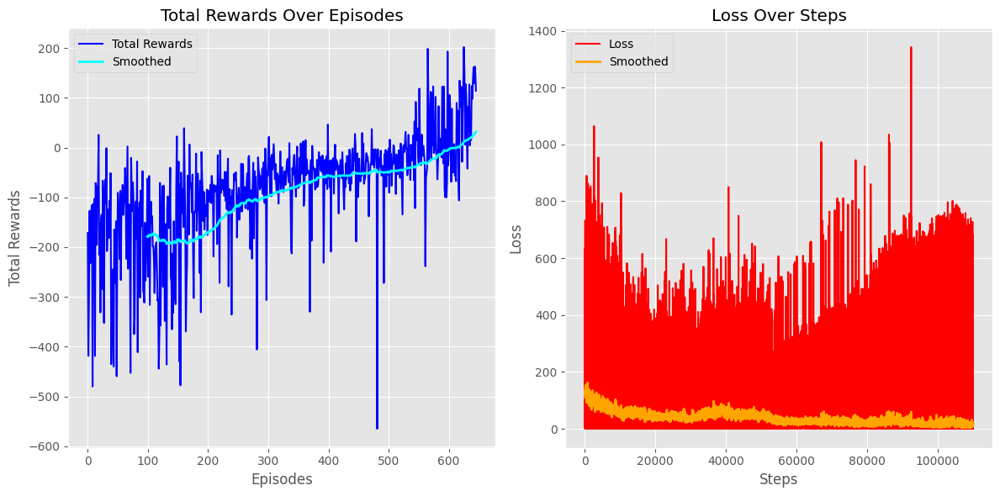


Mean Reward: 31.187535664264068
GAME : 126011, TIME ECLAPSED : 4.17424750328064, EPSILON : 0.01, MEAN_REWARD : 38.924391642058474
Reward 37.8331776055348 -> 38.924391642058474 Model Saved


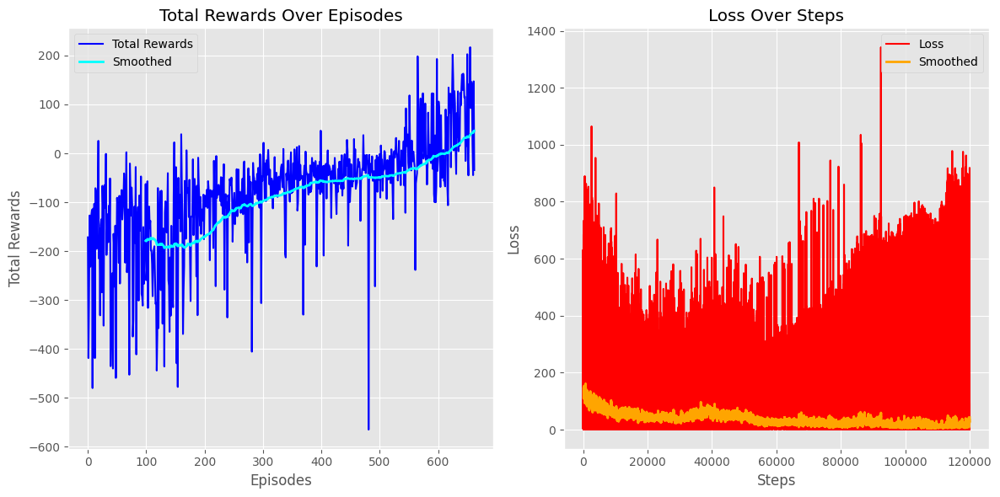


Mean Reward: 46.05018377349984


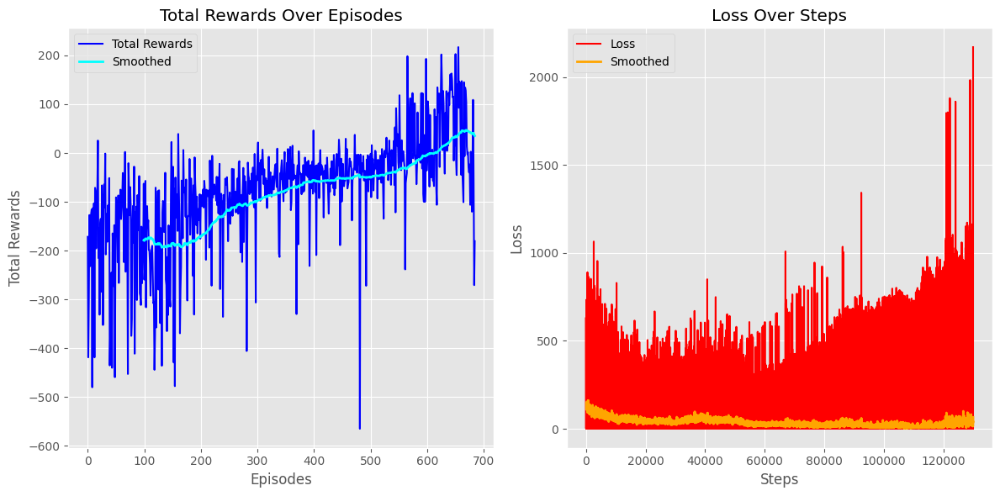


Mean Reward: 35.22530039491349


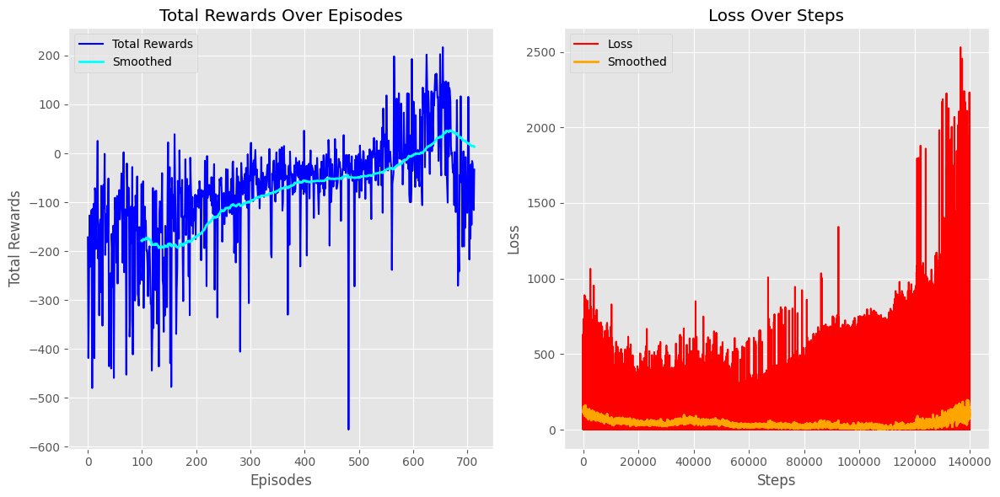


Mean Reward: 13.402553661664149


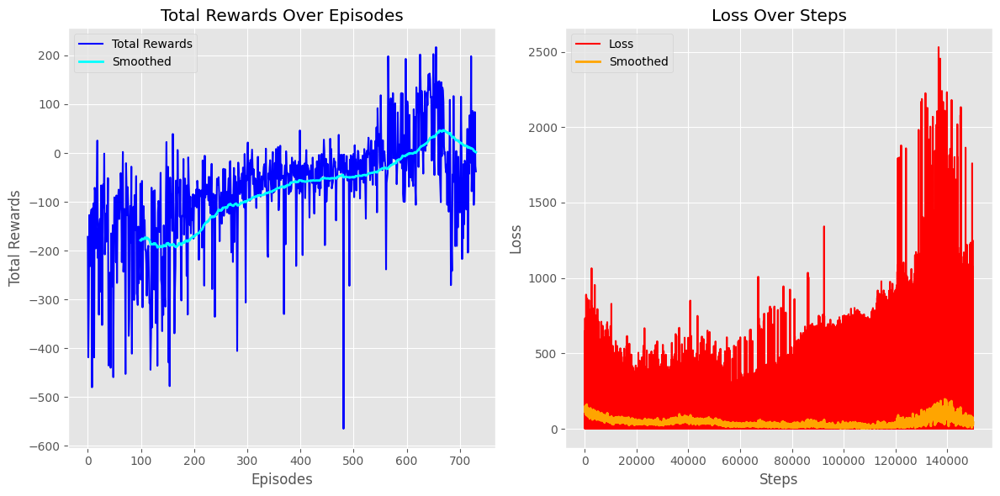


Mean Reward: 1.5912865639754603


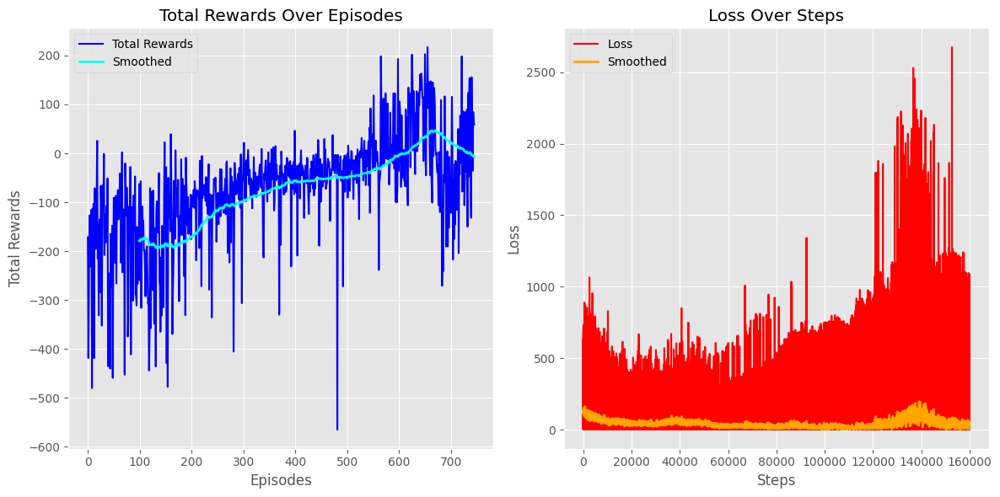


Mean Reward: -7.178486475148309


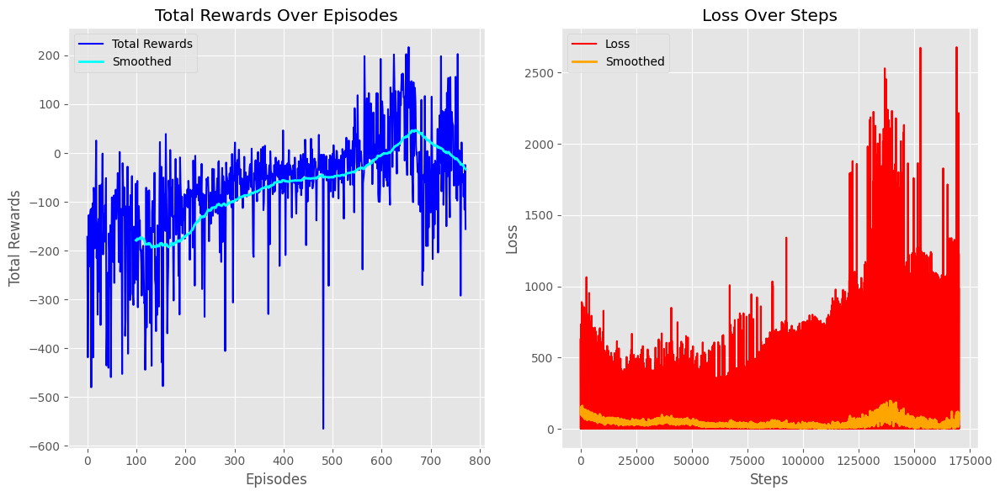


Mean Reward: -33.08931019263027


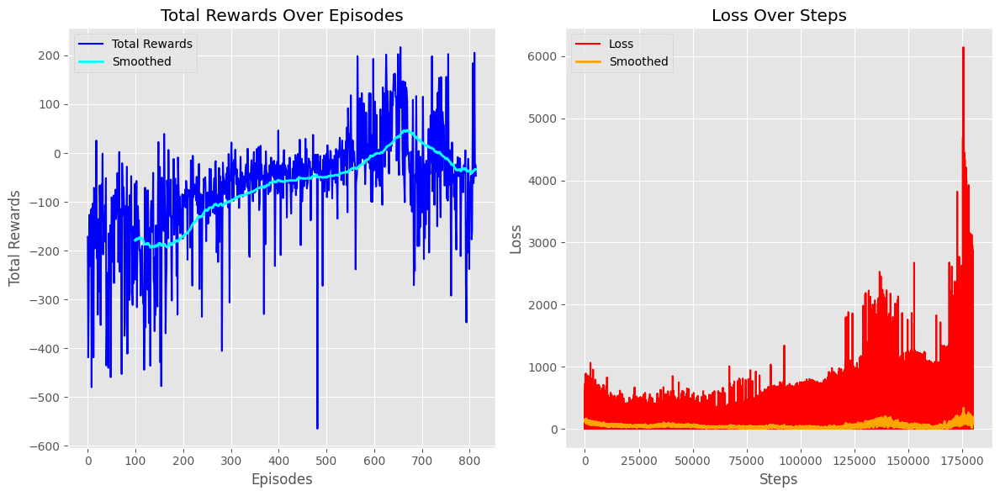


Mean Reward: -33.30203483729911


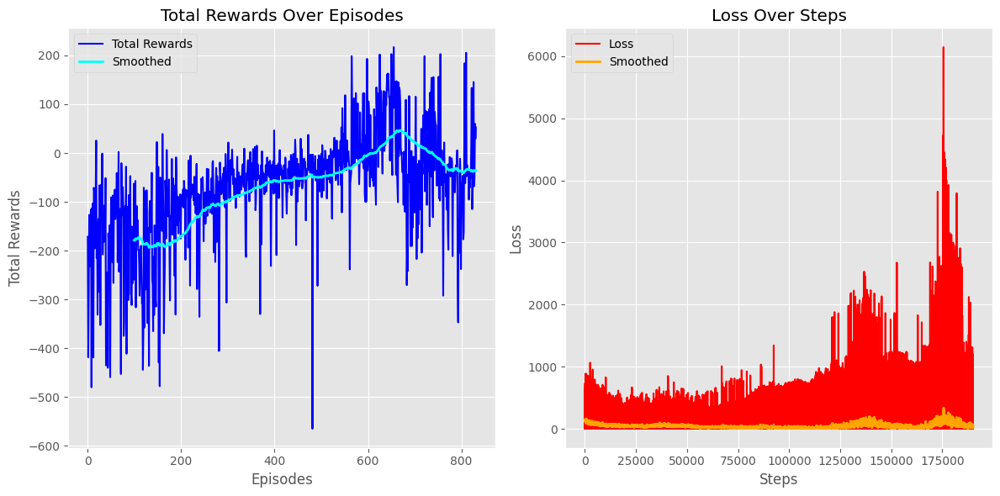


Mean Reward: -35.85282076172071


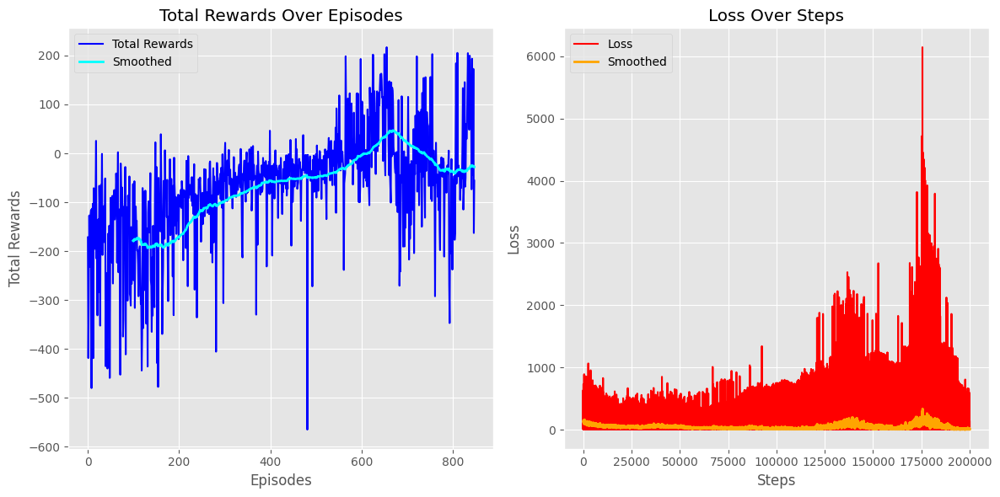


Mean Reward: -27.875276567331344


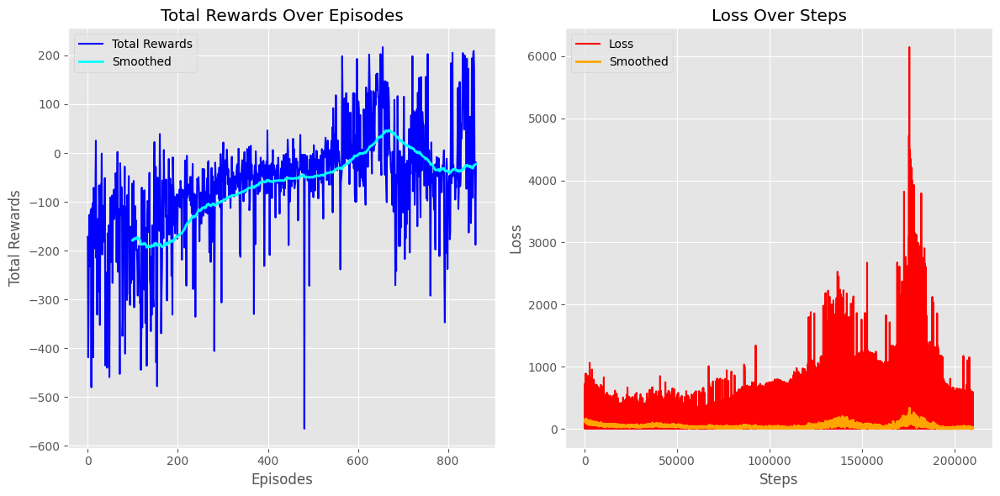


Mean Reward: -22.806916138760425


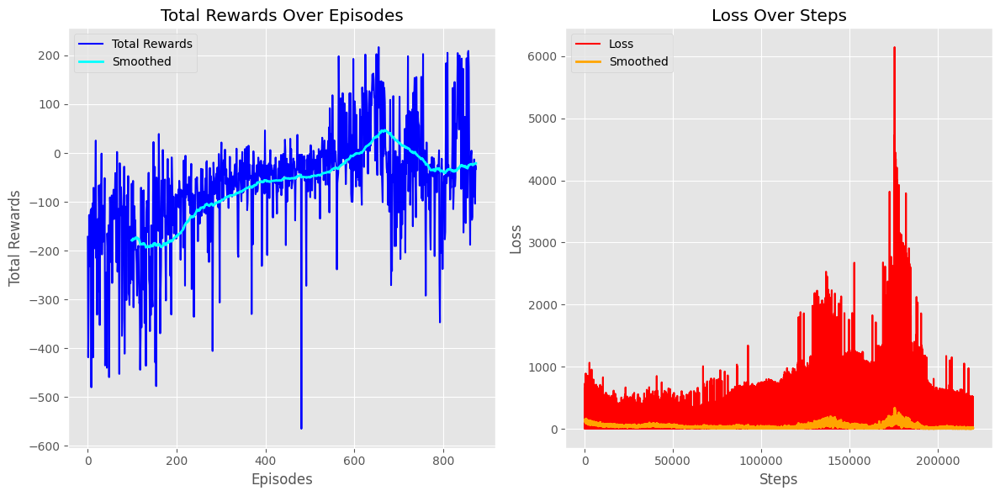


Mean Reward: -21.020074445009712


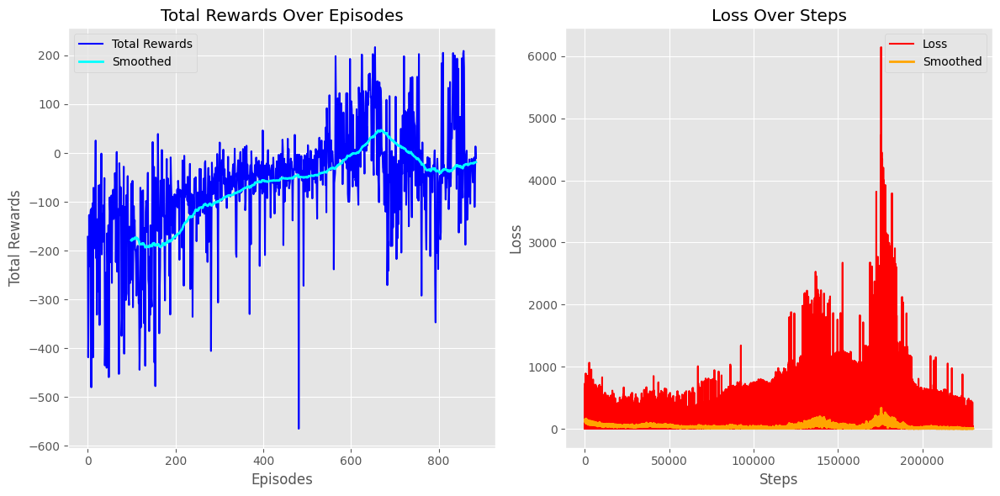


Mean Reward: -18.594495200762754


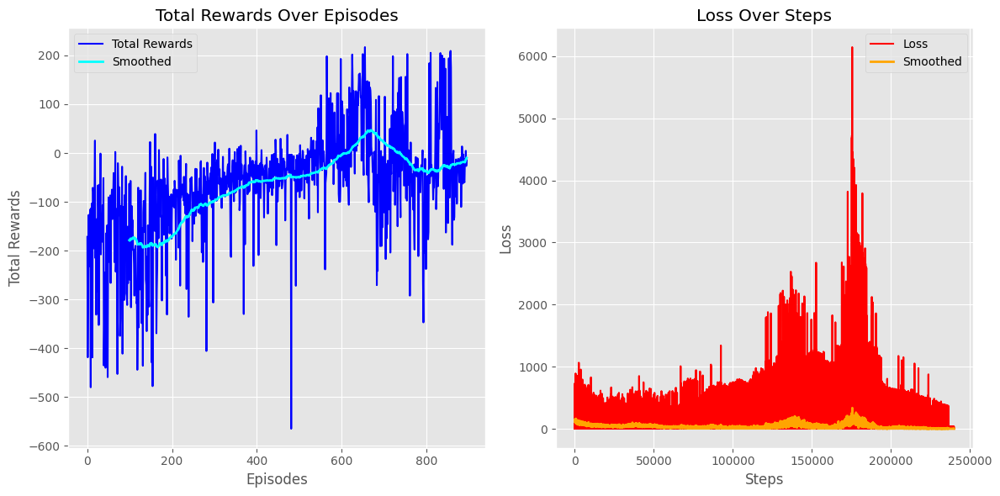


Mean Reward: -10.054018338185827


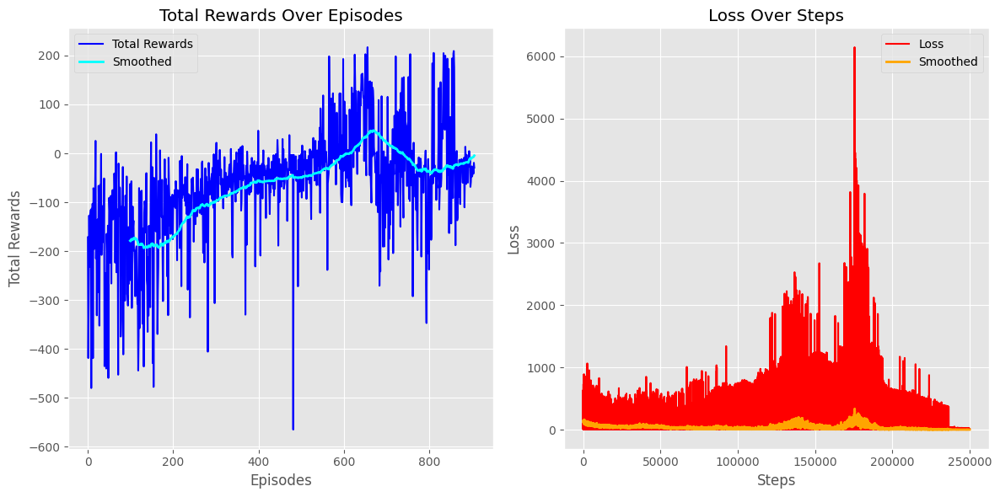


Mean Reward: -4.635092812900789


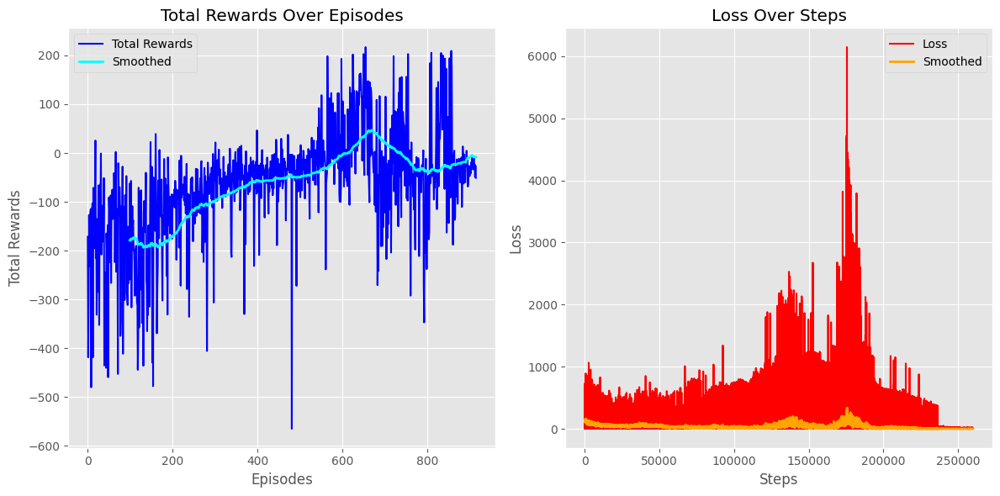


Mean Reward: -8.305217349095411


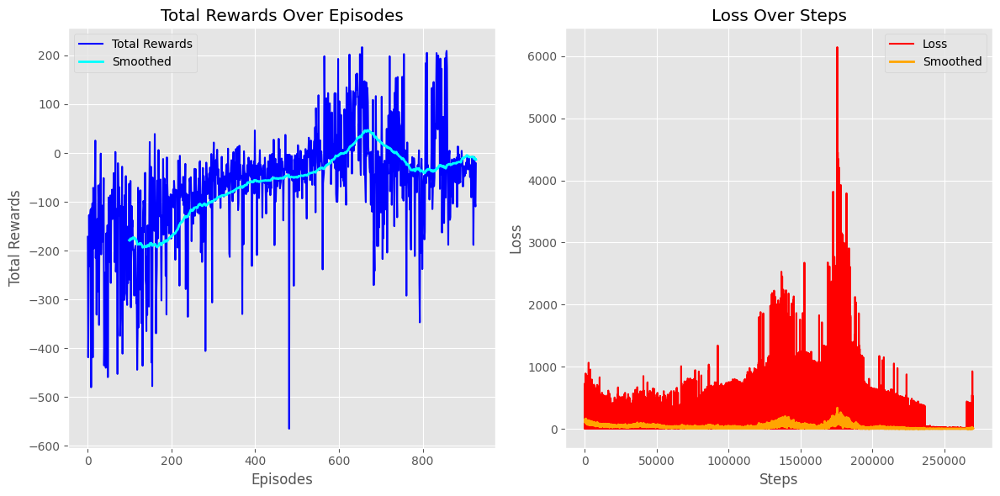


Mean Reward: -13.396315237587789


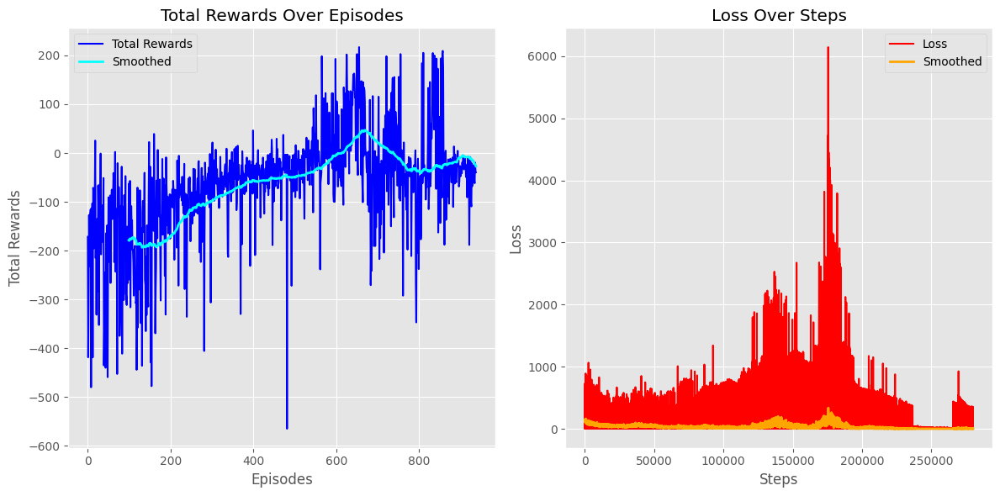


Mean Reward: -26.981435688644364


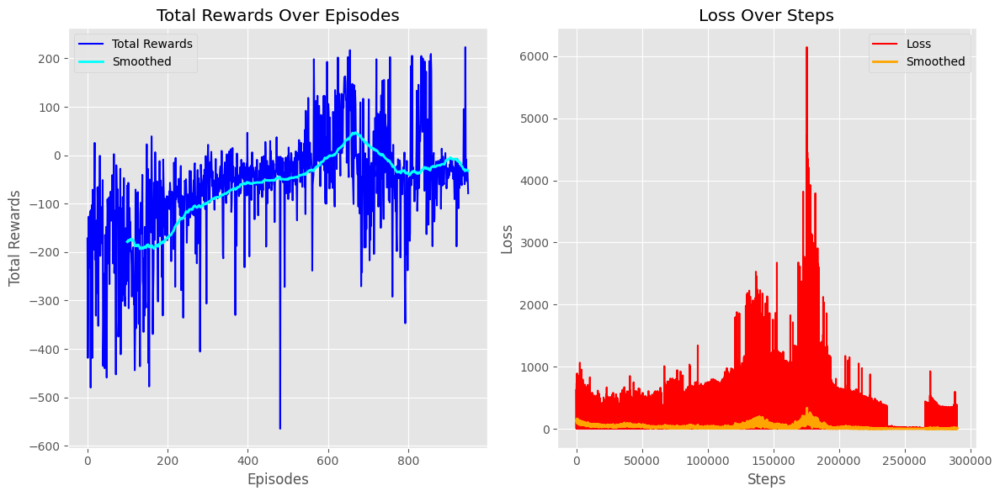


Mean Reward: -32.023513787735816


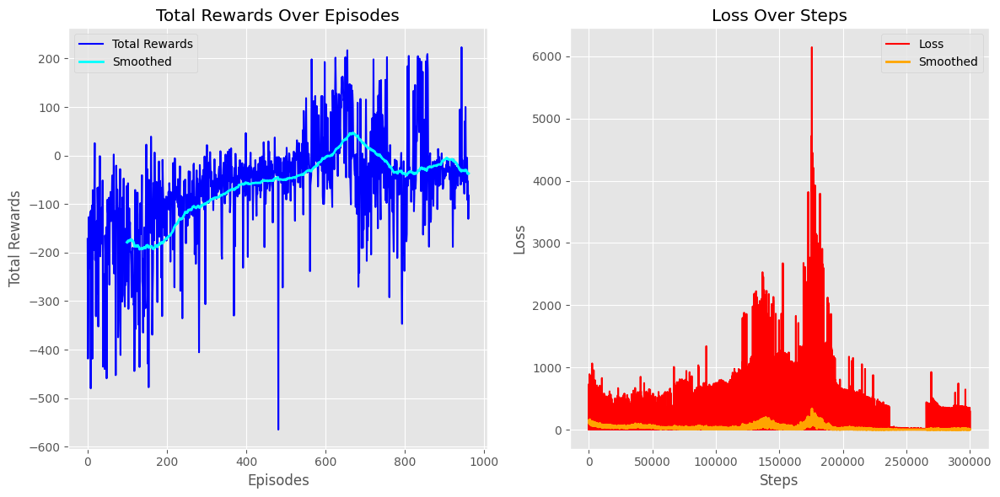


Mean Reward: -36.927852605169406


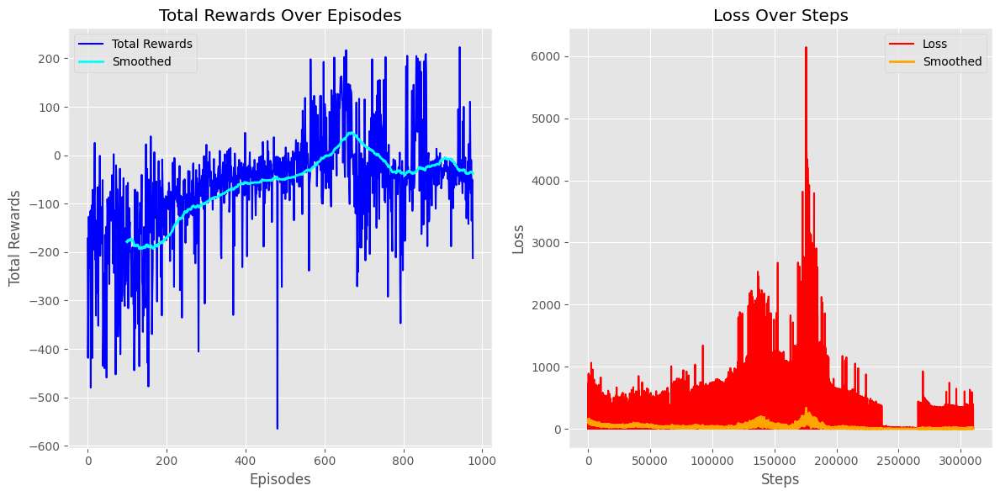


Mean Reward: -37.68306322666595


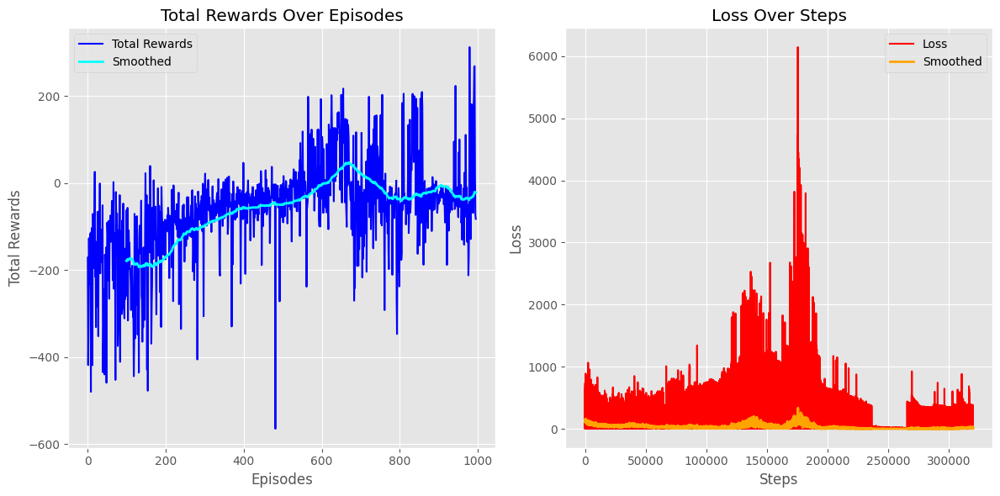


Mean Reward: -21.918972890477825


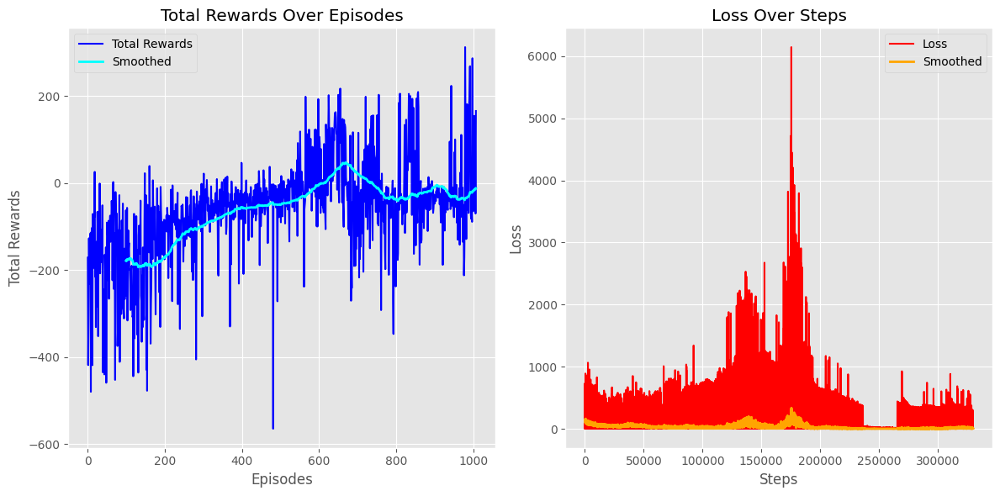


Mean Reward: -12.425771954856616


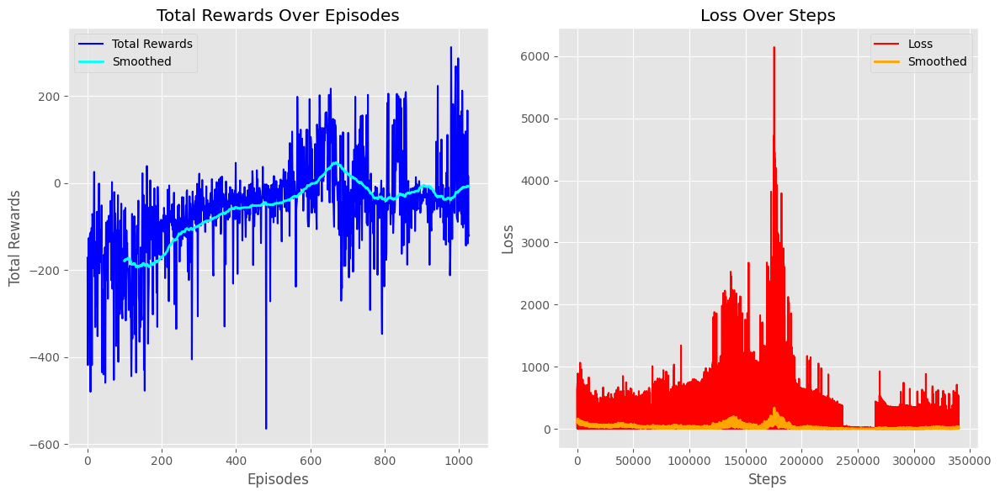


Mean Reward: -8.036296346727013


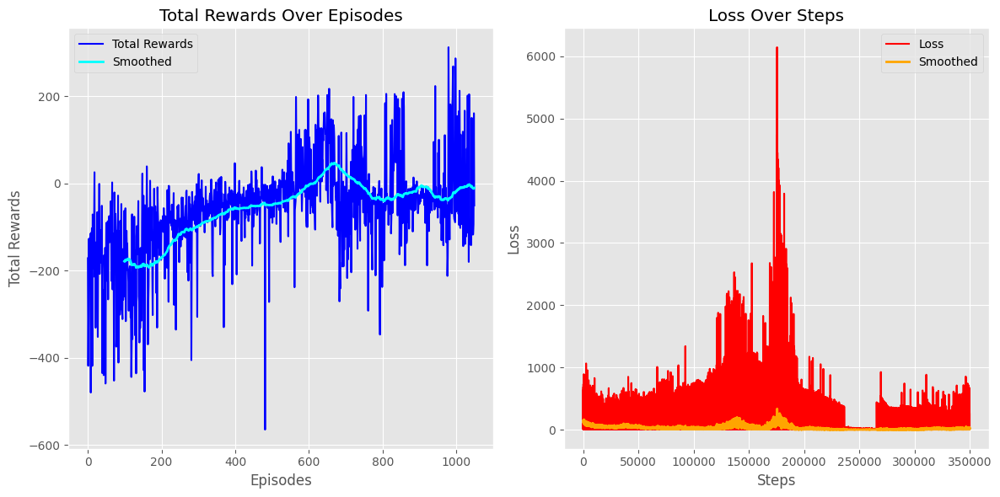


Mean Reward: -10.258314349941356


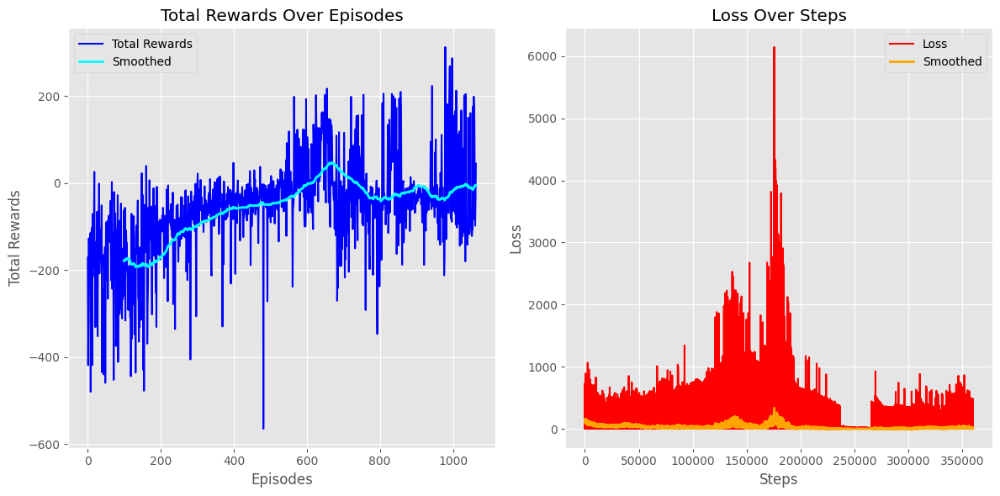


Mean Reward: -5.244289519680661


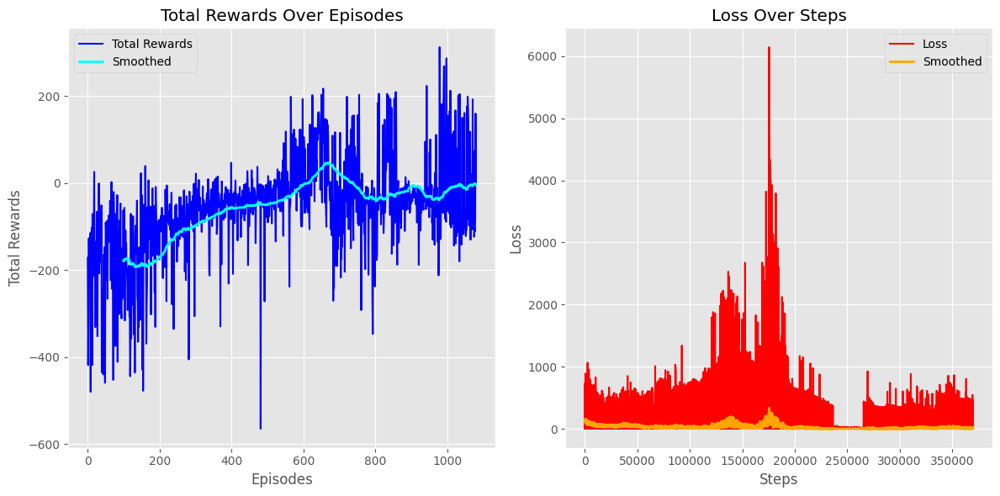


Mean Reward: -4.203019198486275


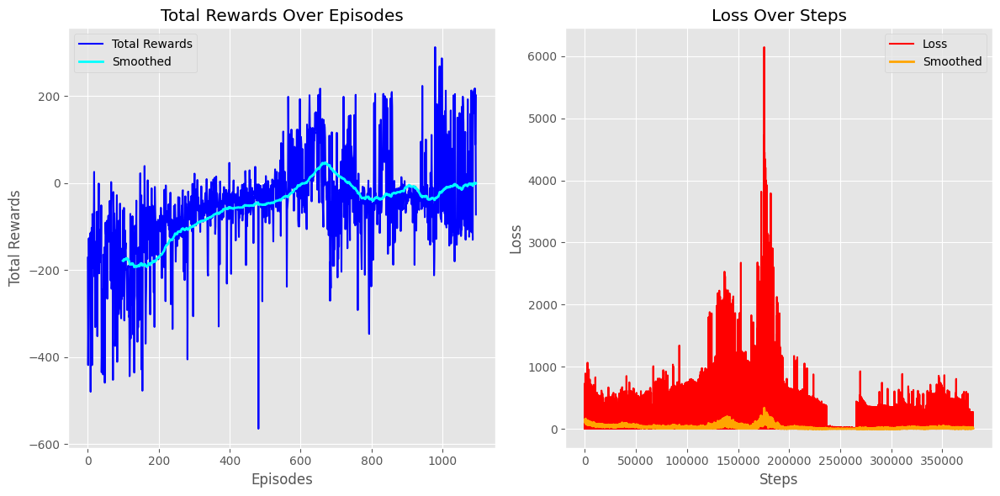


Mean Reward: -0.32297800844832525


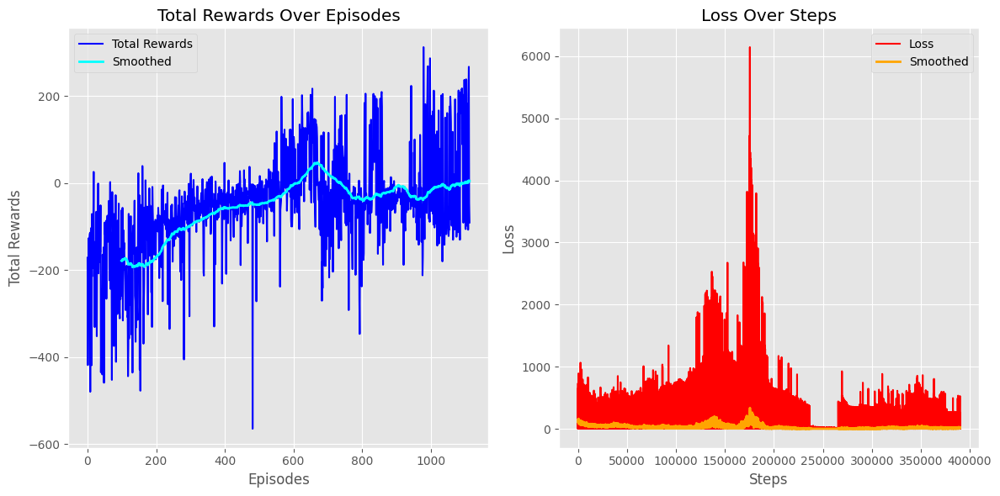


Mean Reward: 4.093379604389121


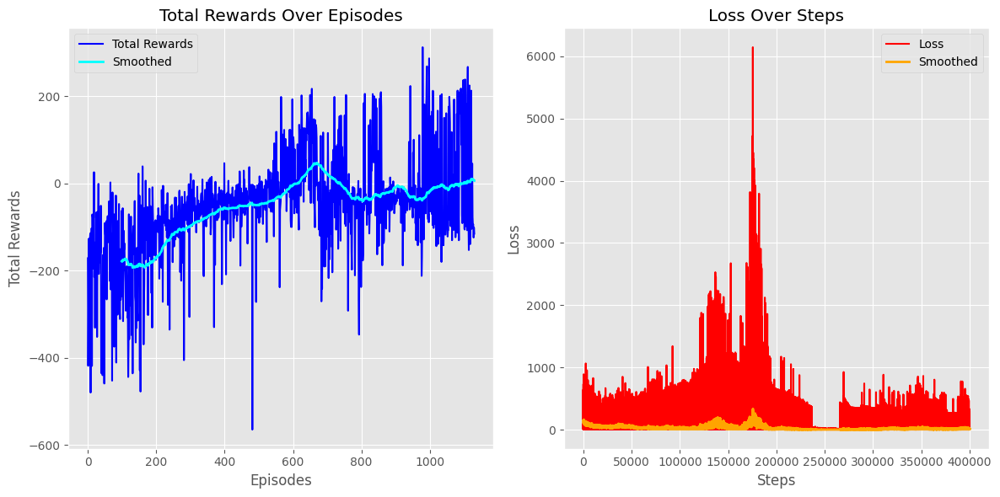


Mean Reward: 6.155619654636101


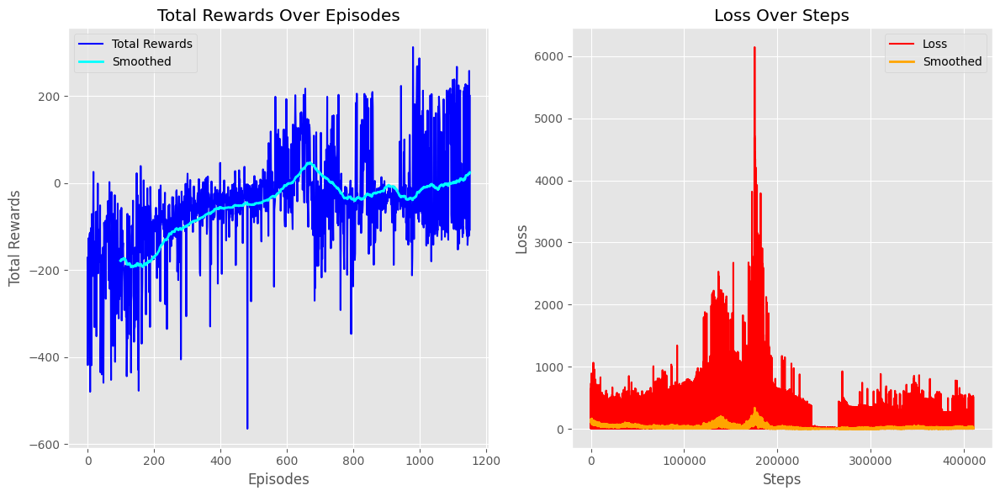


Mean Reward: 24.396111707612928


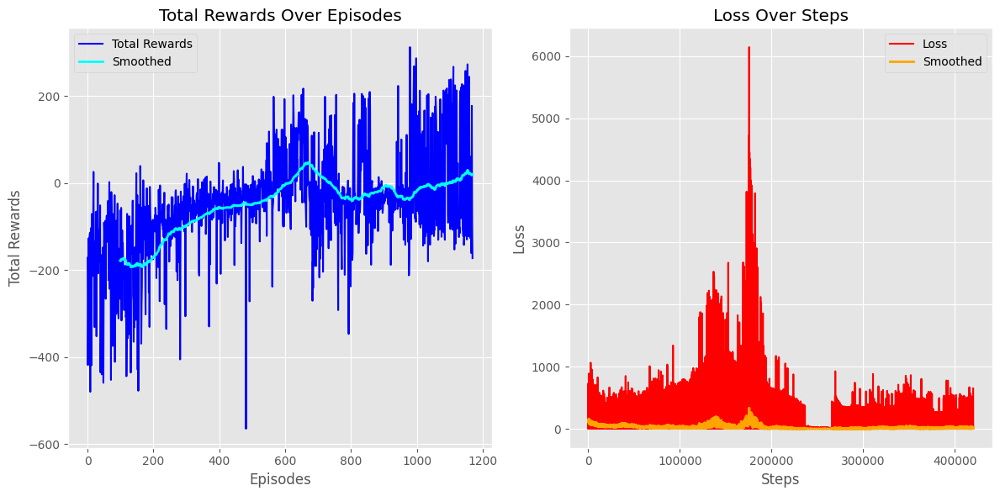


Mean Reward: 19.59761835767859


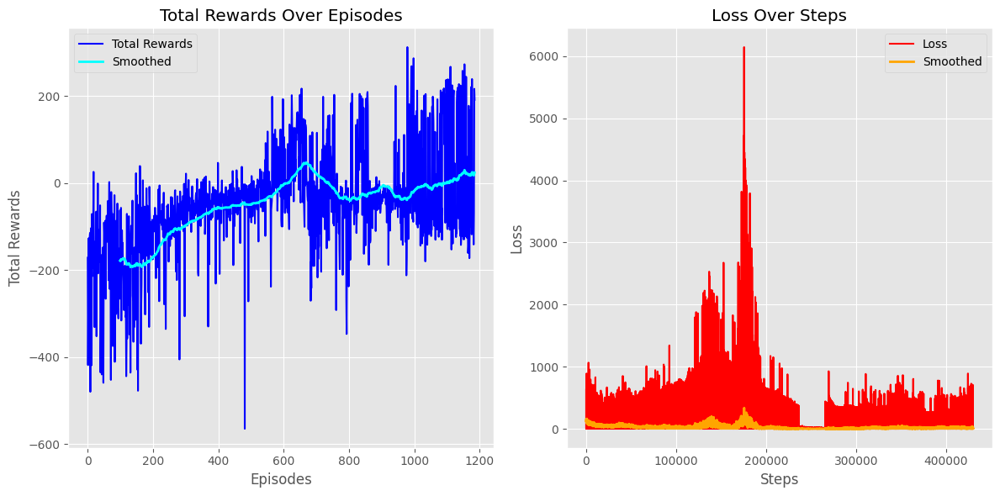


Mean Reward: 23.944549962981345


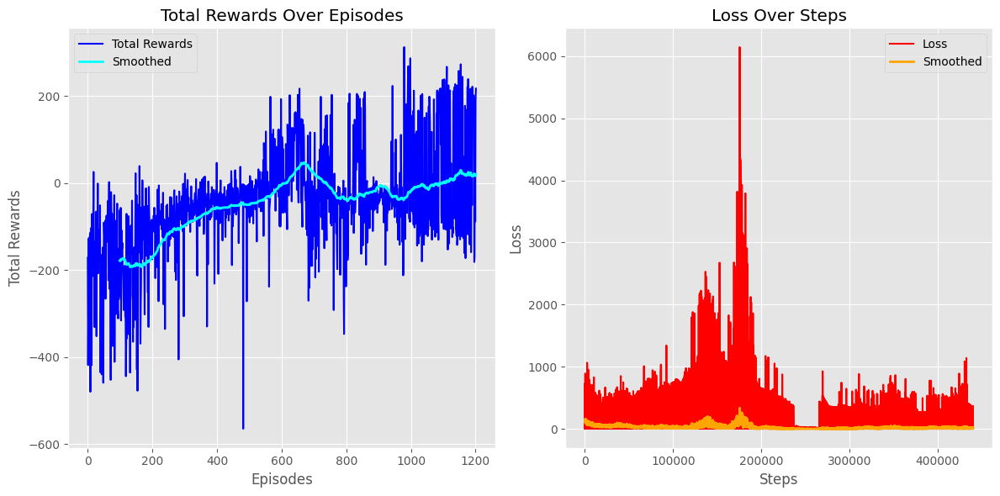


Mean Reward: 19.73946076866019


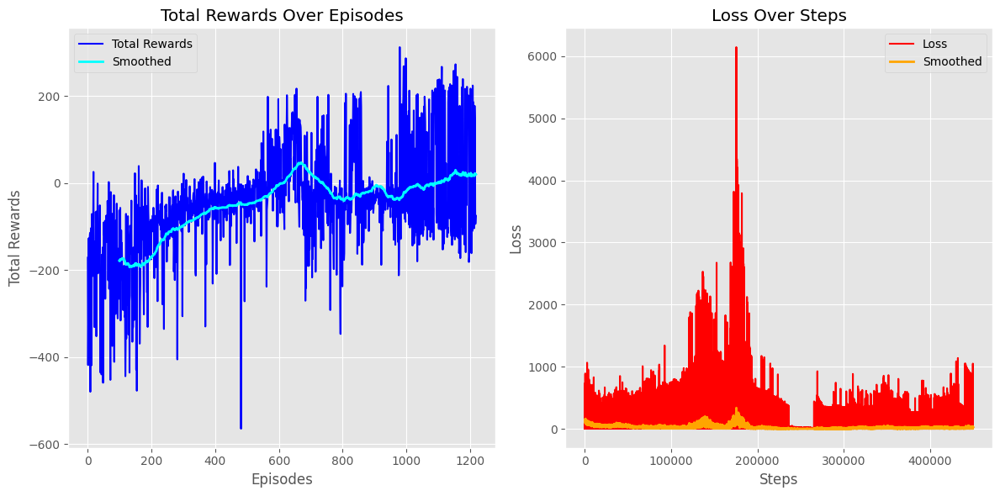


Mean Reward: 19.51125161804804


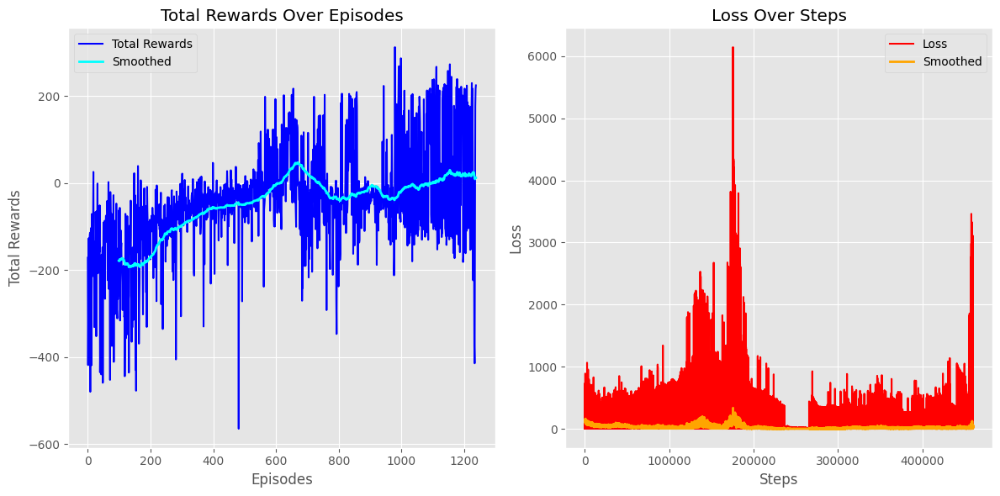


Mean Reward: 12.275436574327568


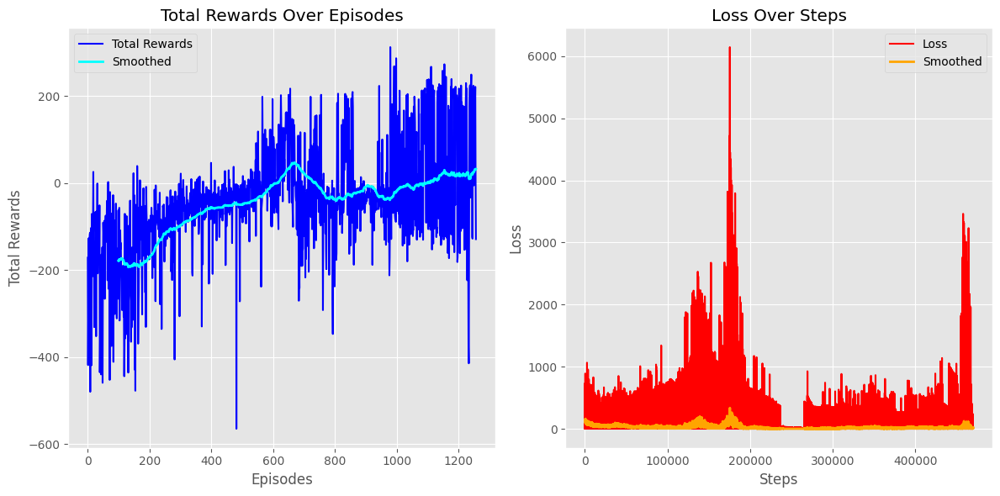


Mean Reward: 32.048427020022594
GAME : 487215, TIME ECLAPSED : 3.9240853786468506, EPSILON : 0.01, MEAN_REWARD : 51.86807570951296
Reward 49.969686252204376 -> 51.86807570951296 Model Saved


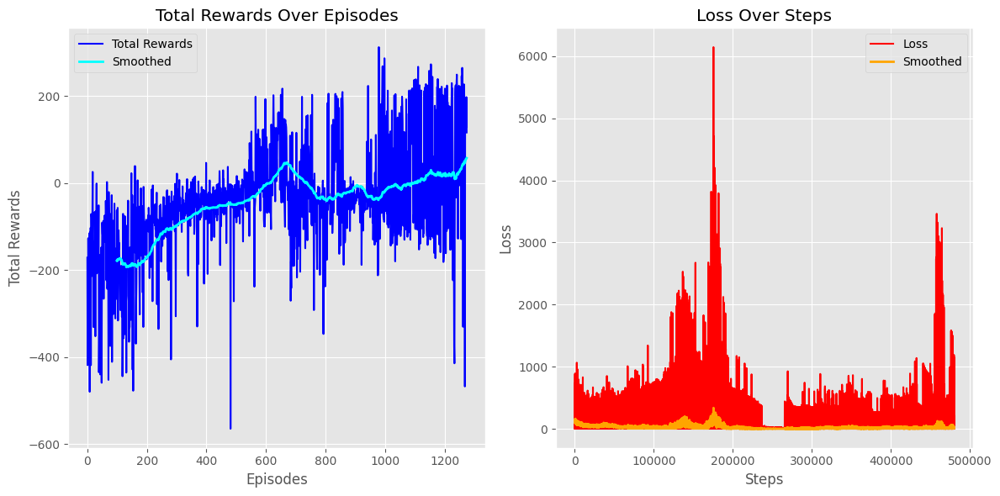


Mean Reward: 57.33178675607614
GAME : 493058, TIME ECLAPSED : 0.8662173748016357, EPSILON : 0.01, MEAN_REWARD : 61.405392143348024
Reward 60.21473640836459 -> 61.405392143348024 Model Saved
GAME : 497045, TIME ECLAPSED : 2.3939273357391357, EPSILON : 0.01, MEAN_REWARD : 71.89843674205687
Reward 70.7448262178355 -> 71.89843674205687 Model Saved


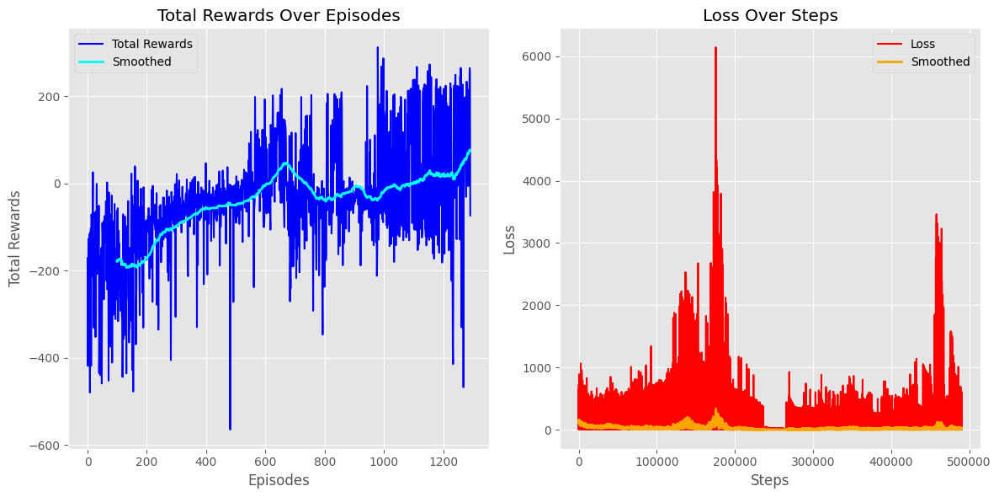


Mean Reward: 74.53517002377775


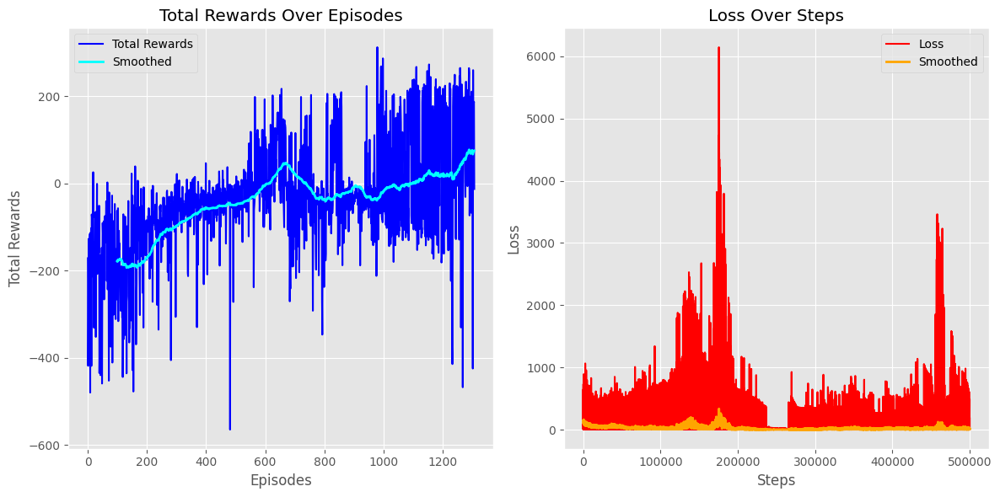


Mean Reward: 74.7058145152133


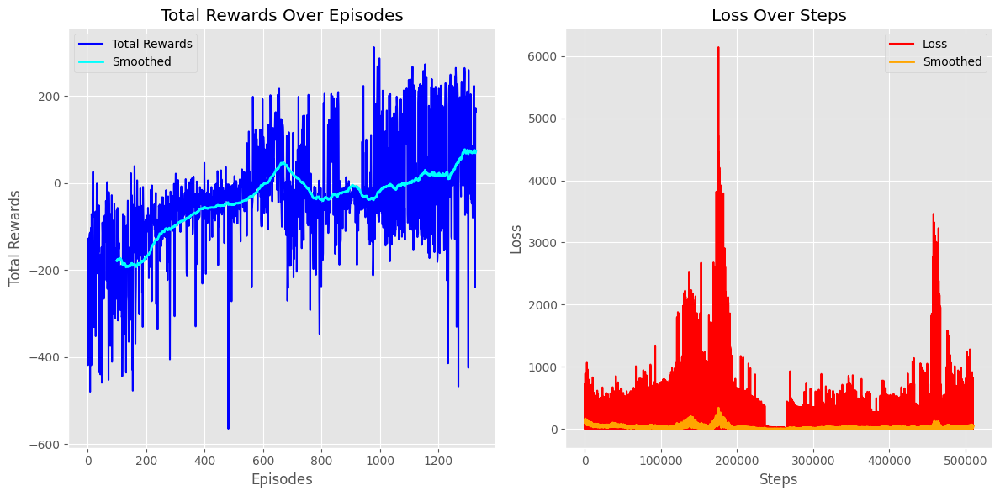


Mean Reward: 74.14118635545248
GAME : 522802, TIME ECLAPSED : 2.7712883949279785, EPSILON : 0.01, MEAN_REWARD : 90.08822569378145
Reward 83.83765809979631 -> 90.08822569378145 Model Saved
GAME : 528183, TIME ECLAPSED : 2.2104599475860596, EPSILON : 0.01, MEAN_REWARD : 96.5549749084072
Reward 96.49649358876664 -> 96.5549749084072 Model Saved


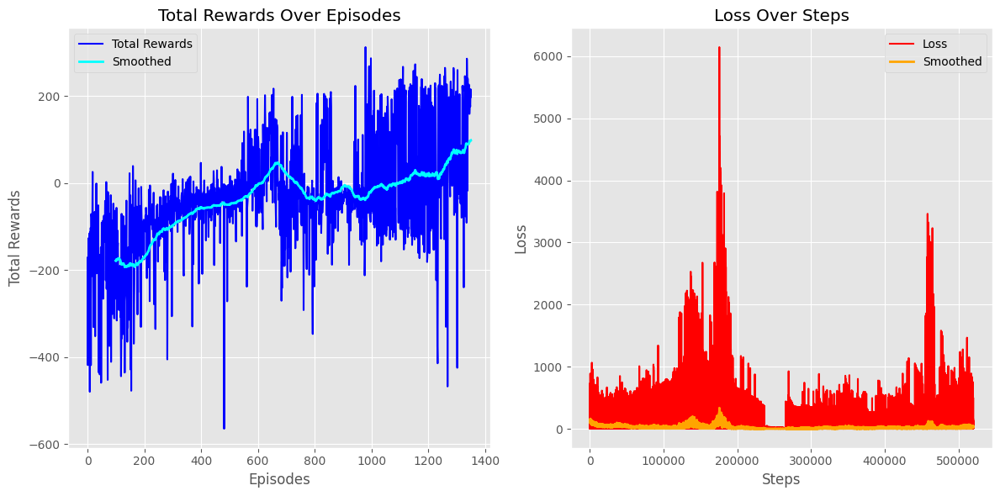


Mean Reward: 98.3182466596049
GAME : 538722, TIME ECLAPSED : 1.9333815574645996, EPSILON : 0.01, MEAN_REWARD : 109.02869097095707
Reward 107.11319030928124 -> 109.02869097095707 Model Saved


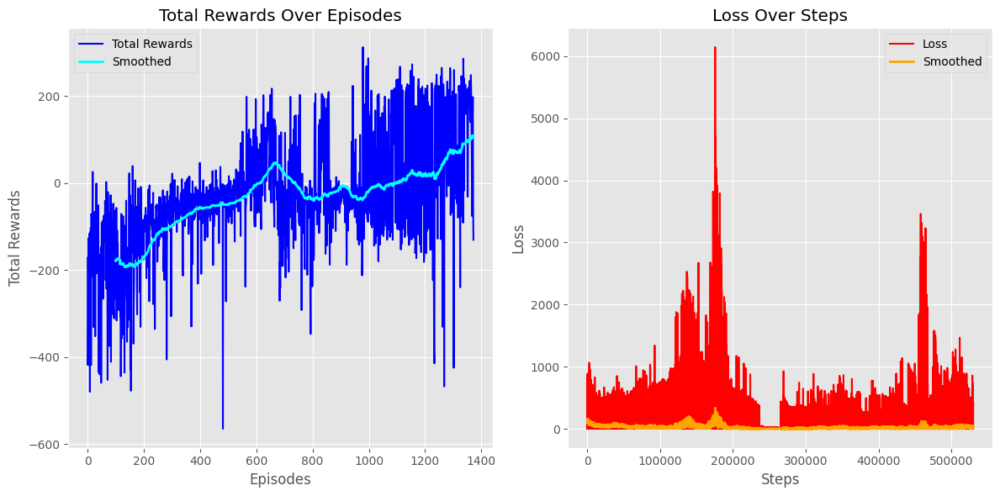


Mean Reward: 104.5062509743758


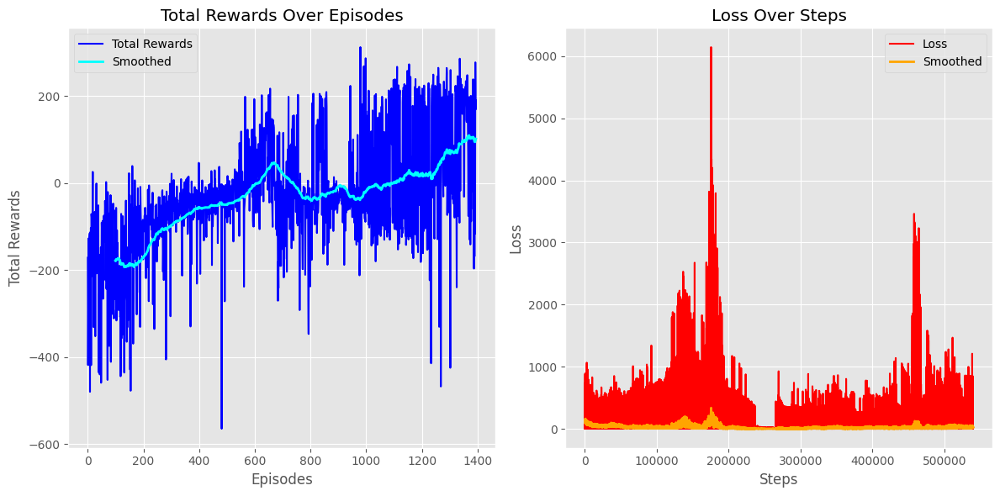


Mean Reward: 101.40663468808295


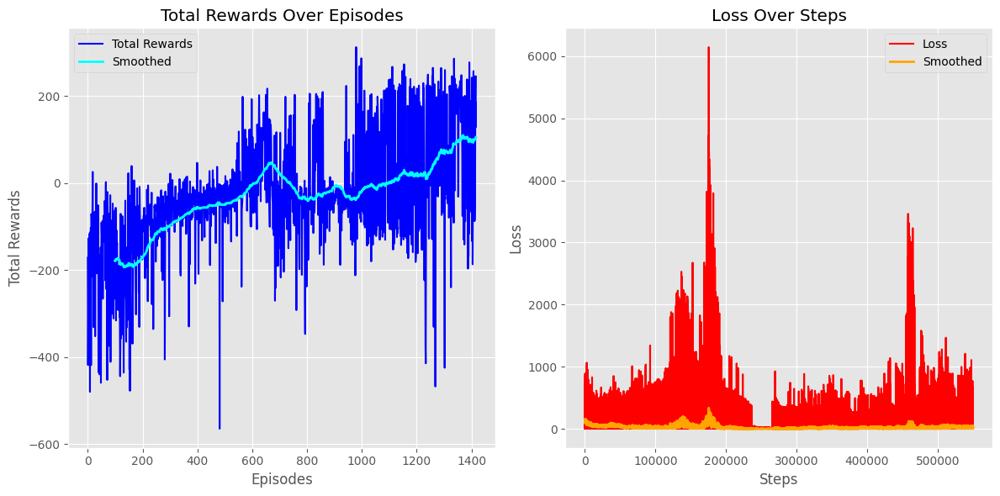


Mean Reward: 105.08958843550664
GAME : 568189, TIME ECLAPSED : 1.447866678237915, EPSILON : 0.01, MEAN_REWARD : 117.57321677349779
Reward 117.33349313832373 -> 117.57321677349779 Model Saved


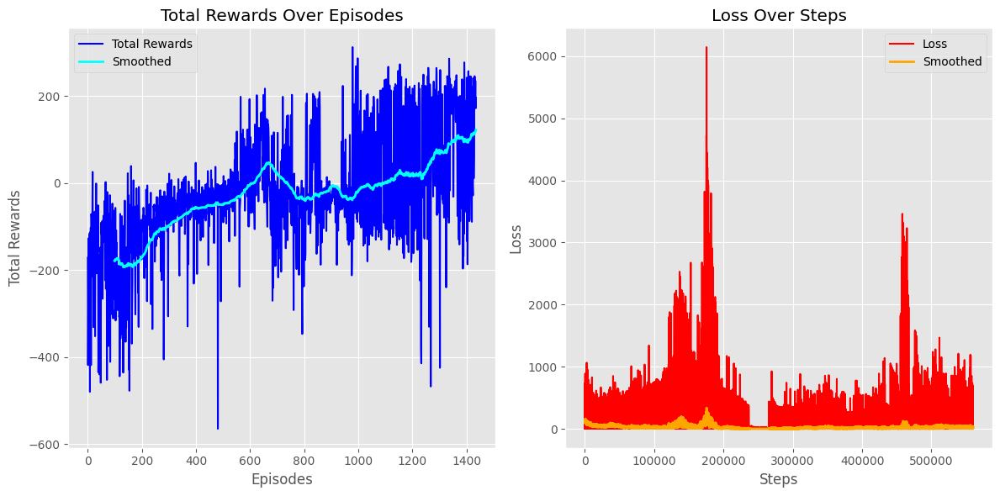


Mean Reward: 122.31249051186995


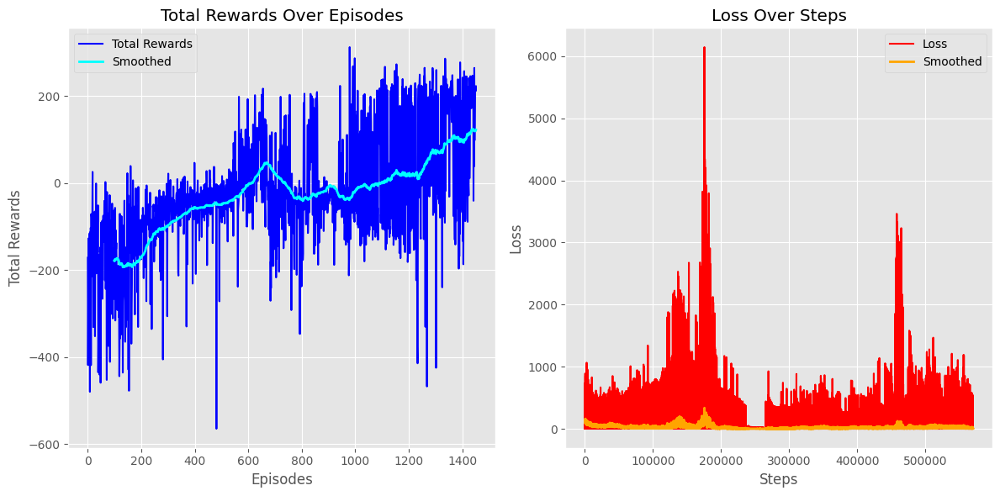


Mean Reward: 122.40099475829679


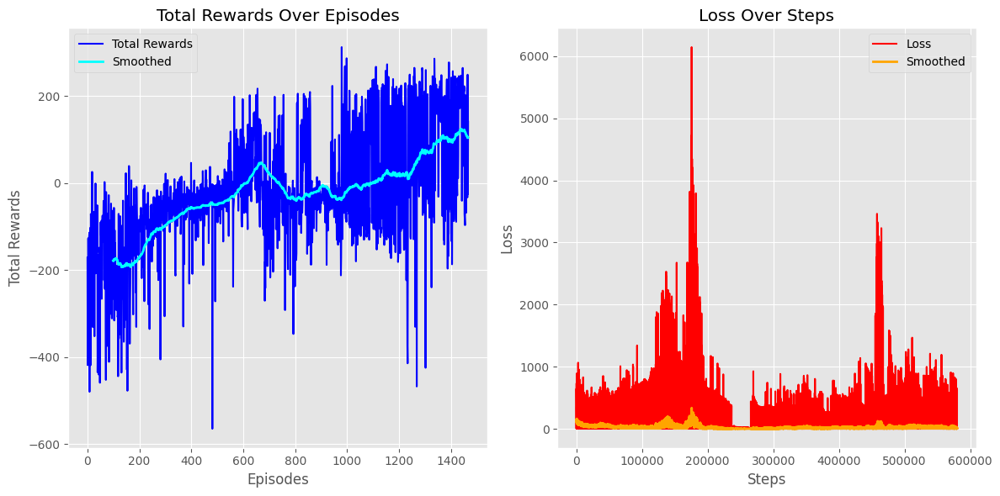


Mean Reward: 104.38407731178104


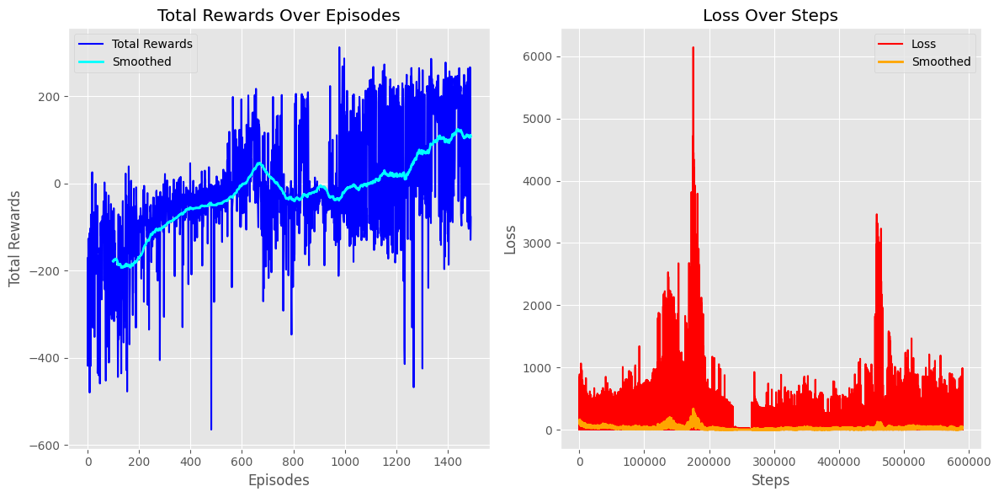


Mean Reward: 107.83087047764076


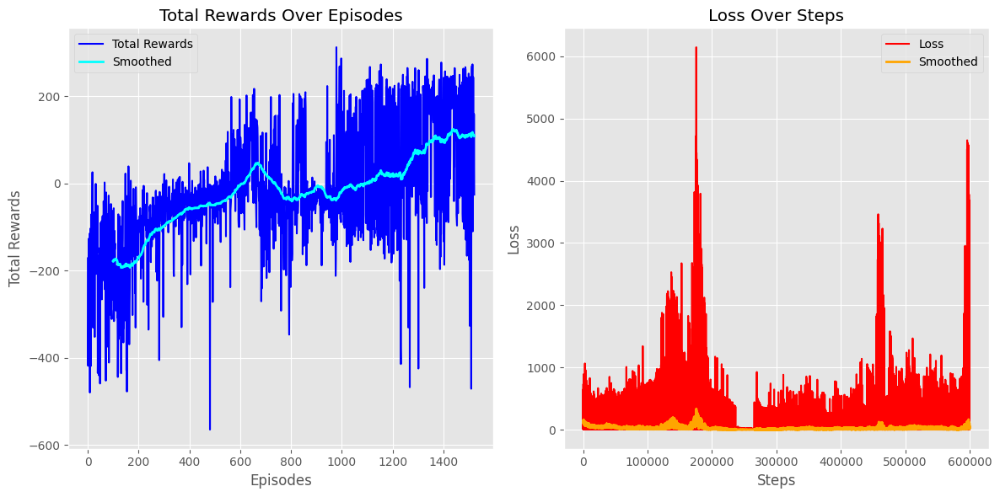


Mean Reward: 108.40454108976166


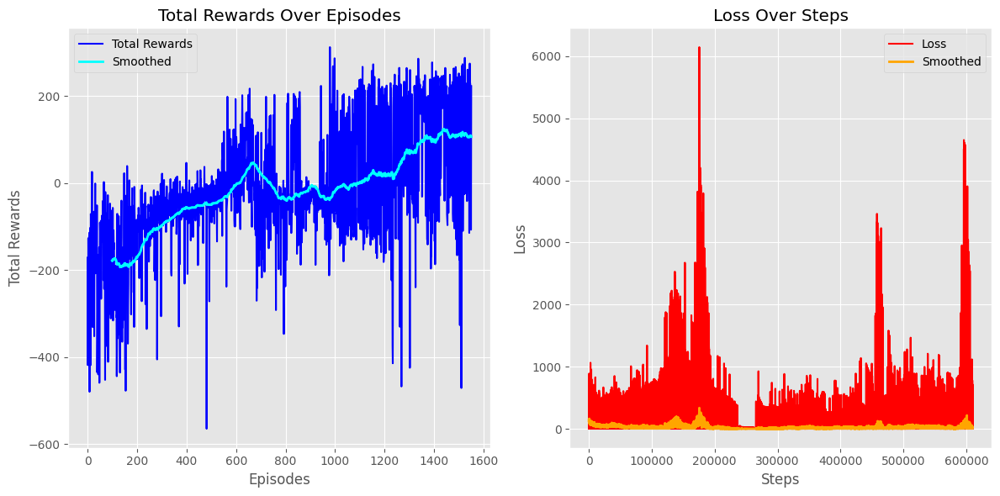


Mean Reward: 105.96442992044676


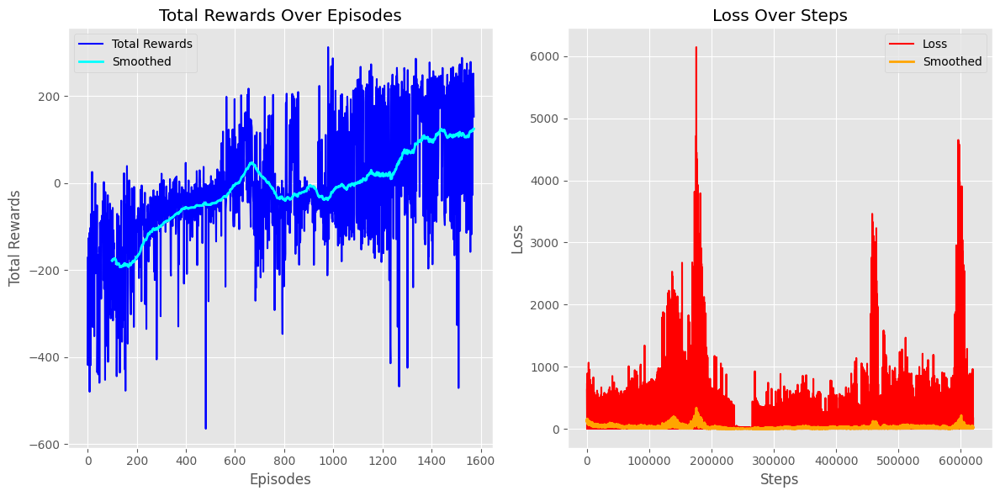


Mean Reward: 124.72000295011603
GAME : 632339, TIME ECLAPSED : 3.3740766048431396, EPSILON : 0.01, MEAN_REWARD : 132.2784639012567
Reward 128.941291909409 -> 132.2784639012567 Model Saved
GAME : 639453, TIME ECLAPSED : 1.0150582790374756, EPSILON : 0.01, MEAN_REWARD : 142.07119724704572
Reward 139.54089711547948 -> 142.07119724704572 Model Saved


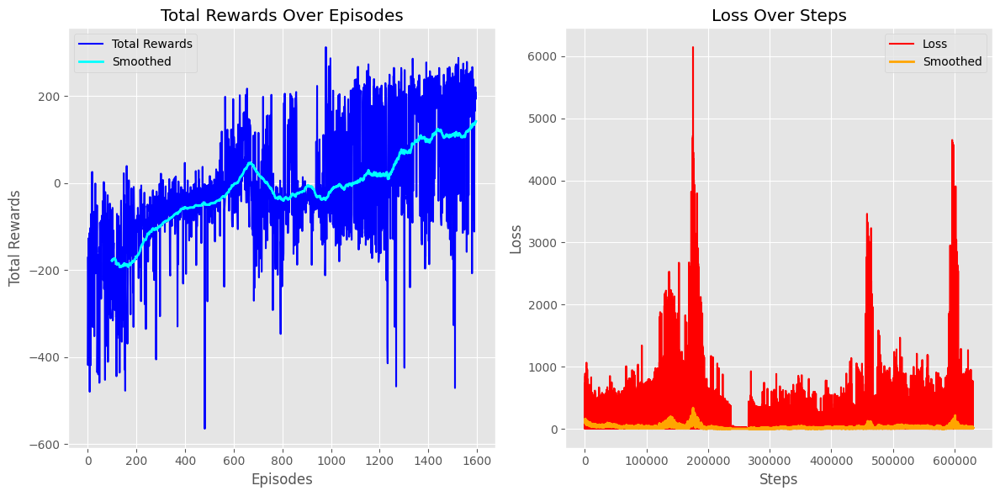


Mean Reward: 141.78869744948747
GAME : 642869, TIME ECLAPSED : 2.7771482467651367, EPSILON : 0.01, MEAN_REWARD : 151.40553977755803
Reward 151.2026801020472 -> 151.40553977755803 Model Saved
GAME : 648101, TIME ECLAPSED : 1.4301791191101074, EPSILON : 0.01, MEAN_REWARD : 165.11596162629397
Reward 164.5267198491036 -> 165.11596162629397 Model Saved


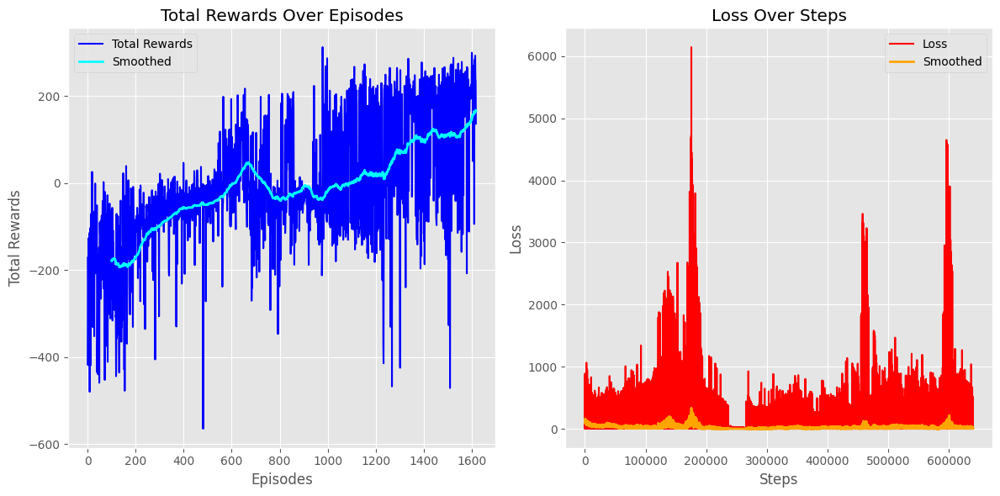


Mean Reward: 166.28732577509444
GAME : 654213, TIME ECLAPSED : 1.160987377166748, EPSILON : 0.01, MEAN_REWARD : 177.96962996288048
Reward 175.3679718159011 -> 177.96962996288048 Model Saved


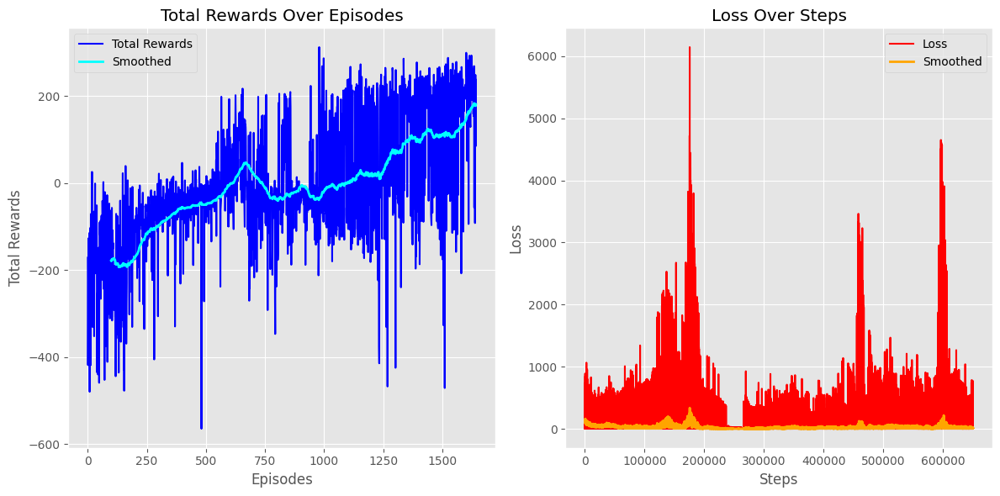


Mean Reward: 180.85553744932093


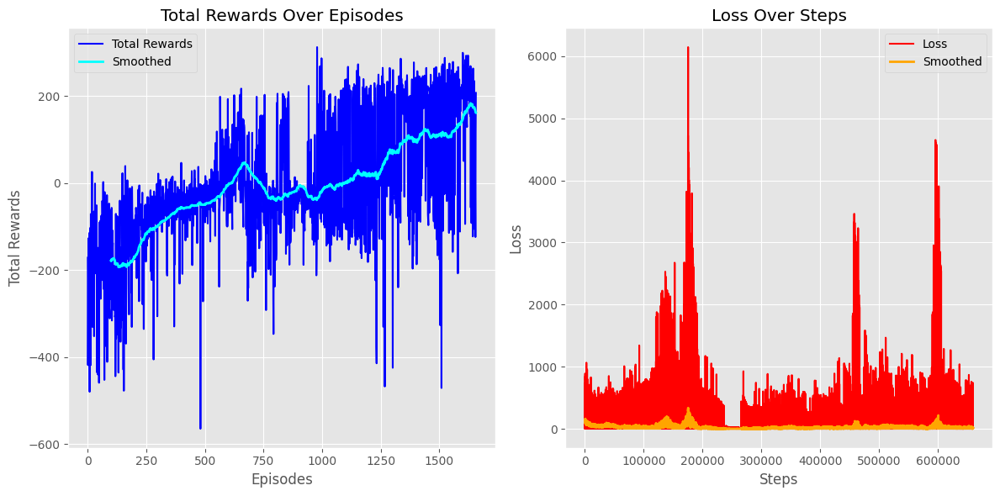


Mean Reward: 161.4598836088795


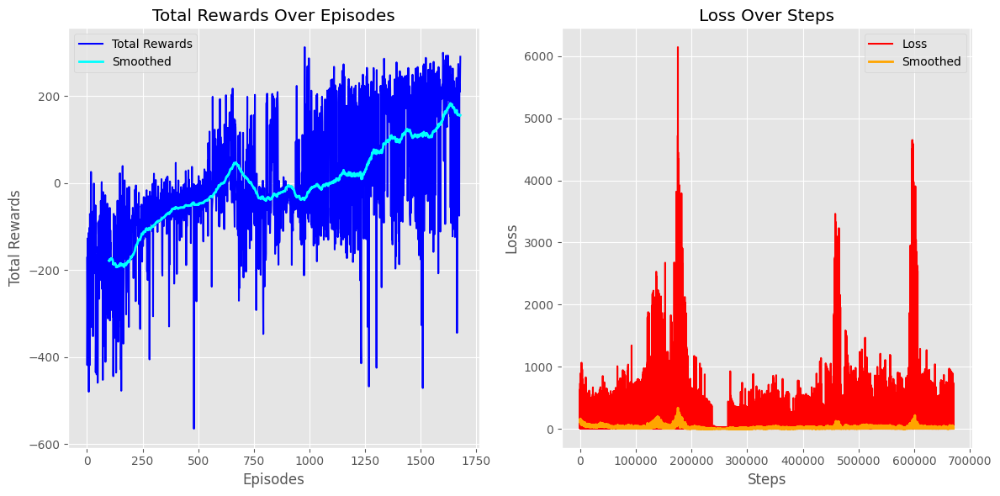


Mean Reward: 155.7462588345147


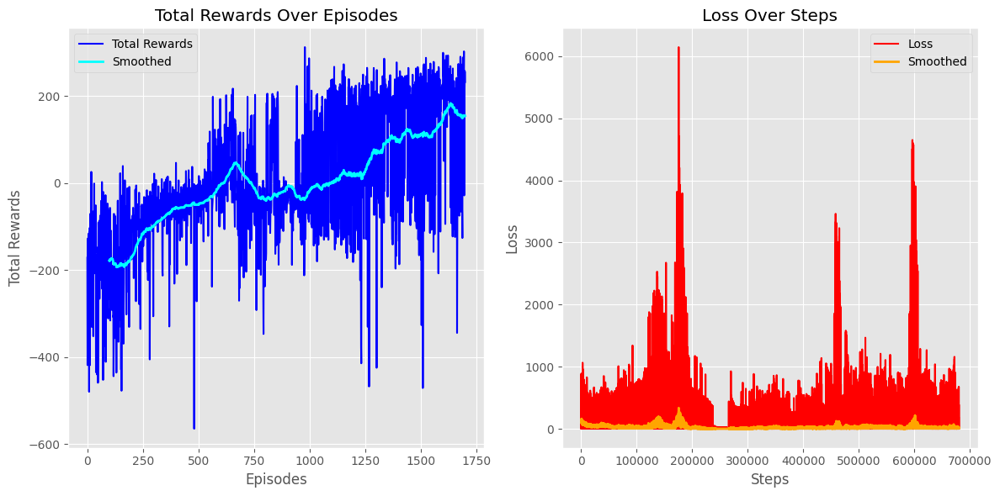


Mean Reward: 154.30393479038793


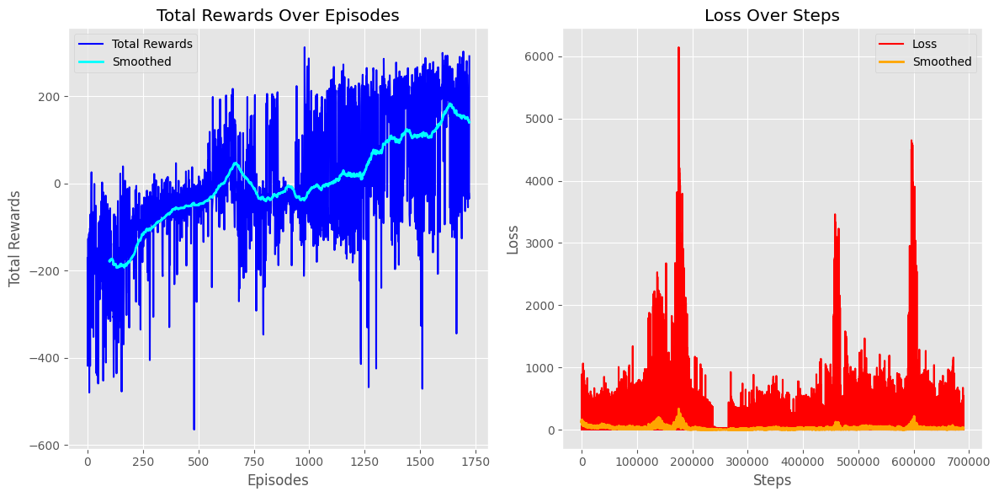


Mean Reward: 140.05016472671542


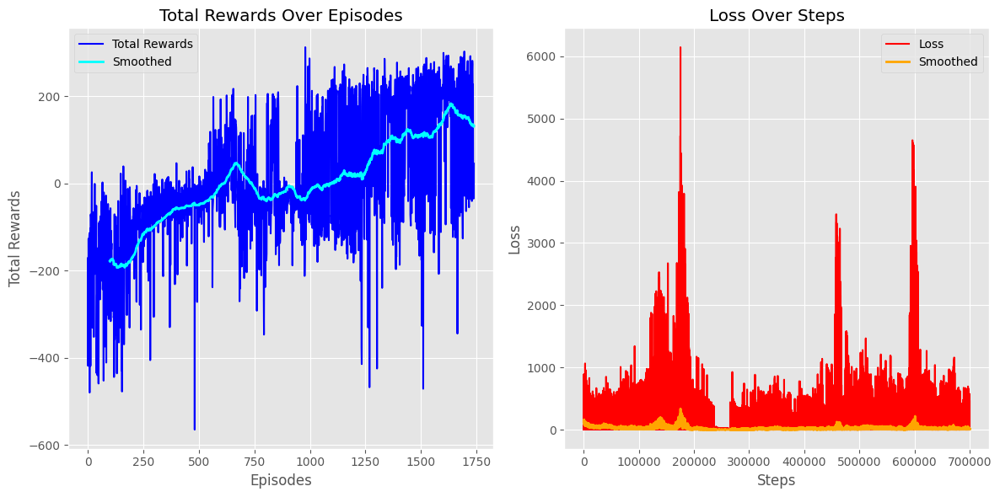


Mean Reward: 131.36341843336623


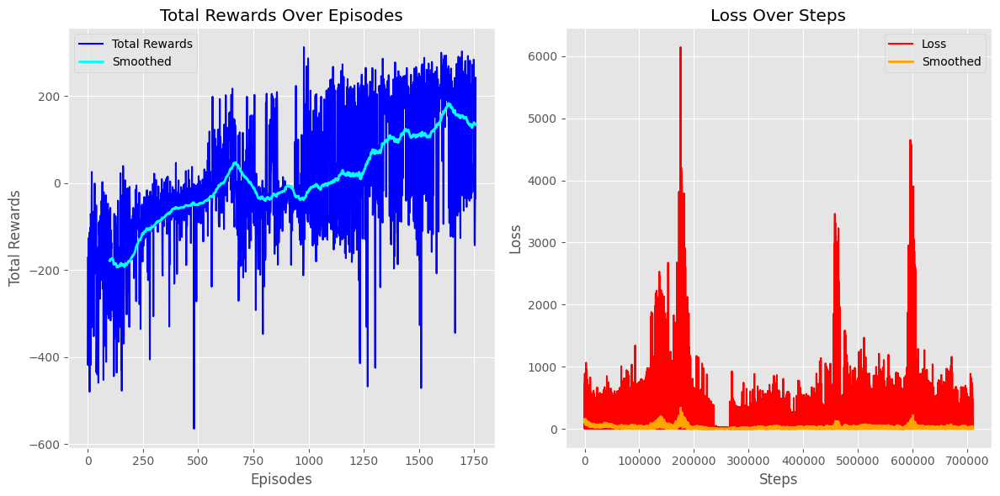


Mean Reward: 134.05143147987923


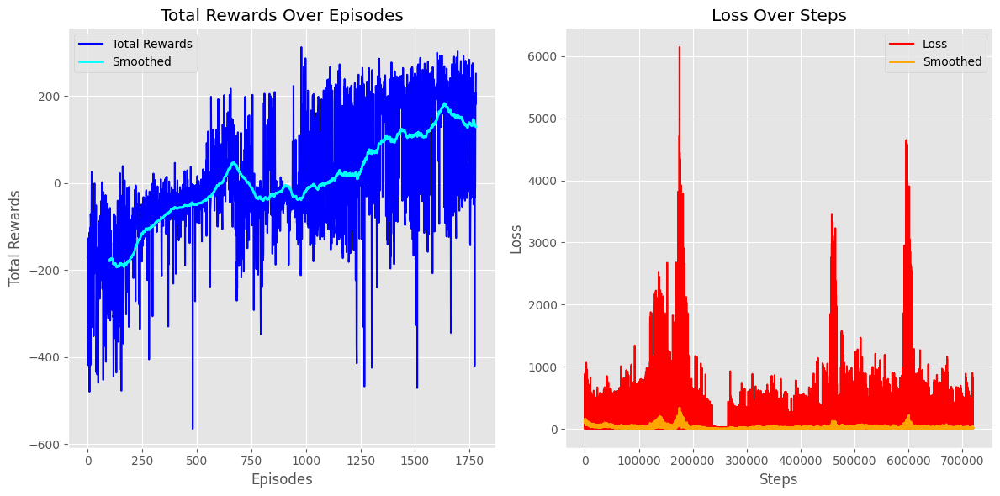


Mean Reward: 129.106063981591


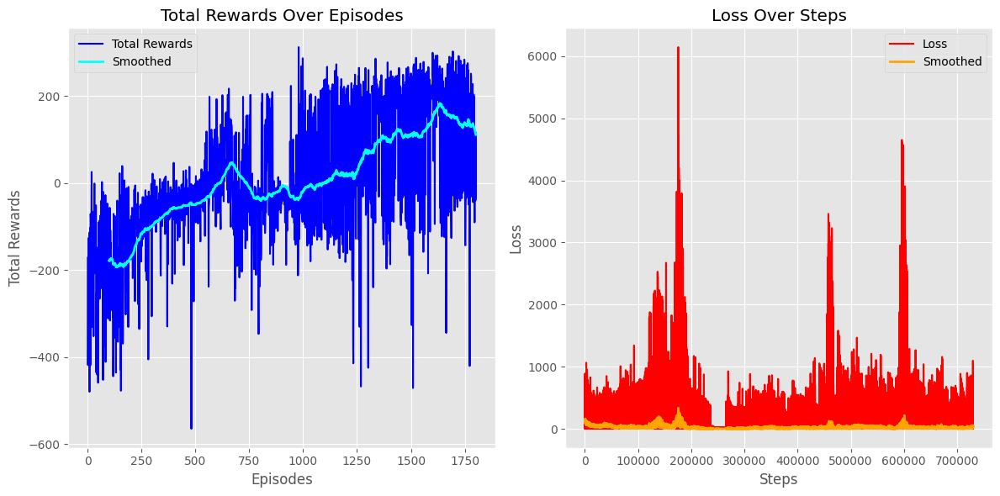


Mean Reward: 110.89948727773319


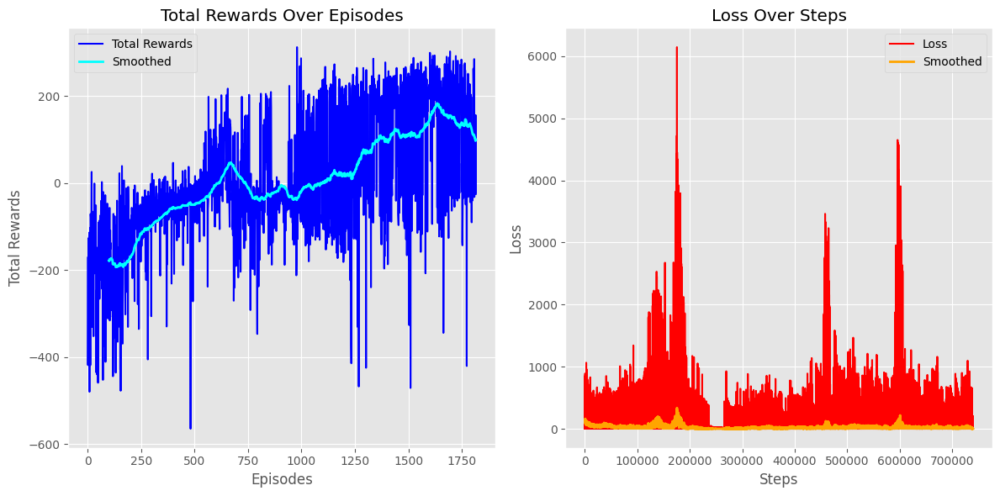


Mean Reward: 99.19828371002488


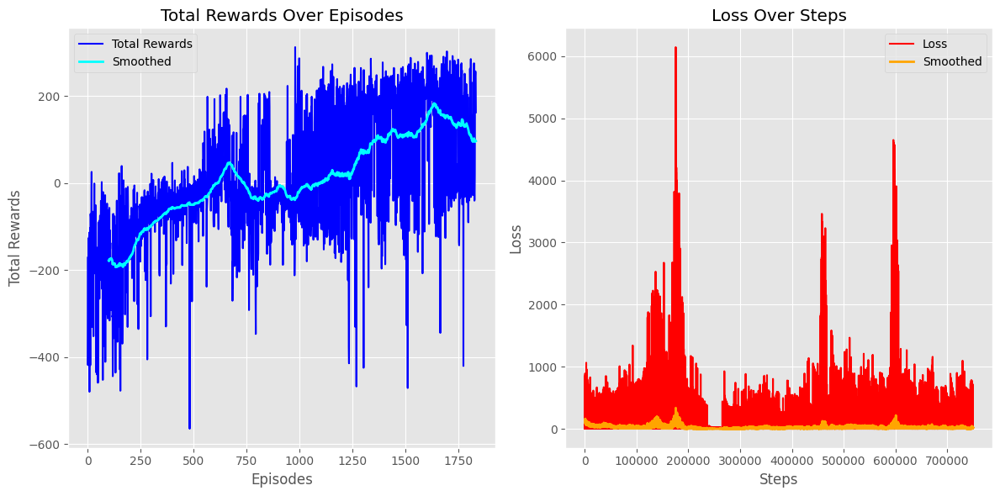


Mean Reward: 96.49453755697425


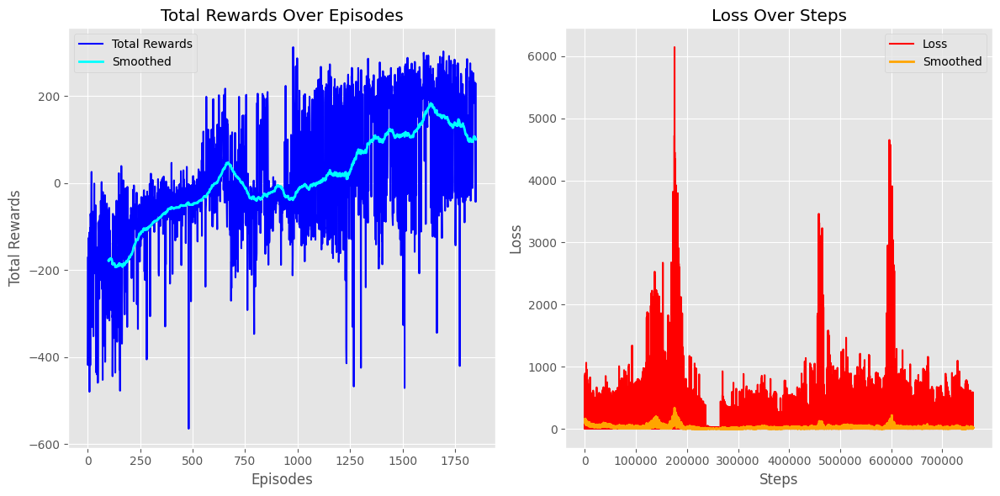


Mean Reward: 100.744122681537


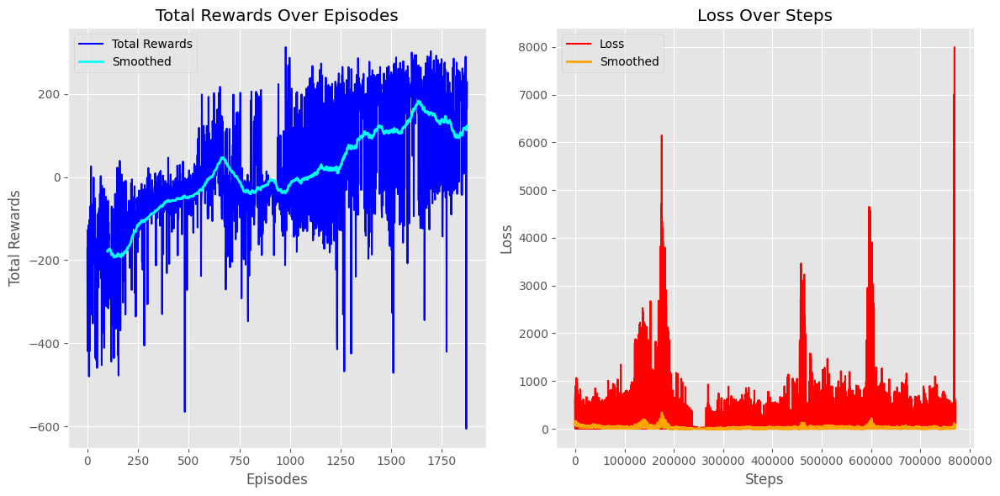


Mean Reward: 122.90644173673134


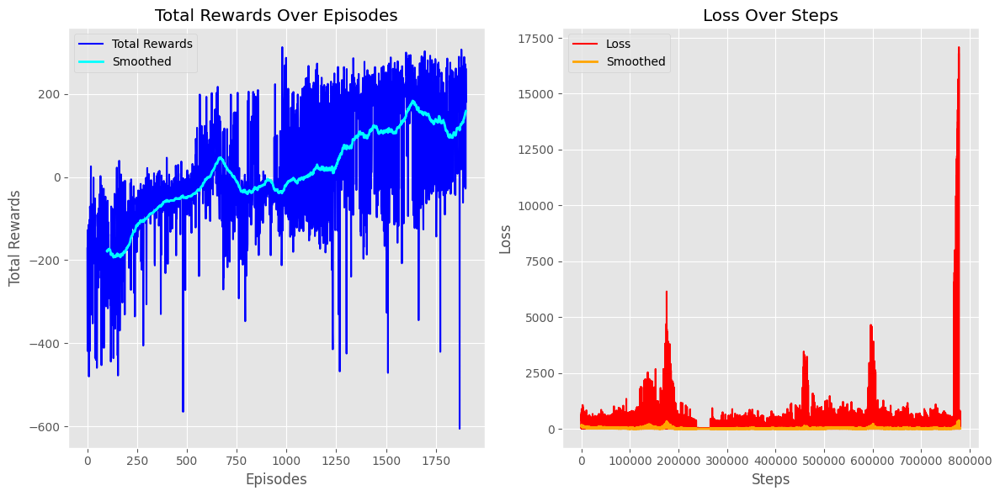


Mean Reward: 158.5863913998559


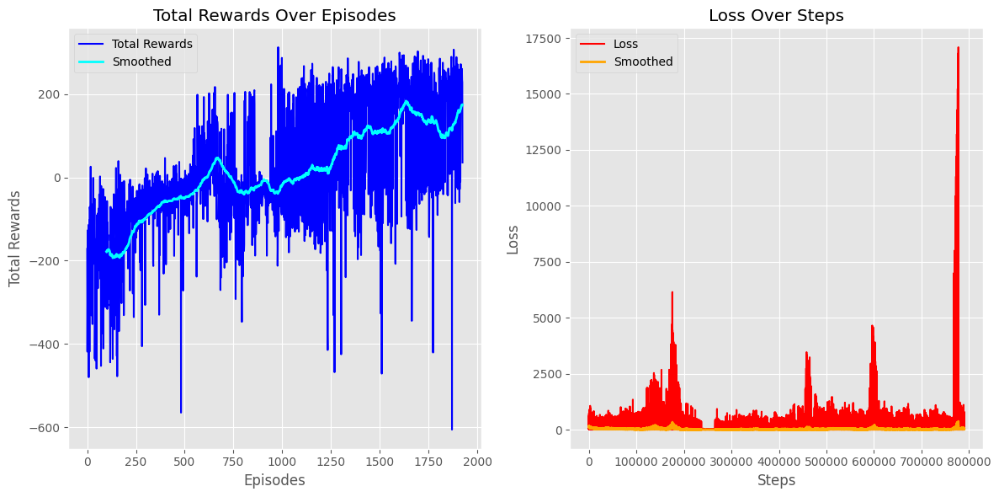


Mean Reward: 174.00669019165628


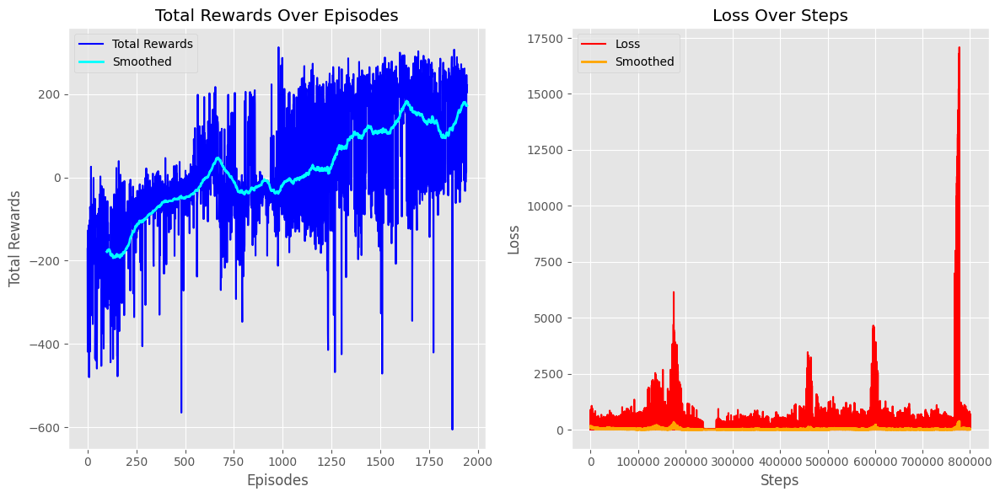


Mean Reward: 172.2428181391933


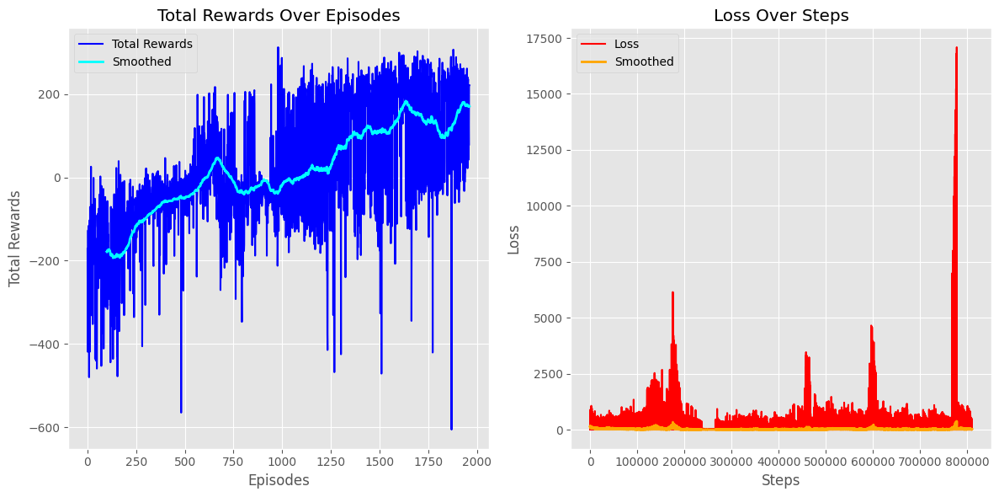


Mean Reward: 170.67550286547512


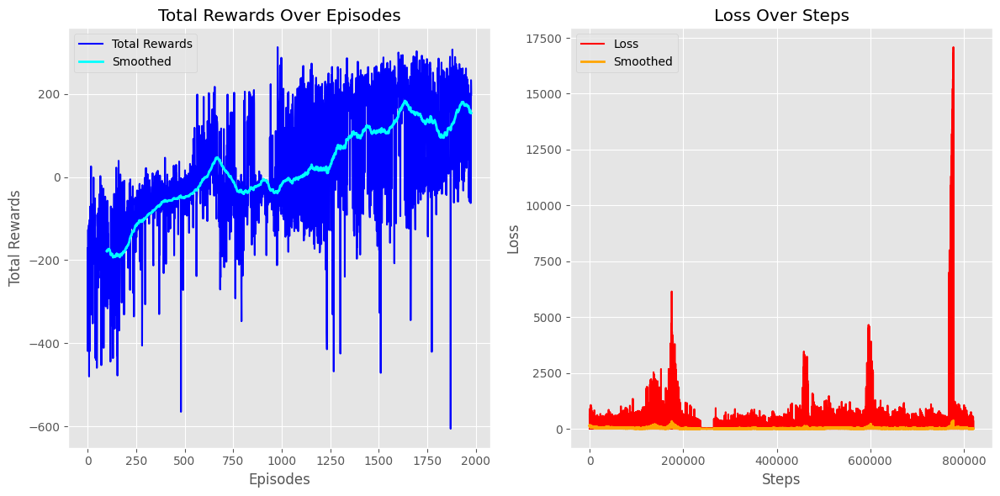


Mean Reward: 153.97975299588848


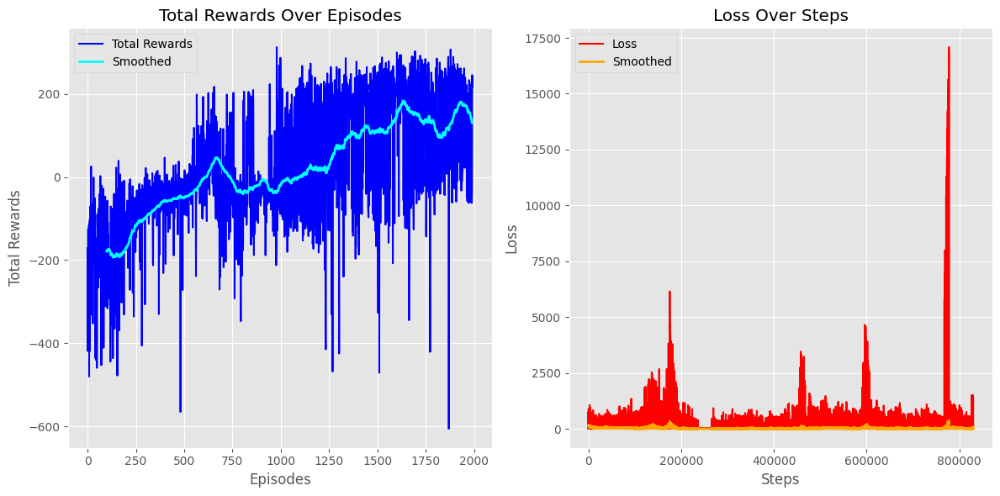


Mean Reward: 130.1517139105615


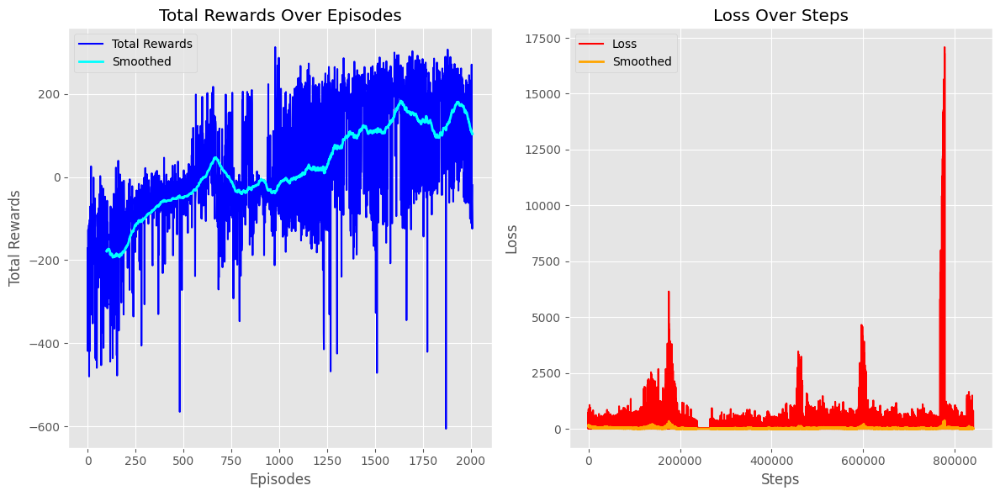


Mean Reward: 103.05926431160952


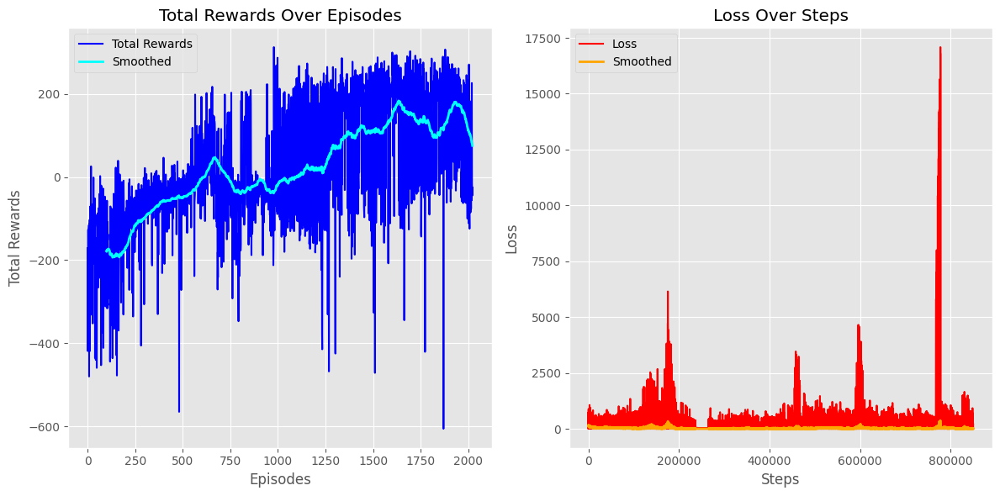


Mean Reward: 75.41271749611845


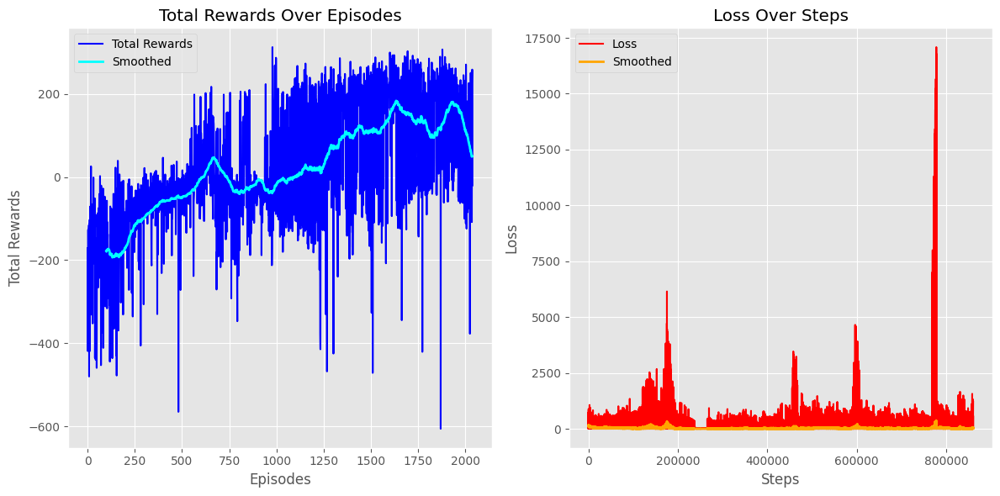


Mean Reward: 50.26689421018639


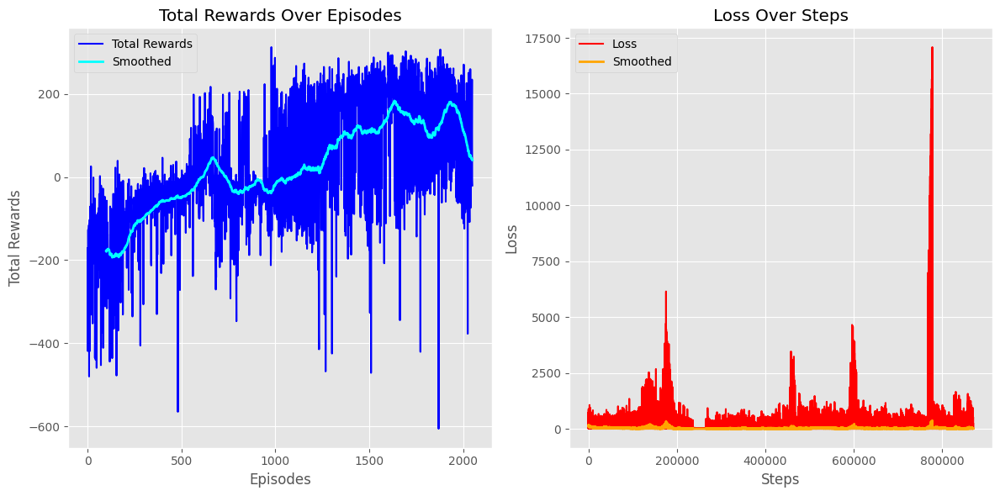


Mean Reward: 40.63549458897162


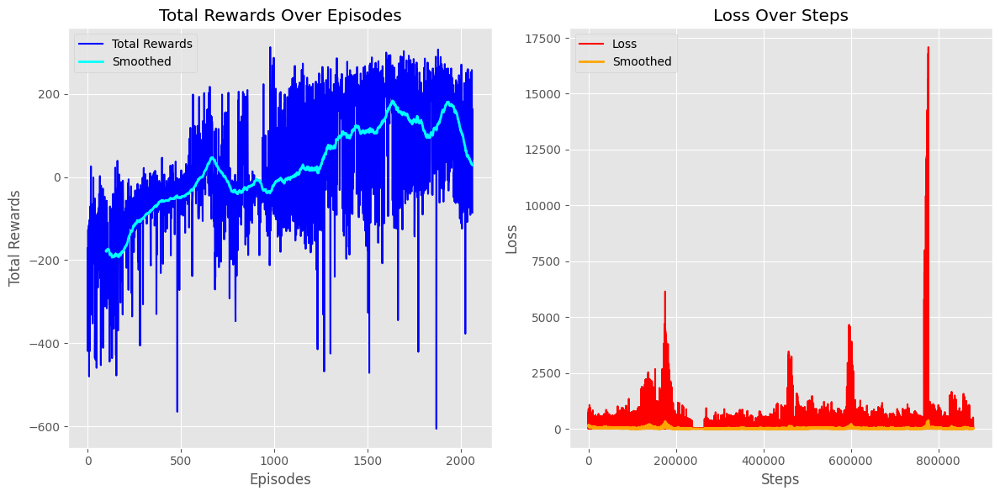


Mean Reward: 28.783962050410736


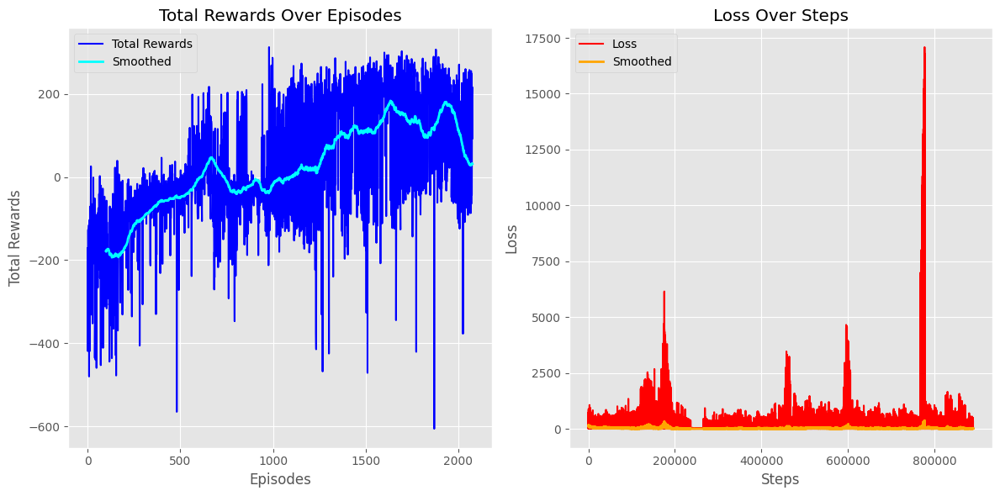


Mean Reward: 31.511890833056754


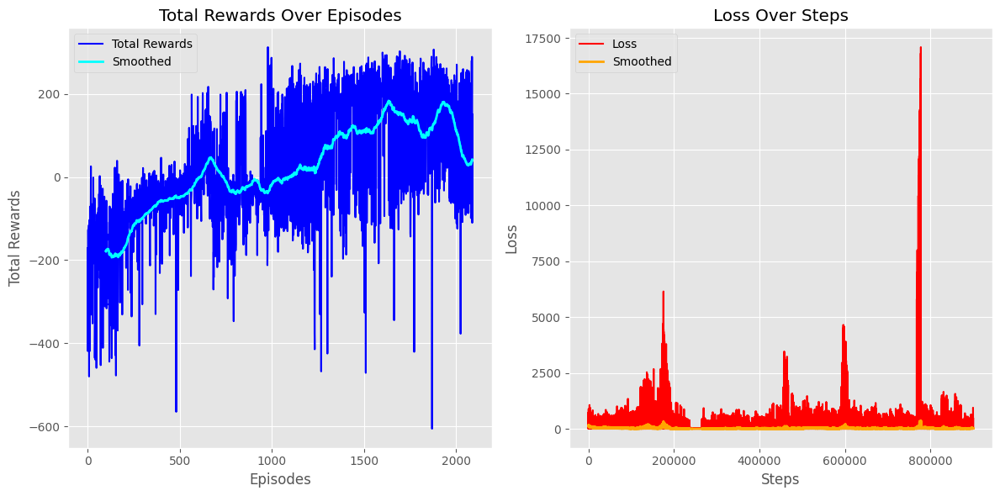


Mean Reward: 41.77709916574496


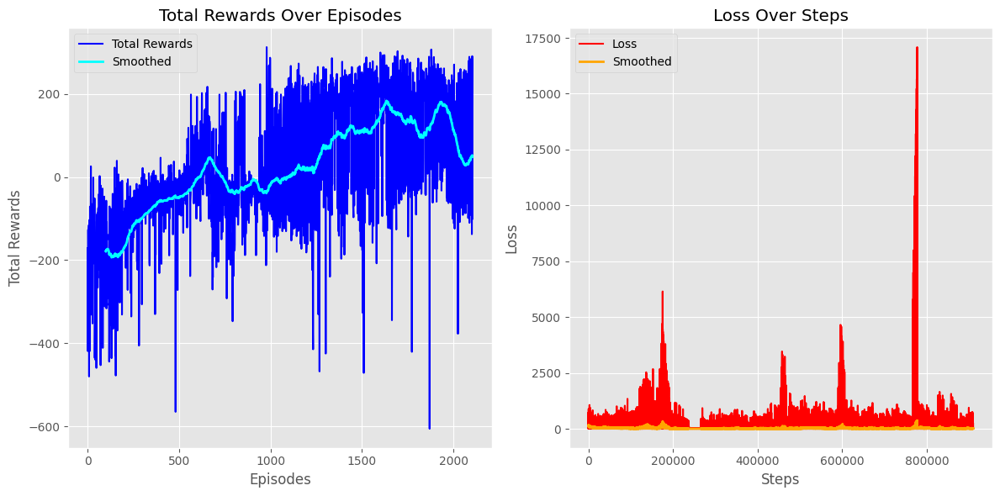


Mean Reward: 48.4485758757561


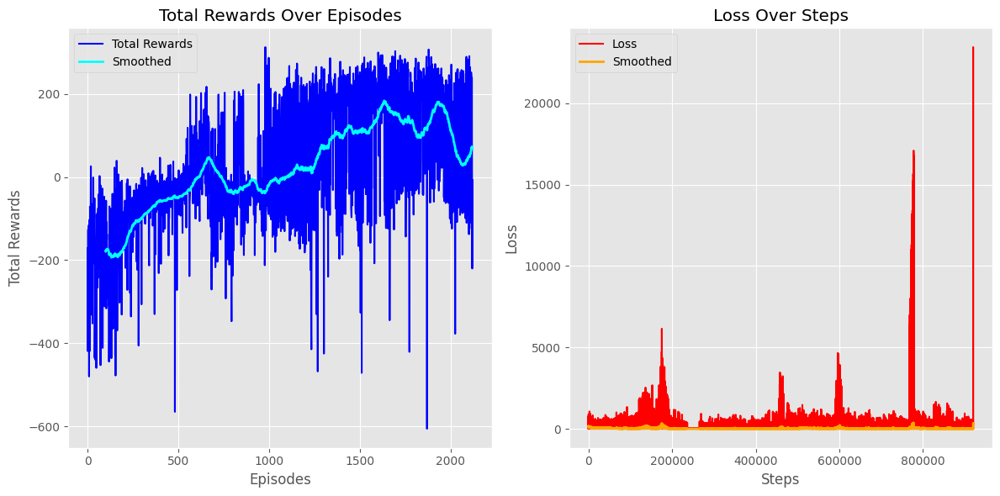


Mean Reward: 68.69132723325025


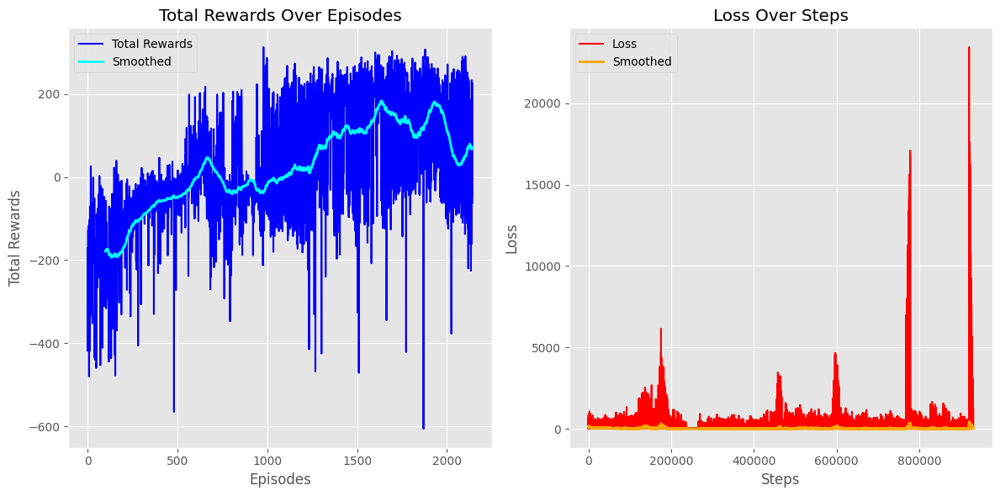


Mean Reward: 70.79749749662331


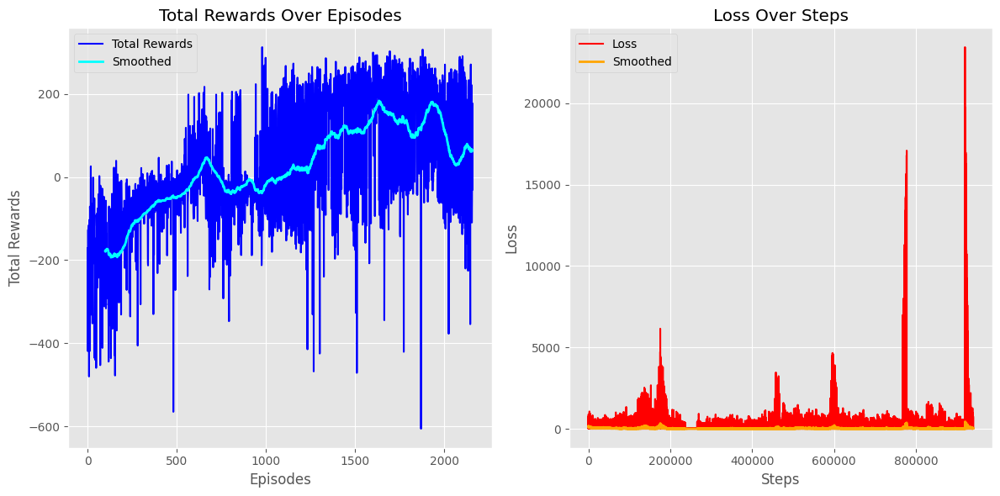


Mean Reward: 64.0672573494349


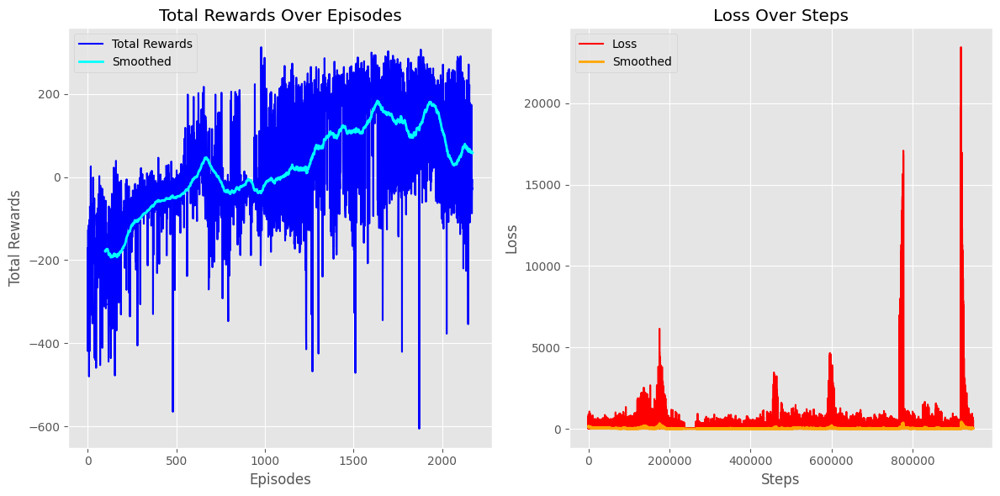


Mean Reward: 57.60587392698199


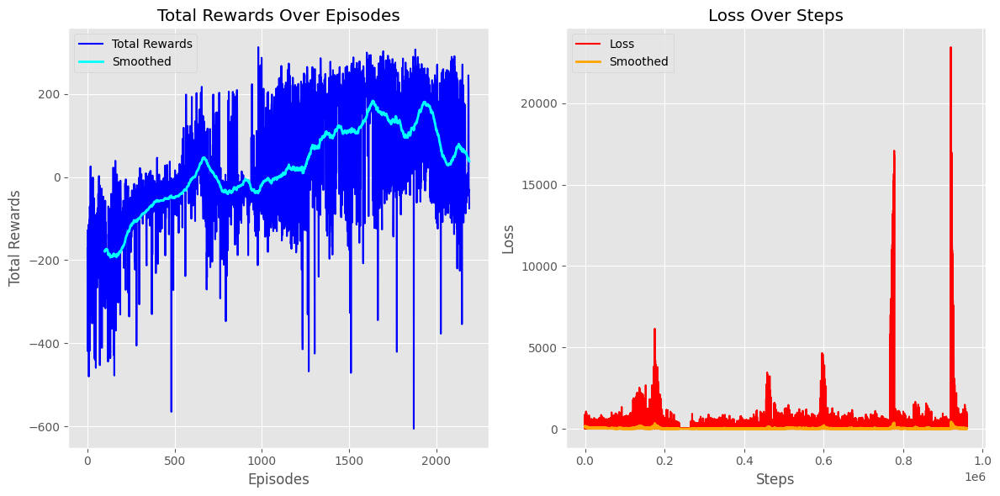


Mean Reward: 37.73300558076401


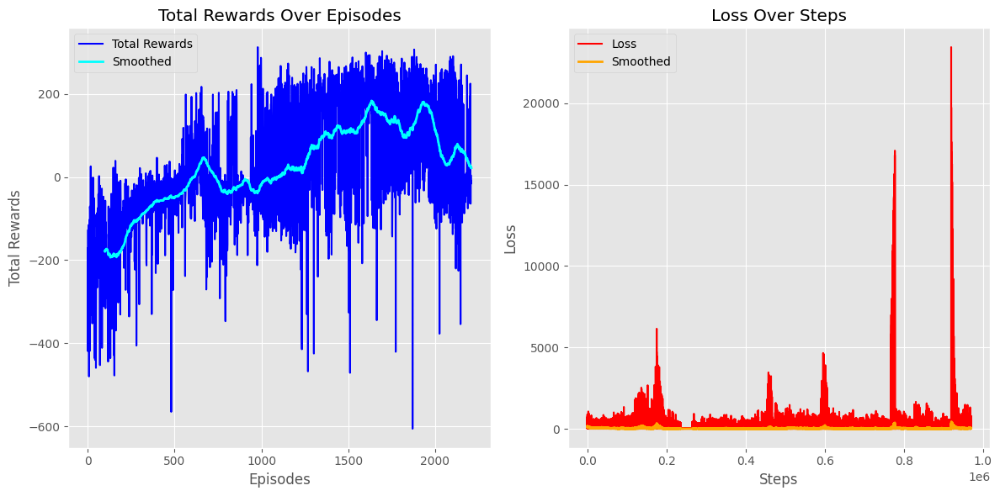


Mean Reward: 21.7548898034418


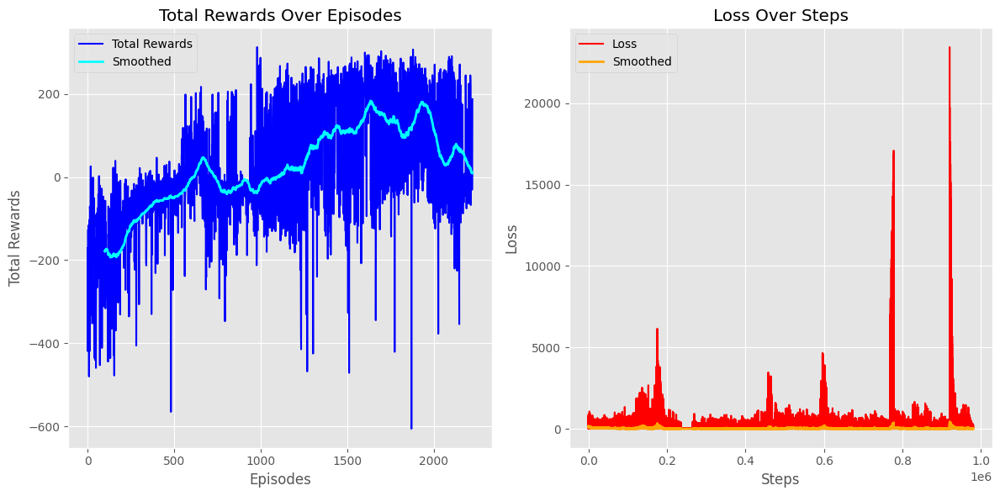


Mean Reward: 9.271954963370415


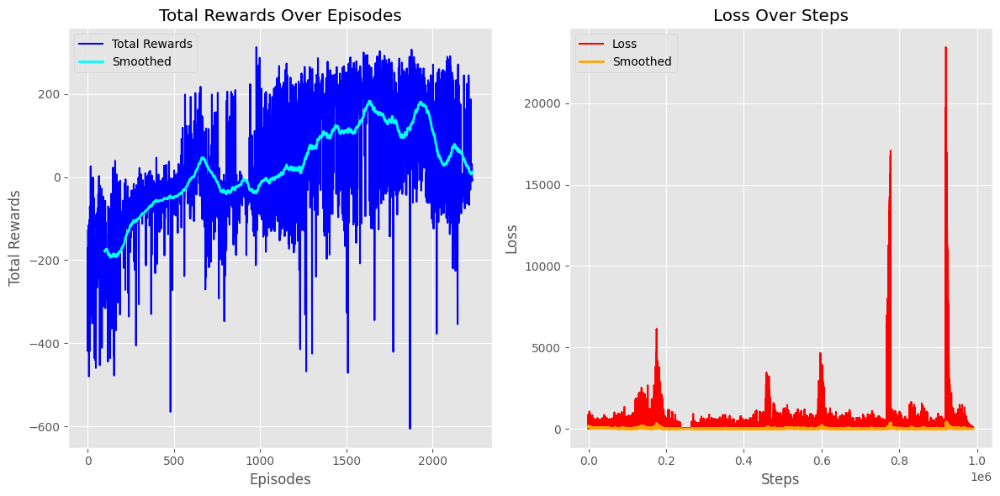


Mean Reward: 11.904693090397013


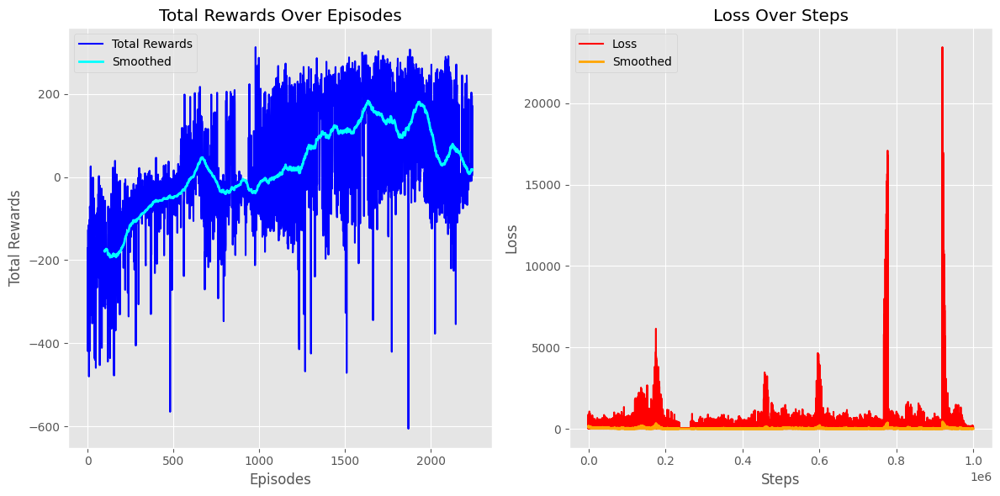


Mean Reward: 18.220302308126595


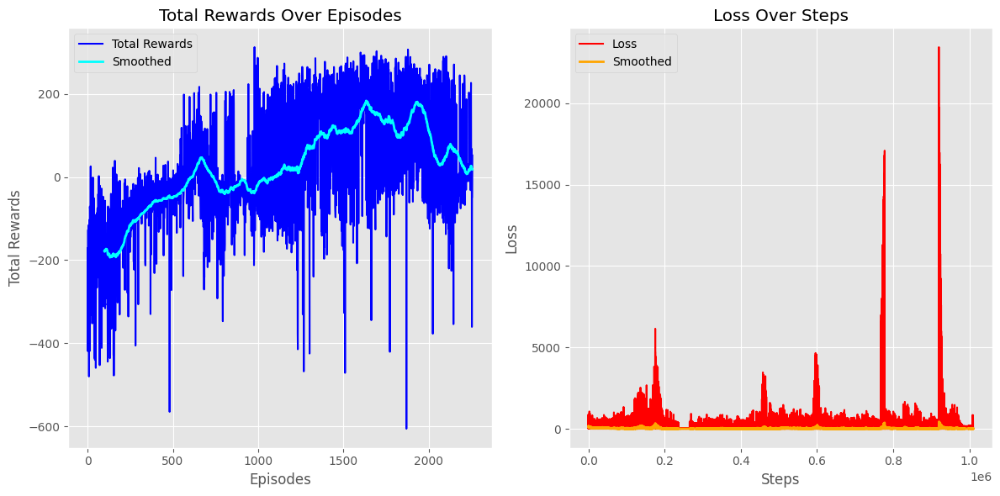


Mean Reward: 18.31382972591474


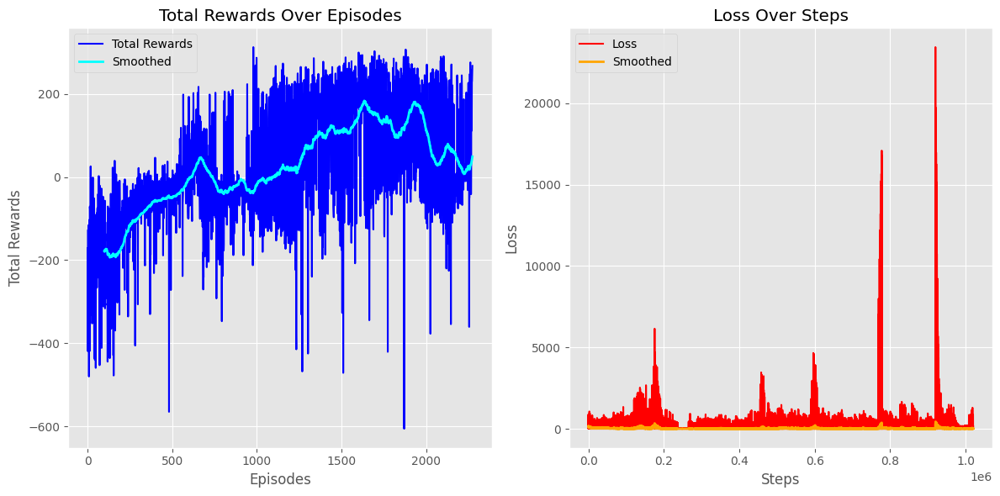


Mean Reward: 49.01960087567464


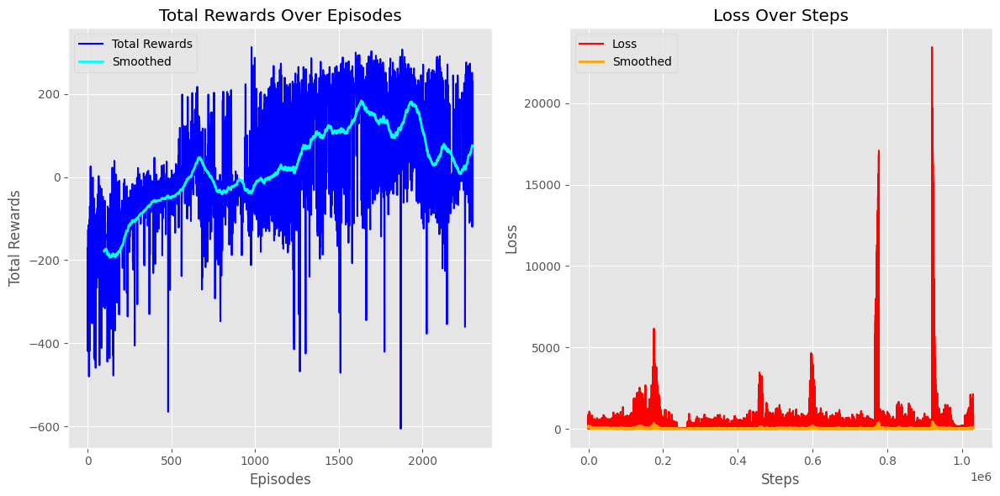


Mean Reward: 75.56852638429828


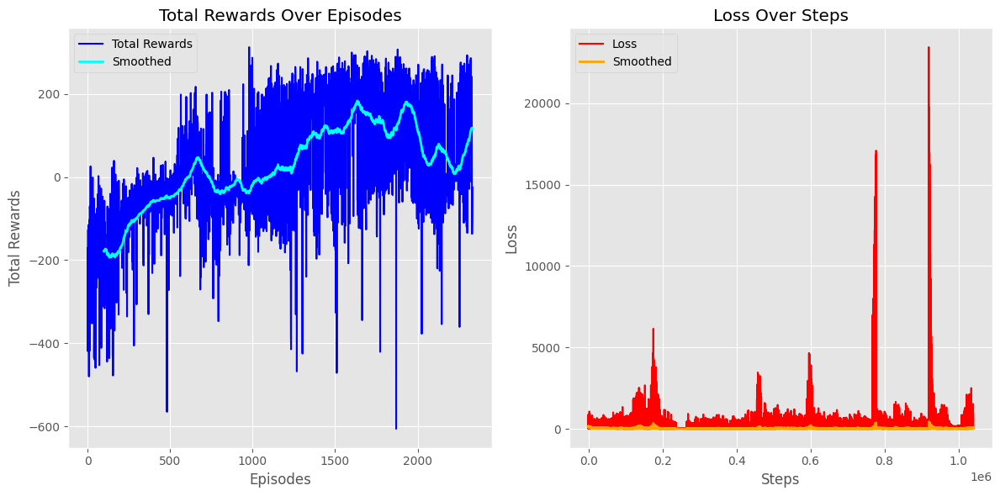


Mean Reward: 115.53631515114975


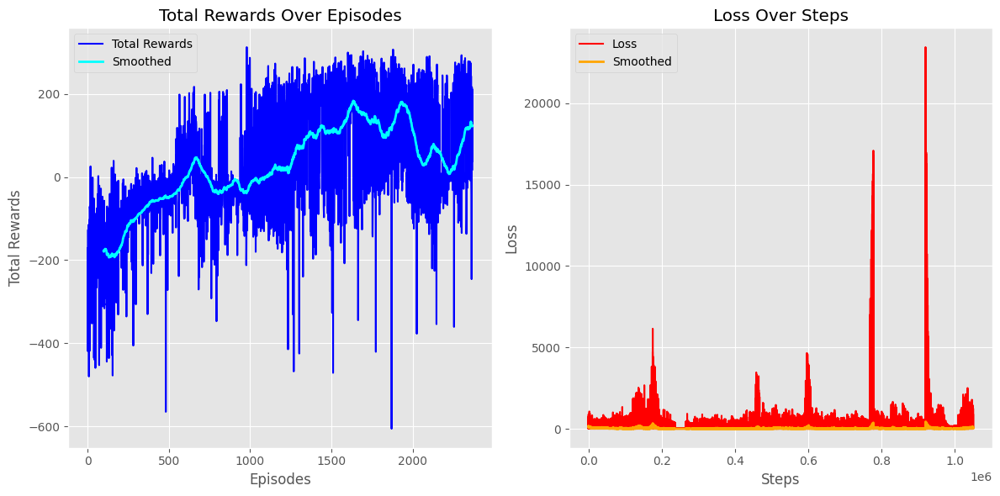


Mean Reward: 122.47841625605116


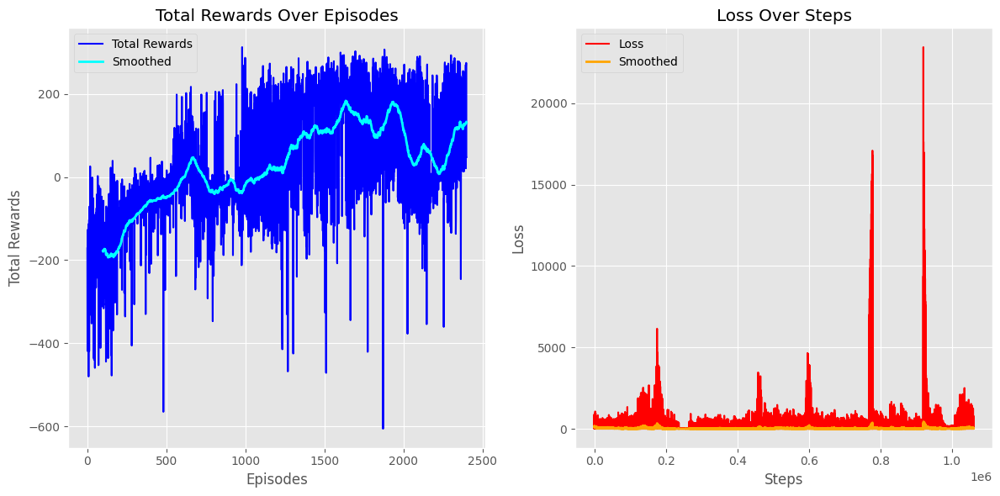


Mean Reward: 130.88248606876144


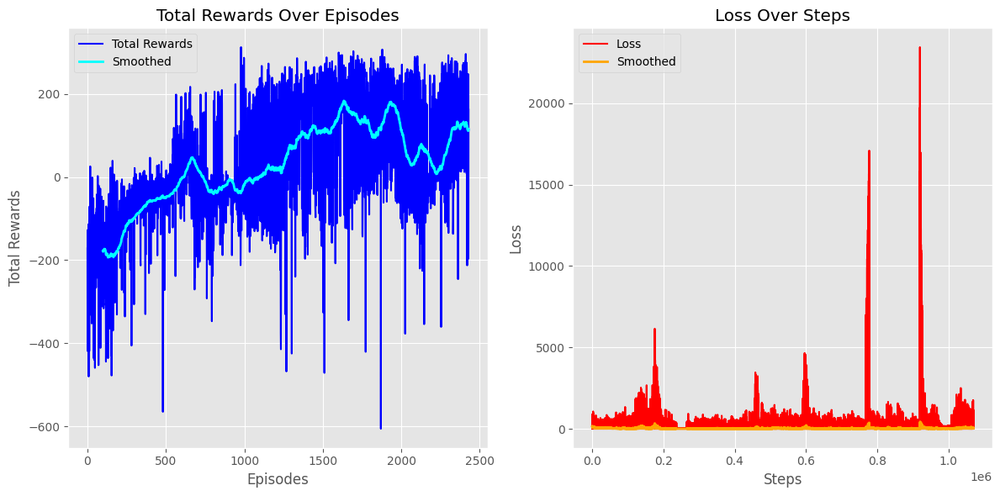


Mean Reward: 113.2027870237064


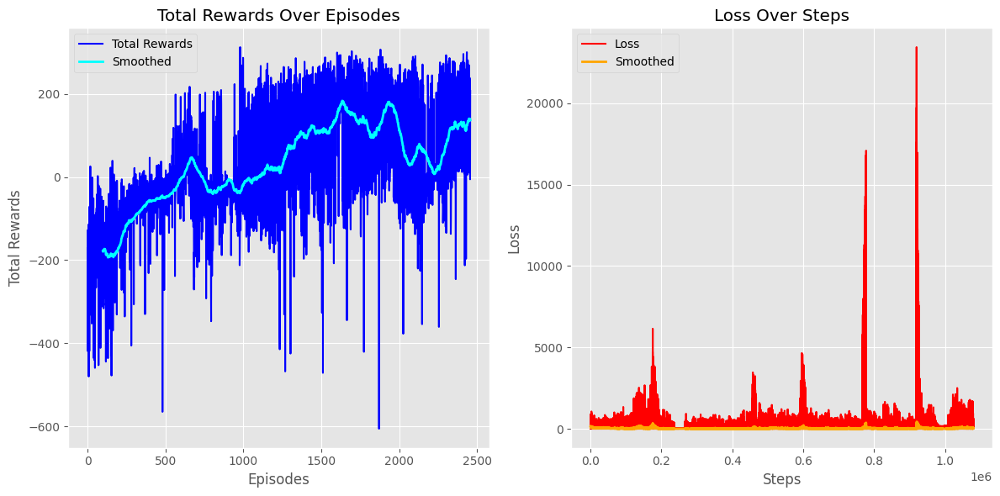


Mean Reward: 136.61635682498866


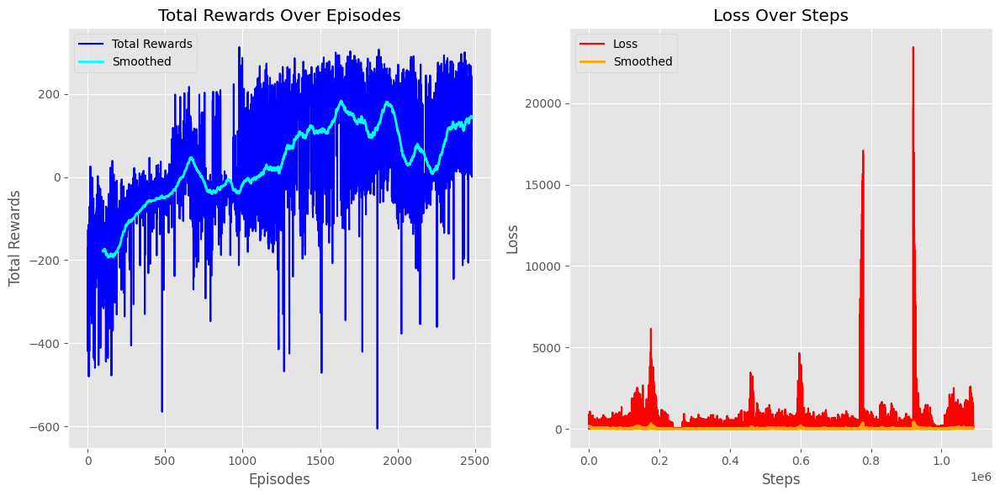


Mean Reward: 142.77823168120986


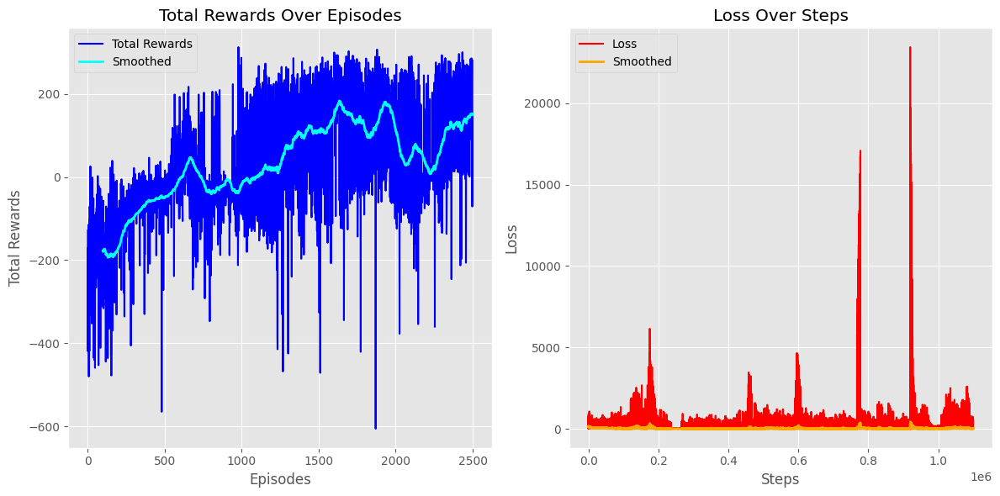


Mean Reward: 151.00024466047628


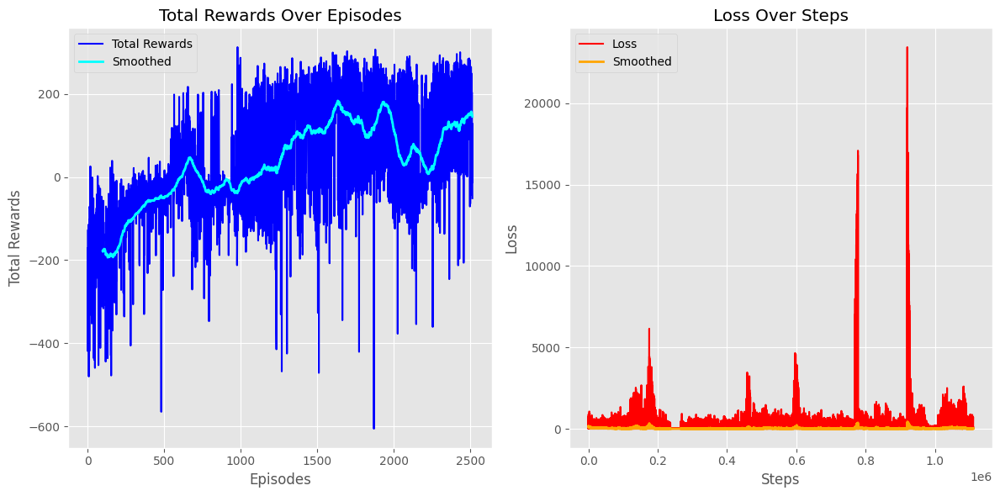


Mean Reward: 145.460791962372


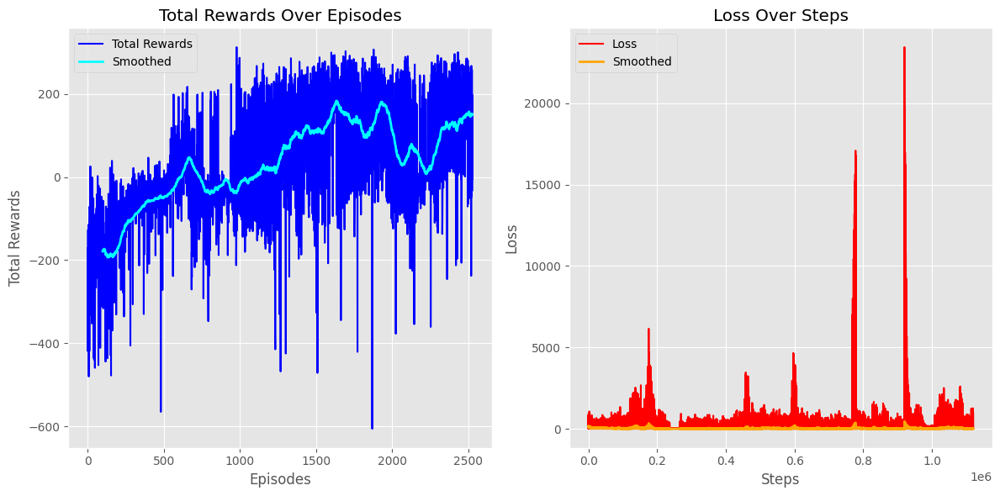


Mean Reward: 150.75724098460844


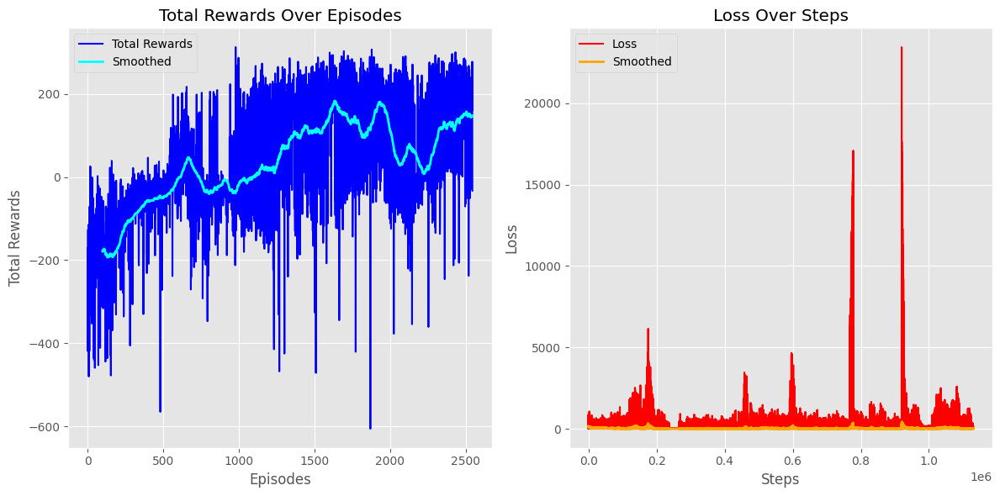


Mean Reward: 145.0450038597065


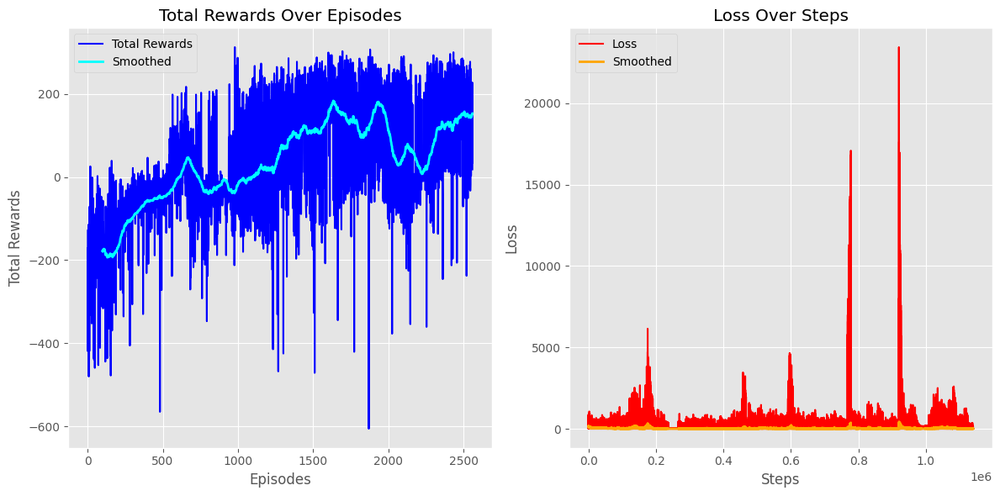


Mean Reward: 152.82361769134204


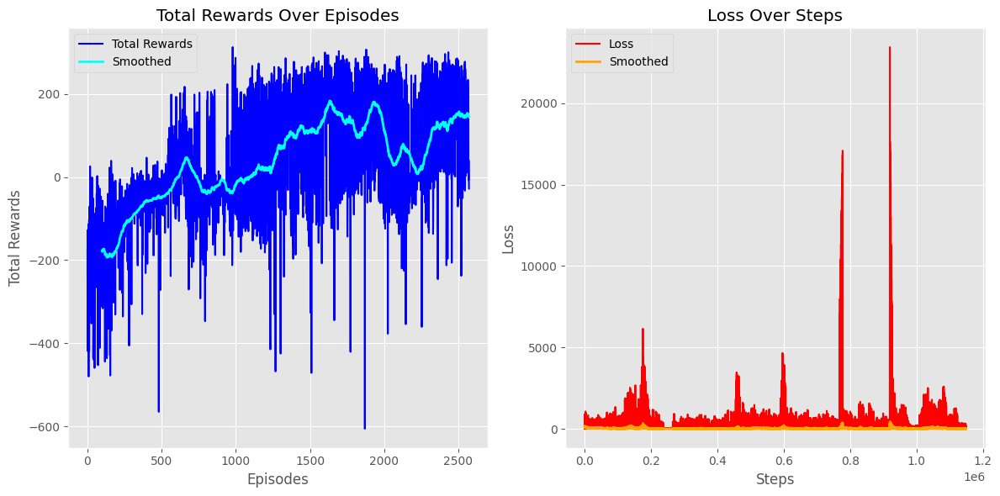


Mean Reward: 144.59599277279384


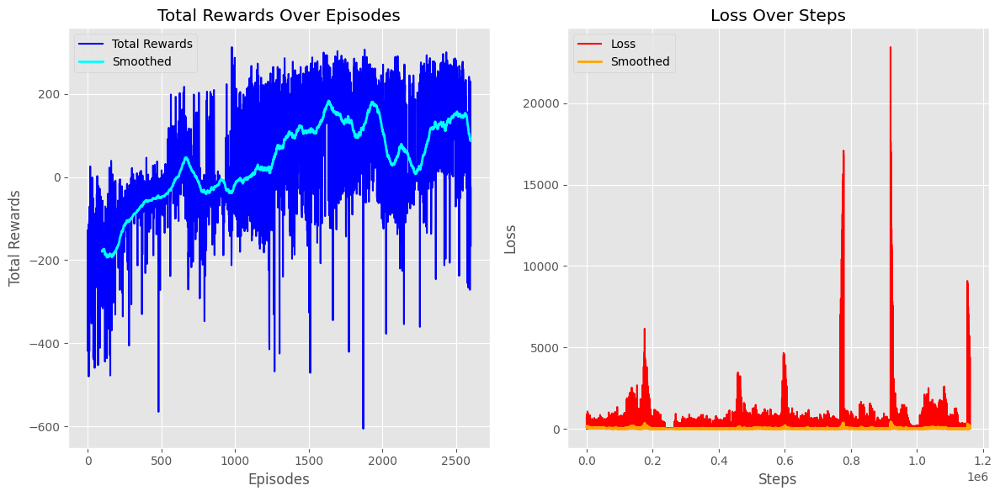


Mean Reward: 86.87527657657222


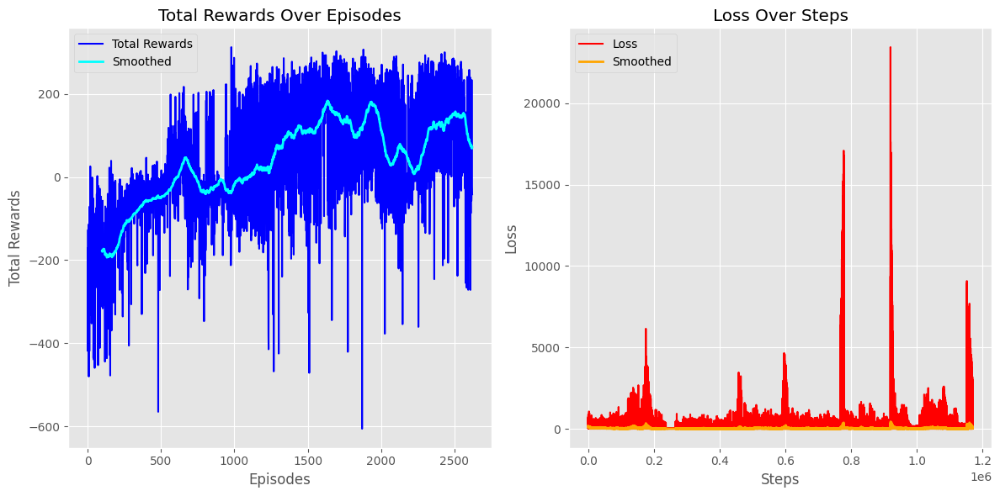


Mean Reward: 70.84007298932129


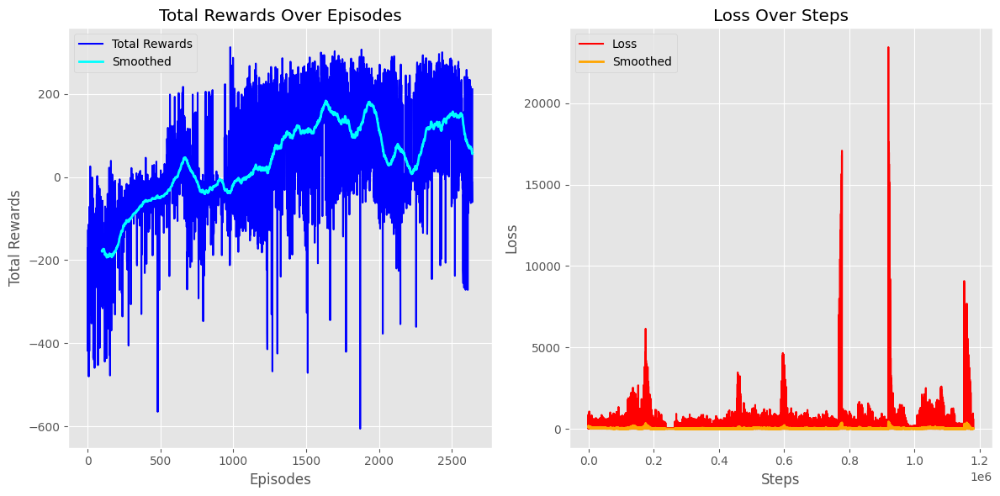


Mean Reward: 56.005037390733726


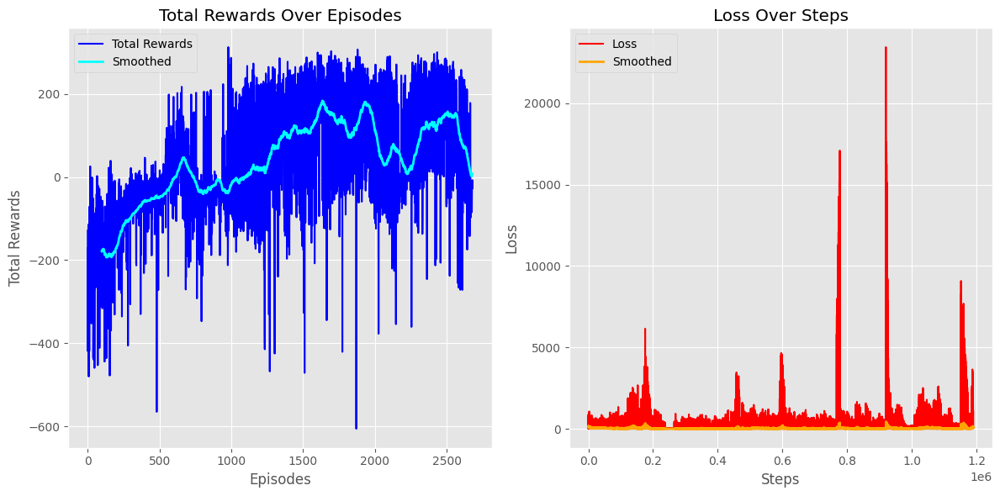


Mean Reward: 7.7898220467575126


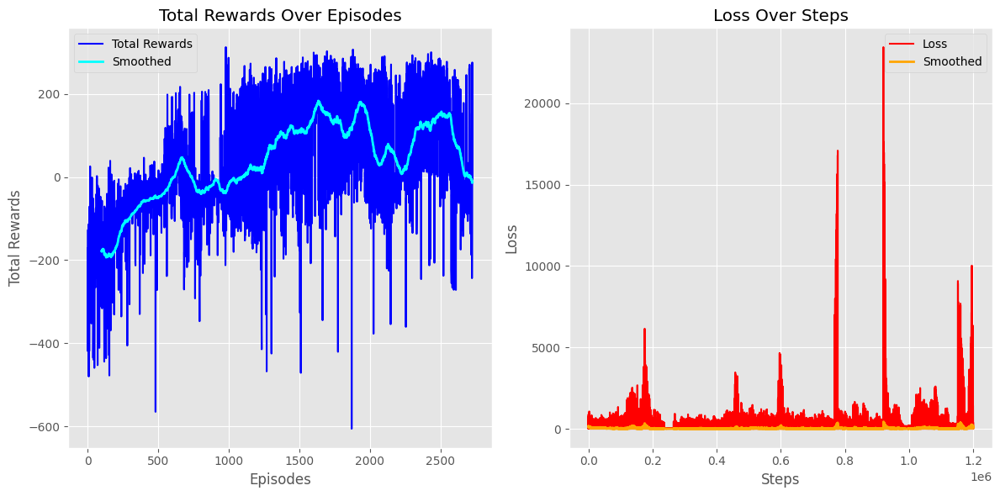


Mean Reward: -12.008864317346916


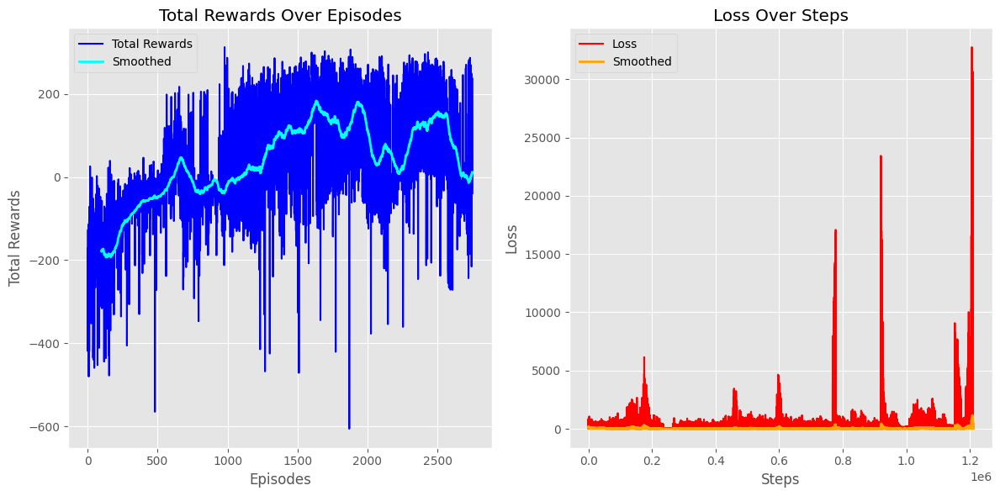


Mean Reward: 11.49094788783604


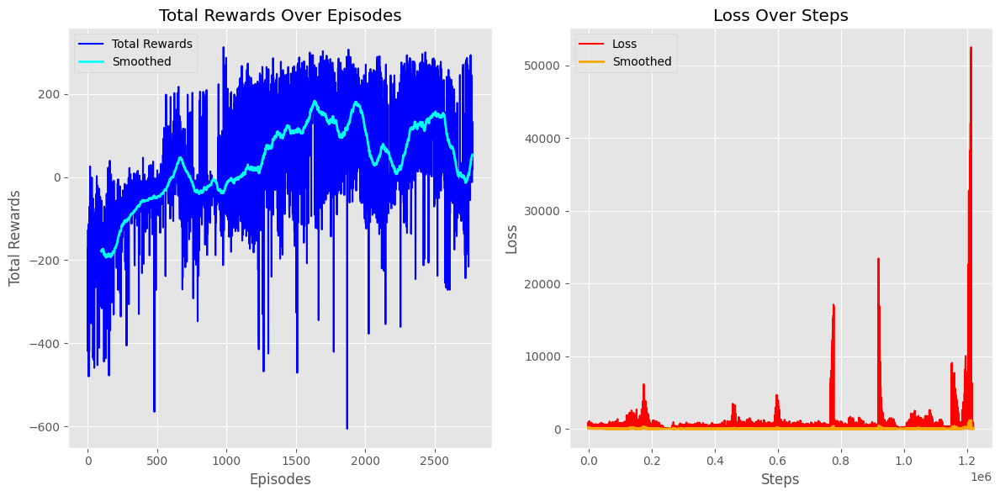


Mean Reward: 53.56108121510085


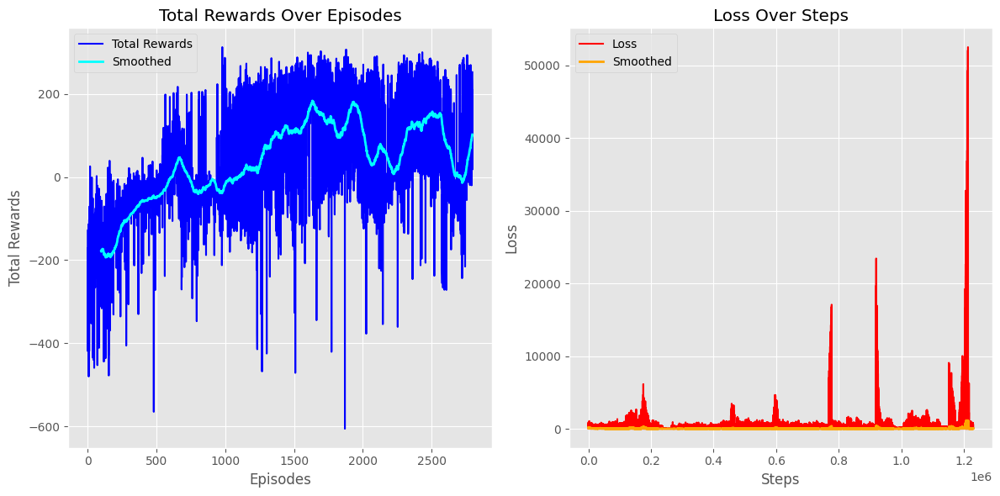


Mean Reward: 102.00319950737747


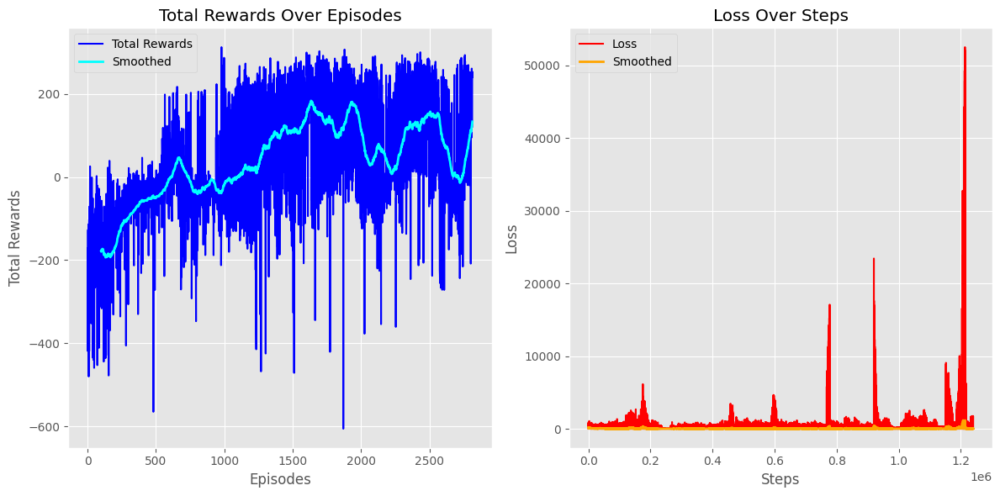


Mean Reward: 132.94189446073406


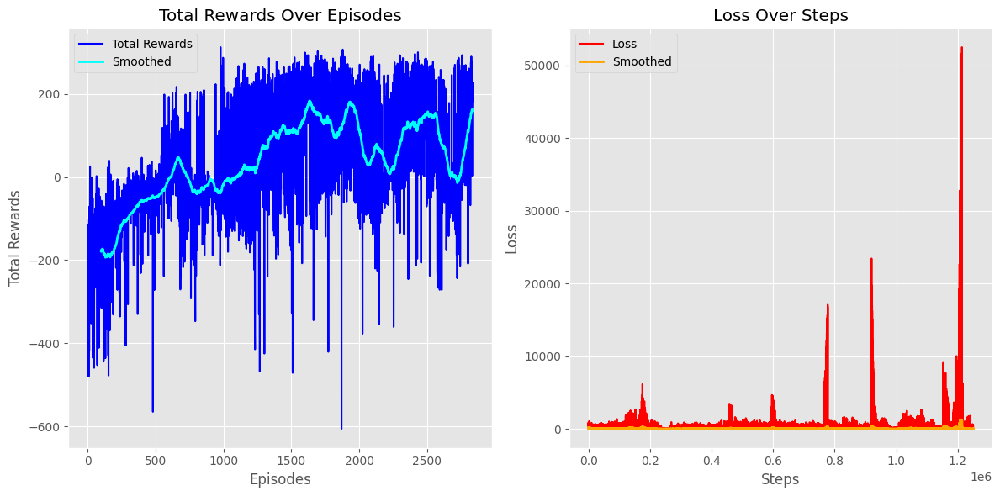


Mean Reward: 161.70841995581887


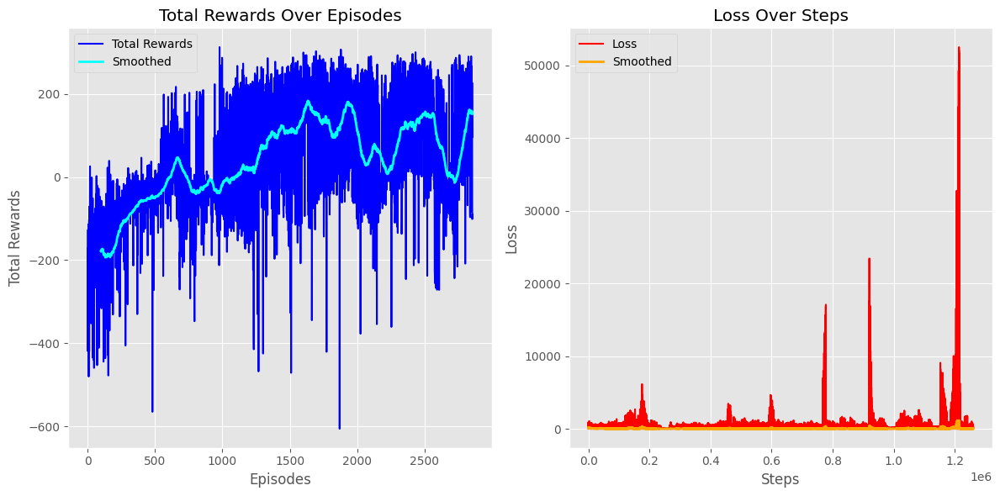


Mean Reward: 151.7917176148777


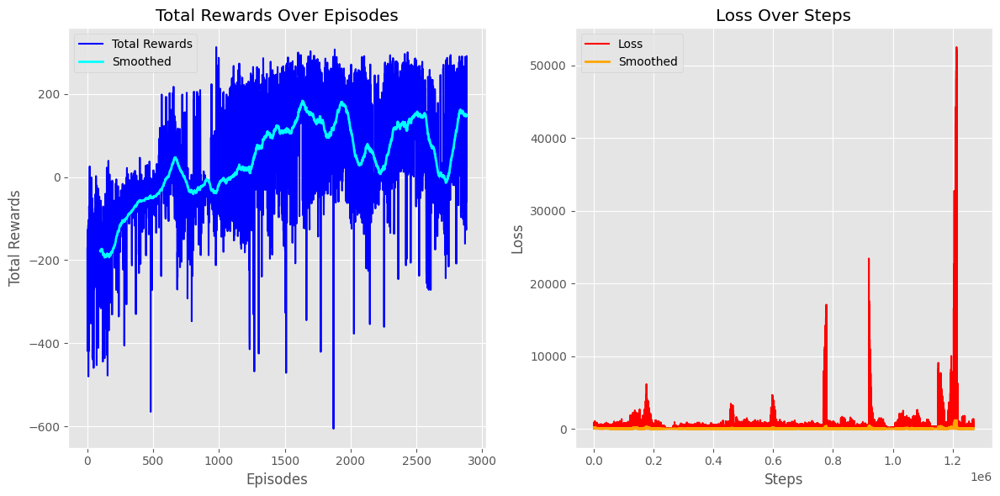


Mean Reward: 147.30657598682708


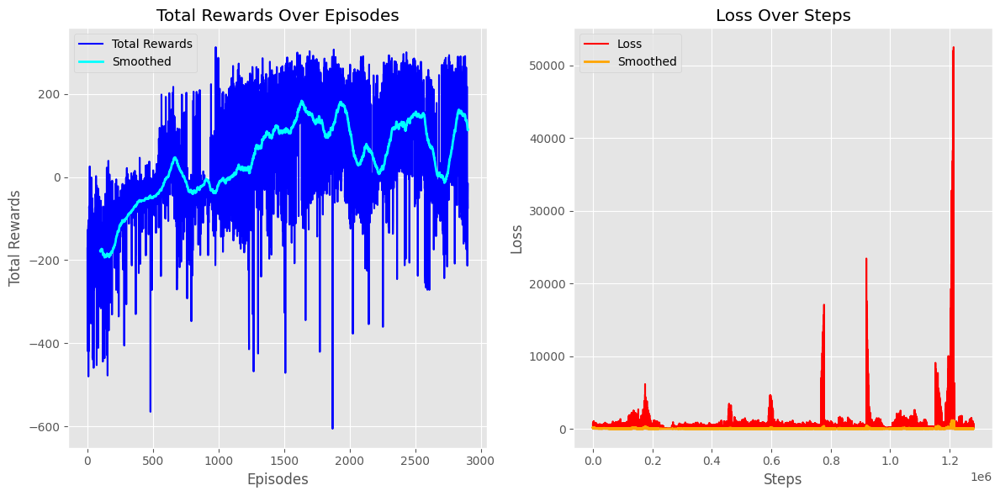


Mean Reward: 113.77349241184668


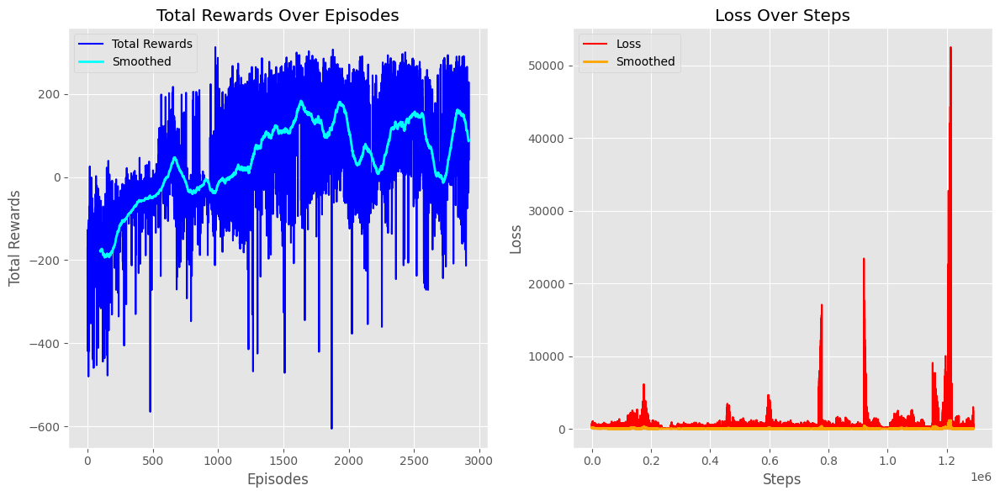


Mean Reward: 88.24171242780002


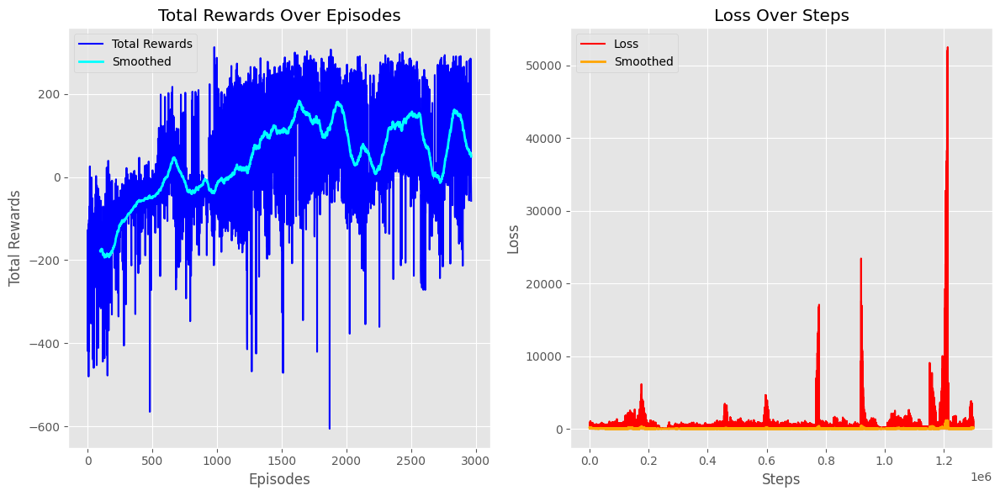


Mean Reward: 49.30096937062441


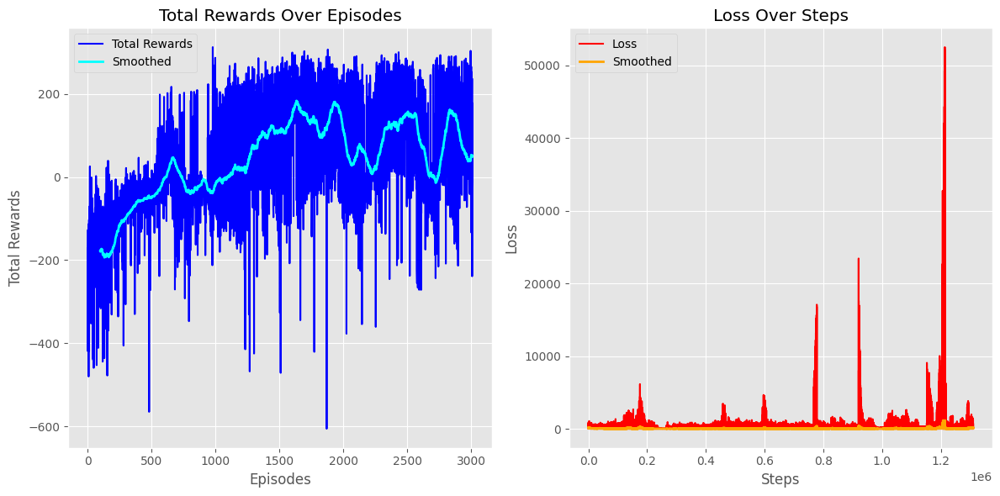


Mean Reward: 51.405169026367695


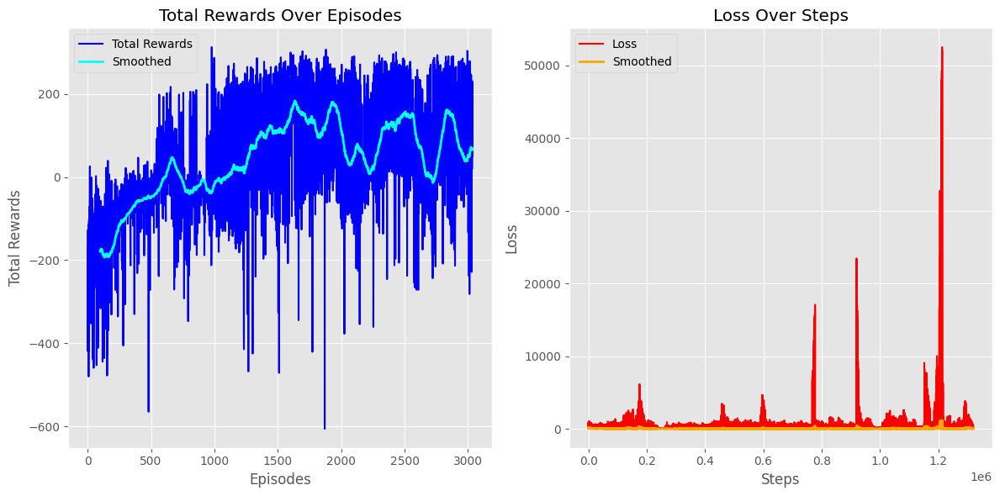


Mean Reward: 67.88780602674069


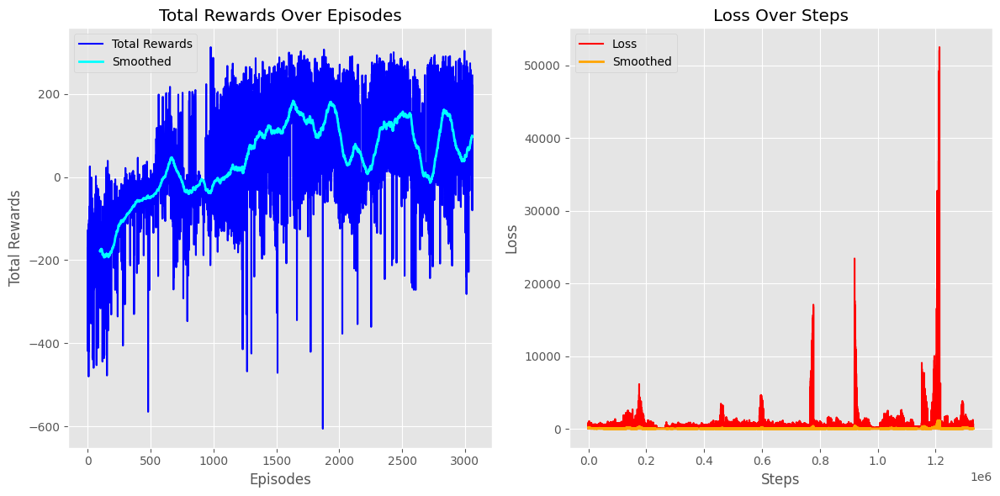


Mean Reward: 97.6955883474628


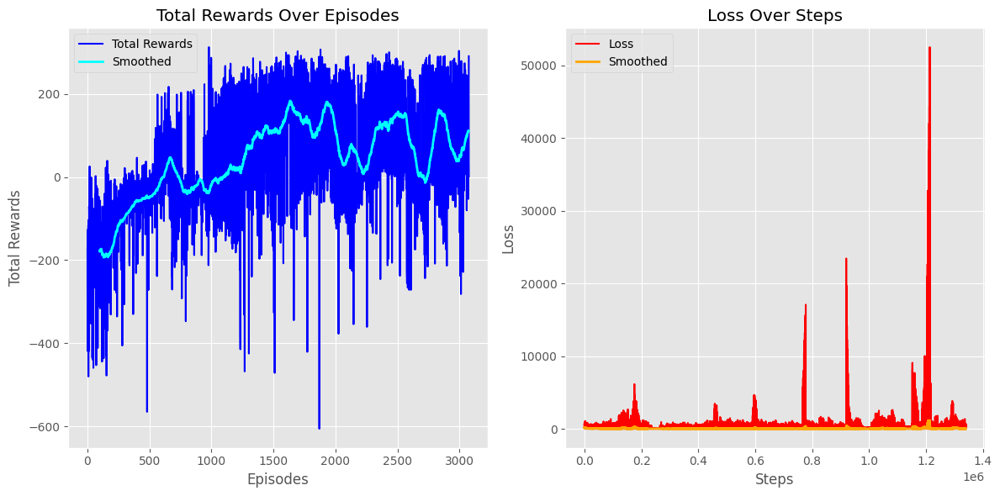


Mean Reward: 110.86719035434548


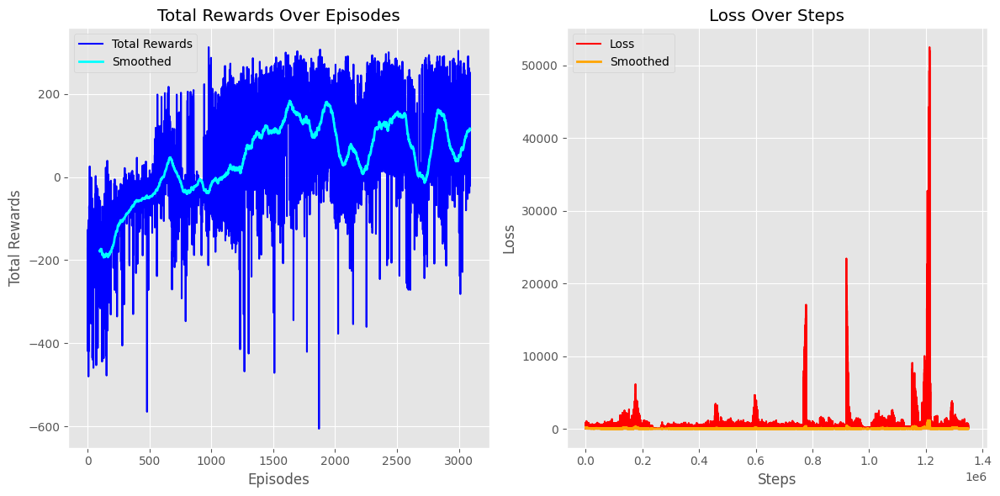


Mean Reward: 116.28204492513849


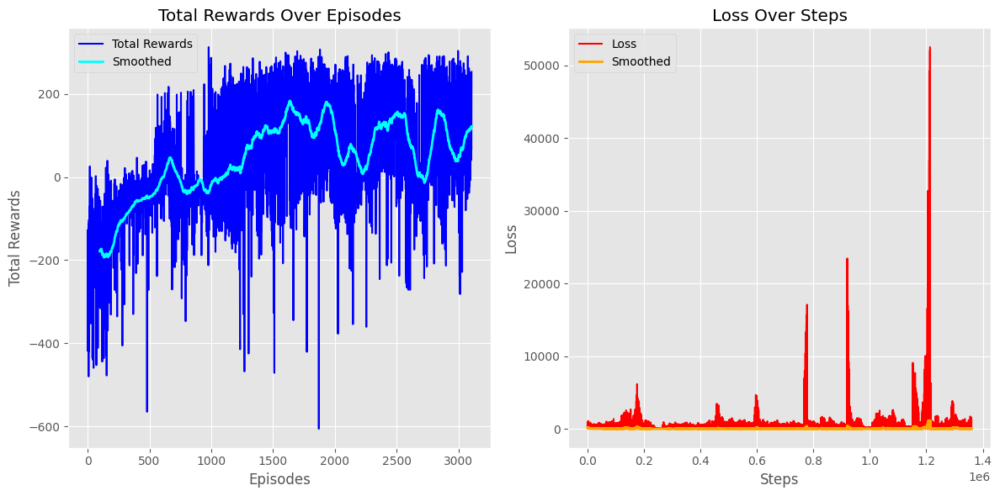


Mean Reward: 121.6184579637392


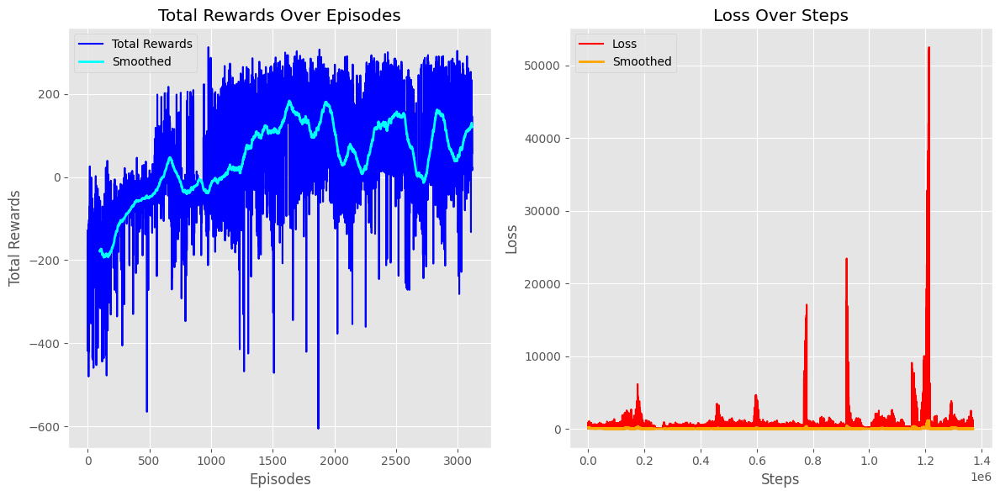


Mean Reward: 120.3508311423547


KeyboardInterrupt: 

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

net = DQN(env.observation_space.shape[0], env.action_space.n).to(device)
tgt_net = DQN(env.observation_space.shape[0], env.action_space.n).to(device)

buffer = ExperienceBuffer(REPLAY_BUFFER_SIZE)

agent = Agent(env, buffer)

epsilon = EPSILON_START

optimizer = optim.Adam(net.parameters(), lr=LEARNING_RATE)

# Lists to track total rewards and losses over training
total_rewards = []
losses = []

# Initialize time variables for tracking training time
ts = time.time()
best_mean_reward = None
obs_id = 0

while True:
    obs_id += 1

    # Update exploration rate based on epsilon decay schedule
    epsilon = max(EPSILON_FINAL, EPSILON_START - obs_id/EPSILON_DECAY_OBS)

    # Agent takes a step in the environment, receives a reward
    reward = agent.step(net, epsilon, device=device)

    if reward is not None:
        # Store total rewards and update game time
        total_rewards.append(reward)
        game_time = time.time() - ts
        ts = time.time()
        mean_reward = np.mean(total_rewards[-100:])

        if best_mean_reward is None or best_mean_reward < mean_reward:
            torch.save(net.state_dict(), './lunar_lander-best.dat')

            if best_mean_reward is None:
                last = mean_reward
                best_mean_reward = mean_reward

            if best_mean_reward is not None and best_mean_reward - last > 10:
                last = best_mean_reward
                print("GAME : {}, TIME ECLAPSED : {}, EPSILON : {}, MEAN_REWARD : {}"
                      .format(obs_id, game_time, epsilon, mean_reward))
                print("Reward {} -> {} Model Saved".format(best_mean_reward, mean_reward))

            best_mean_reward = mean_reward

        if mean_reward > MEAN_GOAL_REWARD:
            print("SOLVED in {} obs".format(obs_id))
            break

    # Continue training if the replay buffer size is below the minimum required
    if len(buffer) < REPLAY_MIN_SIZE:
        continue

    # Synchronize target network with the Q-network at regular intervals
    if obs_id % SYNC_TARGET_OBS == 0:
        tgt_net.load_state_dict(net.state_dict())

    # Implement the training process (calculating loss, backpropagation, and optimizer step)
    batch = buffer.sample(batch_size=BATCH_SIZE)

    # Loss calculation
    loss = cal_loss(batch, net, tgt_net, device=device)

    # Perform backpropagation
    optimizer.zero_grad()
    loss.backward()

    # Clip gradients to avoid exploding gradients
    for param in net.parameters():
        param.grad.data.clamp_(-1, 1)

    # Update the parameters of the Q-network
    optimizer.step()

    # Append the loss value to the list of losses
    losses.append(loss.item())

    # Plot learning curves every few episodes or steps
    if obs_id % 10000 == 0:
        plt.figure(figsize=(12, 6))
        plt.style.use('ggplot')
        plt.subplot(1, 2, 1)
        plt.plot(total_rewards, label='Total Rewards', color='blue')
        pd.Series(total_rewards).rolling(window=100).mean().plot(style='-', lw=2, color='cyan', label='Smoothed')
        plt.xlabel('Episodes')
        plt.ylabel('Total Rewards')
        plt.title('Total Rewards Over Episodes')
        plt.legend()
        plt.grid(True)

        plt.subplot(1, 2, 2)
        plt.plot(losses, label='Loss', color='red')
        pd.Series(losses).rolling(window=100).mean().plot(style='-', lw=2, color='orange', label='Smoothed')
        plt.xlabel('Steps')
        plt.ylabel('Loss')
        plt.title('Loss Over Steps')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()

        print("\nMean Reward:", mean_reward)

# Visual Comparison:

write a function to render and display the environment before and after training. What visual differences do you observe in the agent's behavior? Discuss it. Also, Upload the Videos with your notebook. You can use the following library for rendering and saving videos.

In [15]:
import imageio

# Helper function for rendering and saving a video
def render_and_save_video(env, net, episodes=10, save_path="./render_video.mp4", device="cpu"):
    writer = imageio.get_writer(save_path, format='ffmpeg', fps=30)
    for _ in range(episodes):
        # Reset the environment for each episode
        state = env.reset()
        done = False

        # Run the episode until termination
        while not done:
            # Render the environment
            frame = env.render(mode='rgb_array')

            # Append the frame to the video
            writer.append_data(frame)

            # Choose an action using the neural network
            with torch.no_grad():
                state_v = torch.tensor([state], device=device, dtype=torch.float32)
                q_values = net(state_v).detach().cpu().numpy()
                action = np.argmax(q_values)

            # Take the action in the environment
            next_state, _, done, _ = env.step(action)
            state = next_state

    writer.close()

# Render and save a video before training
# print("### BEFORE TRAINING ###")
# render_and_save_video(env, net, device=device,save_path = './before.mp4')

# Render and save a video after training
print("### AFTER TRAINING ###")
render_and_save_video(env, net, device=device,save_path = './after.mp4')

### BEFORE TRAINING ###


/usr/local/lib/python3.10/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(


### AFTER TRAINING ###


# Question:

Exploration (Epsilon-Greedy):

Discuss the significance of the exploration strategy, specifically the Epsilon-Greedy approach, in balancing exploration and exploitation during training.</br>
Note that if we don't explore, the agent won't be able to explore other and better actions and will get stuck in a sub-optimal solution. So we must keep the balance between exploration and exploitation using methods like Epsilon-Greedy. Also we must decay the epsilon in the training phase because with the passage of time the models policy will be improved and we don't want to take sub-optimal or bad actions when the model has made some progress.